code aquired from these repositories:
https://github.com/maitek/image_stacking/blob/master/auto_stack.py
https://github.com/WaseemKn/FuzzyColorImageEnhancement-FuzzyLogicCourse-ITE5thYear/blob/master/fuzzyImageEnhacement.ipynb

All functions below until the next markdown cell are acquired from:https://github.com/WaseemKn/FuzzyColorImageEnhancement-FuzzyLogicCourse-ITE5thYear/blob/master/fuzzyImageEnhacement.ipynb

In [1]:
pip install Image

Note: you may need to restart the kernel to use updated packages.


In [2]:
import cv2 as cv
import os
import numpy as np
import math
import time
from matplotlib import pyplot as plt

In [51]:
n = 2 # number of rows (windows on columns)
m = 2 # number of colomns (windows on rows)
EPSILON = 0.00001
#GAMMA, IDEAL_VARIANCE 'maybe' have to changed from image to another 
GAMMA = 1 # Big GAMMA >> Big mean >> More Brightness
IDEAL_VARIANCE = 0.35 #Big value >> Big variance >> Big lamda >> more contrast

In [67]:
img_name = 'COVID-10.png'
img = cv.imread(img_name)
#img = cv.resize(img, (200, 200))
layer = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
WIDTH = layer.shape[1]
HEIGHT = layer.shape[0]
x0, x1, y0, y1 = 0, WIDTH - 1, 0, HEIGHT - 1

In [68]:
# split the image to windows
def phy(value): # phy: E --> R 
    #if ((1+value)/((1-value)+0.0001)) < 0:
    #print(value)
    return 0.5 * np.log((1+value)/((1-value)+EPSILON))

def multiplication(value1, value2): # ExE --> R
    return phy(value1) * phy(value2)

def norm(value):
    return abs(phy(value))

def scalar_multiplication(scalar, value):# value in E ([-1,1])
    s = (1+value)**scalar
    z = (1-value)**scalar
    res = (s-z)/(s+z+EPSILON)
    return res

def addition(value1, value2): # value1,value2 are in E ([-1,1])
    res = (value1+value2)/(1+(value1*value2)+EPSILON)
    return res

def subtract(value1, value2): # value1,value2 are in E ([-1,1])
    res = (value1-value2)/(1-(value1*value2)+EPSILON)
    return res

def C(m,i):
    return math.factorial(m)/((math.factorial(i)*math.factorial(m-i))+EPSILON)

def qx(i, x): # i: window index in rows, x: number of current pixel on x-axis
    if (x == WIDTH - 1):
        return 0
    return C(m,i)*(np.power((x-x0)/(x1-x), i) * np.power((x1-x)/(x1-x0), m)) #This is the seconf implementation
    #return C(m,i)*((np.power(x-x0,i) * np.power(x1-x,m-i)) / (np.power(x1-x0,m)+EPSILON))

def qy(j, y):
    '''
    The second implementation for the formula does not go into overflow.
    '''
    if (y == HEIGHT - 1):
        return 0
    return C(n,j)*(np.power((y-y0)/(y1-y), j) * np.power((y1-y)/(y1-y0), n)) #This is the seconf implementation
    #return C(n,j)*((np.power((y-y0),j) * np.power((y1-y),n-j))/ (np.power(y1-y0,n)+EPSILON))
    
def p(i, j, x, y):
    return qx(i, x) * qy(j, y)

def mapping(img, source, dest):
    return (dest[1] - dest[0])*((img - source[0]) / (source[1] - source[0])) + dest[0]

In [69]:
e_layer_gray = mapping(layer, (0, 255), (-1, 1))

In [70]:
def cal_ps_ws(m, n, w, h, gamma):
    ps = np.zeros((m, n, w, h))
    for i in range(m):
        for j in range(n):
            for k in range(w):
                for l in range(h):    
                    ps[i, j, k, l] = p(i, j, k, l)

    ws = np.zeros((m, n, w, h))
    for i in range(m):
        for j in range(n):
            ps_power_gamma = np.power(ps[i, j], gamma)
            for k in range(w):
                for l in range(h):    
                    ws[i, j, k, l] = ps_power_gamma[k, l] / (np.sum(ps[:, :, k, l])+EPSILON)
    return ps, ws
print('Ps and Ws calculation is in progress...')
start = time.time()
ps, ws = cal_ps_ws(m, n, WIDTH, HEIGHT, GAMMA)
end = time.time()
print('Ps and Ws calculation has completed successfully in '+str(end-start)+' s')

Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5239105224609375 s


In [71]:
def cal_means_variances_lamdas(w, e_layer):
    means = np.zeros((m, n))
    variances = np.zeros((m, n))
    lamdas = np.zeros((m, n))
    taos = np.zeros((m, n))
    def window_card(w):
        return np.sum(w)

    def window_mean(w, i, j):
        mean = 0
        for k in range(HEIGHT):
            for l in range(WIDTH):
                mean = addition(mean, scalar_multiplication(w[i, j, l, k], e_layer[k, l]))
        mean /= window_card(w[i, j])
        return mean

    def window_variance(w, i, j):
        variance = 0
        for k in range(HEIGHT):
            for l in range(WIDTH):
                variance += w[i, j, l, k] * np.power(norm(subtract(e_layer[k, l], means[i, j])), 2)
        variance /= window_card(w[i, j])
        return variance

    def window_lamda(w, i, j):
        return np.sqrt(IDEAL_VARIANCE) / (np.sqrt(variances[i, j])+EPSILON)

    def window_tao(w, i, j):
        return window_mean(w, i, j)

    for i in range(m):
        for j in range(n):
            means[i, j] = window_mean(ws, i, j)
            variances[i, j] = window_variance(ws, i, j)
            lamdas[i, j] = window_lamda(ws, i, j)
    taos = means.copy()
    
    return means, variances, lamdas, taos
print('means, variances, lamdas and taos calculation is in progress...')
start = time.time()
means, variances, lamdas, taos = cal_means_variances_lamdas(ws, e_layer_gray)
end = time.time()
print('means, variances, lamdas and taos calculation is finished in ' + str(end-start) + ' s')

means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4578328132629395 s


In [72]:
def window_enh(w, i, j, e_layer):
    return scalar_multiplication(lamdas[i, j], subtract(e_layer, taos[i, j]))

In [73]:
def image_enh(w, e_layer):
    new_image = np.zeros(e_layer.shape)
    width = e_layer.shape[1]
    height = e_layer.shape[0]
    for i in range(m):
        for j in range(n):
            win = window_enh(w, i, j, e_layer)
            w1 = w[i, j].T.copy()
            for k in range(width):
                for l in range(height):
                    new_image[l, k] = addition(new_image[l, k], scalar_multiplication(w1[l, k], win[l, k]))
    return new_image

In [74]:
def one_layer_enhacement(e_layer):
    #card_image = layer.shape[0]*layer.shape[1]
    new_E_image = image_enh(ws, e_layer)
    res_image = mapping(new_E_image, (-1, 1), (0, 255))
    res_image = np.round(res_image)
    res_image = res_image.astype(np.uint8)
    return res_image

In [75]:

res_img = one_layer_enhacement(e_layer_gray)

In [76]:
cv.imwrite("fuzzy-COVID-1.png", res_img)

True

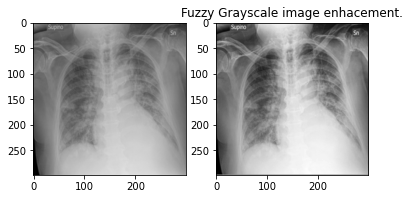

In [77]:
plt.subplot(1, 2, 1)
plt.imshow(img, cmap = 'gray')
plt.subplot(1, 2, 2)
plt.imshow(res_img, cmap = 'gray')
plt.title('Fuzzy Grayscale image enhacement.')
plt.show()

These loops are adapted from the code above

In [81]:
covid_path = "M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID"
for filename in os.listdir(covid_path):
    img_name = "M:\\Honours\\dataset\\COVID-19_Radiography_Dataset\\COVID\\" + filename
    print(img_name)
    img = cv.imread(img_name)
    #img = cv.resize(img, (200, 200))
    print(img.shape)
    layer = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    WIDTH = layer.shape[1]
    HEIGHT = layer.shape[0]
    x0, x1, y0, y1 = 0, WIDTH - 1, 0, HEIGHT - 1
    e_layer_gray = mapping(layer, (0, 255), (-1, 1))
    print('Ps and Ws calculation is in progress...')
    start = time.time()
    ps, ws = cal_ps_ws(m, n, WIDTH, HEIGHT, GAMMA)
    end = time.time()
    print('Ps and Ws calculation has completed successfully in '+str(end-start)+' s')
    print('means, variances, lamdas and taos calculation is in progress...')
    start = time.time()
    means, variances, lamdas, taos = cal_means_variances_lamdas(ws, e_layer_gray)
    end = time.time()
    print('means, variances, lamdas and taos calculation is finished in ' + str(end-start) + ' s')
    res_img = one_layer_enhacement(e_layer_gray)
    cv.imwrite("M:\\Honours\\fuzzy_dataset\\COVID\\" + filename, res_img)

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.022643566131592 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9883618354797363 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-10.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.987323522567749 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.270510673522949 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-100.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.2640221118927 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.44609

Ps and Ws calculation has completed successfully in 8.21770715713501 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9568655490875244 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1020.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.934889554977417 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8514506816864014 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1021.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.086092710494995 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6698131561279297 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1022.png
(299, 299, 3)
Ps and Ws calculat

means, variances, lamdas and taos calculation is finished in 4.067065000534058 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1042.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.269577741622925 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.382054805755615 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1043.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.970858097076416 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.185589551925659 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1044.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.838332414627075 s
means, variances, lamdas and taos calculatio

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1064.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.912228345870972 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.050358295440674 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1065.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.008162260055542 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8165438175201416 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1066.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.861091613769531 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in

Ps and Ws calculation has completed successfully in 9.0459463596344 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.17603874206543 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1087.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.505570888519287 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.869527816772461 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1088.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.096108198165894 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.356329917907715 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1089.png
(299, 299, 3)
Ps and Ws calculation 

means, variances, lamdas and taos calculation is finished in 4.1246864795684814 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1108.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.71585750579834 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.258790493011475 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1109.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.766515970230103 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.279429197311401 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-111.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.580672025680542 s
means, variances, lamdas and taos calculation

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-113.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.770029783248901 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.308832883834839 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1130.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.041653633117676 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.355360507965088 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1131.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.84896993637085 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4

Ps and Ws calculation has completed successfully in 10.760822534561157 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.449368000030518 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1152.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.314768314361572 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.520853281021118 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1153.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.229124784469604 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.657273530960083 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1154.png
(299, 299, 3)
Ps and Ws calcula

means, variances, lamdas and taos calculation is finished in 3.899639368057251 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1174.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.474256753921509 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.792449712753296 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1175.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.040065288543701 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.2203614711761475 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1176.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.711436033248901 s
means, variances, lamdas and taos calculati

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1196.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.233191967010498 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.813977003097534 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1197.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.43610954284668 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7713730335235596 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1198.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.165369987487793 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 

Ps and Ws calculation has completed successfully in 8.912214756011963 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.14960789680481 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1218.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.409492492675781 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.304114103317261 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1219.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.024718284606934 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9150261878967285 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-122.png
(299, 299, 3)
Ps and Ws calculation

means, variances, lamdas and taos calculation is finished in 4.0620644092559814 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-124.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.278047561645508 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.0086445808410645 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1240.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.397959470748901 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.1017906665802 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1241.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.587406635284424 s
means, variances, lamdas and taos calculation

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1261.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.166392803192139 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.963538646697998 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1262.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.40589690208435 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.061225891113281 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1263.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.373800277709961 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4

Ps and Ws calculation has completed successfully in 9.311473846435547 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.047271966934204 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1284.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.222694396972656 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.101885080337524 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1285.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.448445558547974 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.0646138191223145 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1286.png
(299, 299, 3)
Ps and Ws calculati

means, variances, lamdas and taos calculation is finished in 4.032322645187378 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1305.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.145312547683716 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.0293591022491455 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1306.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.084272384643555 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.047370910644531 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1307.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.47223949432373 s
means, variances, lamdas and taos calculatio

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1327.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.015086889266968 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7679598331451416 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1328.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.308086395263672 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8248233795166016 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1329.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.677821159362793 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished i

Ps and Ws calculation has completed successfully in 9.420984268188477 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.106067657470703 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-135.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.385480880737305 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.296773672103882 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1350.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.497831583023071 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.196410179138184 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1351.png
(299, 299, 3)
Ps and Ws calculation

means, variances, lamdas and taos calculation is finished in 3.9736509323120117 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1371.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.308663845062256 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.049010992050171 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1372.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.247367858886719 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9496943950653076 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1373.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.452383518218994 s
means, variances, lamdas and taos calculat

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1393.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.987454652786255 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.941908359527588 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1394.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.104562520980835 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.938342571258545 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1395.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.100160837173462 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 

Ps and Ws calculation has completed successfully in 8.919678449630737 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8884499073028564 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1415.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.02951455116272 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.017521142959595 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1416.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.094766855239868 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9332876205444336 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1417.png
(299, 299, 3)
Ps and Ws calculati

means, variances, lamdas and taos calculation is finished in 3.9105913639068604 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1437.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.013463258743286 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8416783809661865 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1438.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.96032428741455 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9597105979919434 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1439.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.004687309265137 s
means, variances, lamdas and taos calculat

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1459.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.090943336486816 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.886998176574707 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-146.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.00904631614685 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9780375957489014 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1460.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.986340522766113 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3

Ps and Ws calculation has completed successfully in 9.089801788330078 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.883019208908081 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1481.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.036417722702026 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9264423847198486 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1482.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.15821886062622 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8980331420898438 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1483.png
(299, 299, 3)
Ps and Ws calculati

means, variances, lamdas and taos calculation is finished in 3.90952467918396 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1502.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.013808012008667 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8524327278137207 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1503.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.141611099243164 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.964263677597046 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1504.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.084825277328491 s
means, variances, lamdas and taos calculatio

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1524.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.01684284210205 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9469239711761475 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1525.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.019219160079956 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.928208112716675 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1526.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.070463418960571 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 

Ps and Ws calculation has completed successfully in 9.004963397979736 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.983649253845215 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1547.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.040373086929321 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9269466400146484 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1548.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.999960899353027 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9568111896514893 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1549.png
(299, 299, 3)
Ps and Ws calculat

means, variances, lamdas and taos calculation is finished in 3.9737489223480225 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1569.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.060845375061035 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.940002918243408 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-157.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.001987218856812 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.882695436477661 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1570.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.127897262573242 s
means, variances, lamdas and taos calculatio

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1590.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.998517990112305 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8711936473846436 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1591.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.096357107162476 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9197187423706055 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1592.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.888869524002075 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished i

Ps and Ws calculation has completed successfully in 8.868708372116089 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7798080444335938 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1612.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.847263813018799 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.738443613052368 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1613.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.844353199005127 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7704007625579834 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1614.png
(299, 299, 3)
Ps and Ws calculat

means, variances, lamdas and taos calculation is finished in 3.785334348678589 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1634.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.726961135864258 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7480146884918213 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1635.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.665675163269043 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.88022780418396 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1636.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.842108964920044 s
means, variances, lamdas and taos calculatio

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1656.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.72828221321106 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7681829929351807 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1657.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.720568895339966 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7775039672851562 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1658.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.689464330673218 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in

Ps and Ws calculation has completed successfully in 8.769210815429688 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7886595726013184 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1679.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.6960289478302 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8327720165252686 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-168.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.720690727233887 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.804866075515747 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1680.png
(299, 299, 3)
Ps and Ws calculation

means, variances, lamdas and taos calculation is finished in 3.794396162033081 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-170.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.777521848678589 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.74263858795166 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1700.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.713155269622803 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7718372344970703 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1701.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.695064544677734 s
means, variances, lamdas and taos calculation

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1721.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.673133134841919 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7183477878570557 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1722.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.695231676101685 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7626309394836426 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1723.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.750850677490234 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished i

Ps and Ws calculation has completed successfully in 8.646952390670776 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8004696369171143 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1744.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.858596086502075 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6653857231140137 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1745.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.589776754379272 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.808533191680908 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1746.png
(299, 299, 3)
Ps and Ws calculat

means, variances, lamdas and taos calculation is finished in 3.7390661239624023 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1766.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.658100128173828 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6716725826263428 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1767.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.586276769638062 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.726391553878784 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1768.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.679049015045166 s
means, variances, lamdas and taos calculat

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1788.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.812877178192139 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7656595706939697 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1789.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.702057600021362 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.714919090270996 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-179.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.617750644683838 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 

Ps and Ws calculation has completed successfully in 9.01696491241455 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.874708652496338 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-181.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.790814876556396 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.924435615539551 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1810.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.929819345474243 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.77629017829895 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1811.png
(299, 299, 3)
Ps and Ws calculation i

means, variances, lamdas and taos calculation is finished in 3.846409320831299 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1831.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.824358701705933 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.1534857749938965 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1832.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.059831380844116 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8409571647644043 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1833.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.516165494918823 s
means, variances, lamdas and taos calculat

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1853.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.20020842552185 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.038917779922485 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1854.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.107258558273315 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.904707431793213 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1855.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.940484762191772 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3

Ps and Ws calculation has completed successfully in 8.83557677268982 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8496475219726562 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1876.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.875757217407227 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9137258529663086 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1877.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.829396486282349 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.839238166809082 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1878.png
(299, 299, 3)
Ps and Ws calculati

means, variances, lamdas and taos calculation is finished in 3.791595697402954 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1898.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.881563901901245 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.943030595779419 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1899.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.020174264907837 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9029061794281006 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-19.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.859766483306885 s
means, variances, lamdas and taos calculation

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1919.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.501112222671509 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.646292209625244 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-192.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.470266580581665 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.678882122039795 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1920.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.469307899475098 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3

Ps and Ws calculation has completed successfully in 8.490515947341919 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.658740282058716 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1941.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.415152072906494 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6147961616516113 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1942.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.388463258743286 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5668280124664307 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1943.png
(299, 299, 3)
Ps and Ws calculat

means, variances, lamdas and taos calculation is finished in 3.630566358566284 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1963.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.423306941986084 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.645876884460449 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1964.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.398440599441528 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.594191551208496 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1965.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.440479755401611 s
means, variances, lamdas and taos calculatio

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1985.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.437220096588135 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.625410795211792 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1986.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.408749103546143 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6490490436553955 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1987.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.480152130126953 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in

Ps and Ws calculation has completed successfully in 8.528293132781982 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6379952430725098 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2006.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.421639442443848 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7018303871154785 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2007.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.484832525253296 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.616920232772827 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2008.png
(299, 299, 3)
Ps and Ws calculat

means, variances, lamdas and taos calculation is finished in 3.6876108646392822 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2028.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.303664445877075 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.662904977798462 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2029.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.466042280197144 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.701434373855591 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-203.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.387794733047485 s
means, variances, lamdas and taos calculatio

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-205.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.378821849822998 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.633146286010742 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2050.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.347389698028564 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.709779977798462 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2051.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.362516164779663 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3

Ps and Ws calculation has completed successfully in 8.411098003387451 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6781728267669678 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2072.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.412717580795288 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6533043384552 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2073.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.439036846160889 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6046245098114014 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2074.png
(299, 299, 3)
Ps and Ws calculatio

means, variances, lamdas and taos calculation is finished in 3.6957383155822754 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2094.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.362085342407227 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6587443351745605 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2095.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.51304817199707 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6135432720184326 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2096.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.335510015487671 s
means, variances, lamdas and taos calculat

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2115.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.430860757827759 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.726351737976074 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2116.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.483347177505493 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.637782335281372 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2117.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.630723476409912 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 

Ps and Ws calculation has completed successfully in 8.134241104125977 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.47084903717041 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2138.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.231173515319824 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5262749195098877 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2139.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.172231674194336 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4912827014923096 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-214.png
(299, 299, 3)
Ps and Ws calculatio

means, variances, lamdas and taos calculation is finished in 3.55680513381958 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-216.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.101031064987183 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.547095537185669 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2160.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.010005950927734 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4830708503723145 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2161.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.296055555343628 s
means, variances, lamdas and taos calculation

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2181.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.243424892425537 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5959081649780273 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2182.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.219083070755005 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.441004753112793 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2183.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.137250661849976 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in

Ps and Ws calculation has completed successfully in 9.985535860061646 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.092873573303223 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2203.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.486434936523438 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.855231761932373 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2204.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.798492670059204 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.910135269165039 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2205.png
(299, 299, 3)
Ps and Ws calculatio

means, variances, lamdas and taos calculation is finished in 4.1271679401397705 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2225.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.709182739257812 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.96254301071167 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2226.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.159291744232178 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9227840900421143 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2227.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.118224859237671 s
means, variances, lamdas and taos calculati

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2247.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.137720346450806 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9910449981689453 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2248.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.14535117149353 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.184448480606079 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2249.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.337375164031982 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 

Ps and Ws calculation has completed successfully in 9.532950401306152 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.223718166351318 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-227.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.063924074172974 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.331938743591309 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2270.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.05905032157898 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.587948799133301 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2271.png
(299, 299, 3)
Ps and Ws calculatio

means, variances, lamdas and taos calculation is finished in 4.22492527961731 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2291.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.962601900100708 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.345294237136841 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2292.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.048982620239258 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9292821884155273 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2293.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.703116178512573 s
means, variances, lamdas and taos calculati

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2312.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.532625198364258 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.429710626602173 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2313.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.03655481338501 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 5.0063557624816895 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2314.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.355186939239502 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished 

Ps and Ws calculation has completed successfully in 9.941324472427368 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.575619459152222 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2335.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.789328336715698 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.634587526321411 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2336.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.719279050827026 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.45993185043335 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2337.png
(299, 299, 3)
Ps and Ws calculatio

means, variances, lamdas and taos calculation is finished in 4.625569105148315 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2357.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.667169332504272 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.344982385635376 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2358.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.437450885772705 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.407083988189697 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2359.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.199419498443604 s
means, variances, lamdas and taos calculati

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2379.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.027846574783325 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.828603267669678 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-238.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.429385423660278 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.5327308177948 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2380.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.270462036132812 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 

Ps and Ws calculation has completed successfully in 10.773415565490723 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.616131782531738 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2400.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.60900592803955 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.531668663024902 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2401.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.098740577697754 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9356675148010254 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2402.png
(299, 299, 3)
Ps and Ws calculat

means, variances, lamdas and taos calculation is finished in 4.112086296081543 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2422.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.183544397354126 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.022557735443115 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2423.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.026560306549072 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9468345642089844 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2424.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.080820322036743 s
means, variances, lamdas and taos calculati

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2444.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.974589586257935 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.01705527305603 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2445.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.003762483596802 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.942770481109619 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2446.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.996963739395142 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3

Ps and Ws calculation has completed successfully in 9.023049592971802 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.0403077602386475 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2467.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.051893472671509 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.00684118270874 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2468.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.067036628723145 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.032948017120361 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2469.png
(299, 299, 3)
Ps and Ws calculatio

means, variances, lamdas and taos calculation is finished in 3.9949424266815186 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2489.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.060758829116821 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.999490737915039 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-249.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.079548597335815 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9557888507843018 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2490.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.039114475250244 s
means, variances, lamdas and taos calculati

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-251.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.061811923980713 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.046611547470093 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2510.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.070366382598877 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.073351621627808 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2511.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.058254718780518 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4

Ps and Ws calculation has completed successfully in 9.243233919143677 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.056955814361572 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2532.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.02724575996399 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.102762460708618 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2533.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.144268035888672 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.0114662647247314 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2534.png
(299, 299, 3)
Ps and Ws calculatio

means, variances, lamdas and taos calculation is finished in 3.981290578842163 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2554.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.180005311965942 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.01936936378479 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2555.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.074480772018433 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.993884801864624 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2556.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.156232357025146 s
means, variances, lamdas and taos calculation

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2576.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.213706970214844 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.042497634887695 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2577.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.049142837524414 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.037782907485962 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2578.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.062552690505981 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 

Ps and Ws calculation has completed successfully in 8.672738313674927 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.782731294631958 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2599.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.913250923156738 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.020802736282349 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-26.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.10169529914856 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.970956563949585 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-260.png
(299, 299, 3)
Ps and Ws calculation is

means, variances, lamdas and taos calculation is finished in 3.80754017829895 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-262.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.640912055969238 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.0317511558532715 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2620.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.899291038513184 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8941757678985596 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2621.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.814178466796875 s
means, variances, lamdas and taos calculatio

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2641.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.360562324523926 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.668051242828369 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2642.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.443127870559692 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.635040760040283 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2643.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.437705039978027 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 

Ps and Ws calculation has completed successfully in 8.478060007095337 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.715740442276001 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2664.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.539276838302612 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.623893976211548 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2665.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.294207572937012 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.625622272491455 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2666.png
(299, 299, 3)
Ps and Ws calculatio

means, variances, lamdas and taos calculation is finished in 3.5753026008605957 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2686.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.414729356765747 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5661542415618896 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2687.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.417037725448608 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.554025173187256 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2688.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.365932703018188 s
means, variances, lamdas and taos calculat

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2707.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.418410062789917 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.744844913482666 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2708.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.396189451217651 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6187007427215576 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2709.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.407862901687622 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in

Ps and Ws calculation has completed successfully in 8.476990699768066 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.586172103881836 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-273.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.396547794342041 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.646641731262207 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2730.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.42257571220398 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6049435138702393 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2731.png
(299, 299, 3)
Ps and Ws calculation

means, variances, lamdas and taos calculation is finished in 3.5889205932617188 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2751.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.502244234085083 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.643007755279541 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2752.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.34520411491394 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6726632118225098 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2753.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.471920251846313 s
means, variances, lamdas and taos calculati

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2773.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.320991277694702 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6968467235565186 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2774.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.406514167785645 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.659057378768921 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2775.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.342967987060547 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in

Ps and Ws calculation has completed successfully in 8.415897607803345 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5889229774475098 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2796.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.328702688217163 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.597429037094116 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2797.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.395008563995361 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6358439922332764 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2798.png
(299, 299, 3)
Ps and Ws calculat

means, variances, lamdas and taos calculation is finished in 3.6019697189331055 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2817.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.407085418701172 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.558519124984741 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2818.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.299288272857666 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6829240322113037 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2819.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.42964482307434 s
means, variances, lamdas and taos calculati

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2839.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.793196678161621 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2790896892547607 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-284.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.452566862106323 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.044090986251831 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2840.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.196124076843262 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 

Ps and Ws calculation has completed successfully in 8.043760061264038 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.510840654373169 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2861.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.06161618232727 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.449282169342041 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2862.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.006949663162231 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4555470943450928 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2863.png
(299, 299, 3)
Ps and Ws calculatio

means, variances, lamdas and taos calculation is finished in 3.7943005561828613 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2883.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.828314065933228 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.796679973602295 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2884.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.536933422088623 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5732340812683105 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2885.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.064034700393677 s
means, variances, lamdas and taos calculat

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2904.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.68325924873352 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8708484172821045 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2905.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.889209508895874 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.917710542678833 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2906.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.634799480438232 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 

Ps and Ws calculation has completed successfully in 8.791561365127563 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8296403884887695 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2927.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.835306644439697 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8371970653533936 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2928.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.910468101501465 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.910494089126587 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2929.png
(299, 299, 3)
Ps and Ws calculat

means, variances, lamdas and taos calculation is finished in 3.686750650405884 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2949.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.43940782546997 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.578221559524536 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-295.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.450387477874756 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.652780771255493 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2950.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.28964877128601 s
means, variances, lamdas and taos calculation i

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2970.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.259665727615356 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6002063751220703 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2971.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.406553983688354 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.632232666015625 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2972.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.363133907318115 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in

Ps and Ws calculation has completed successfully in 8.159940719604492 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5054373741149902 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2993.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.058012962341309 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6814162731170654 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2994.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.469533443450928 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.569347620010376 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2995.png
(299, 299, 3)
Ps and Ws calculat

means, variances, lamdas and taos calculation is finished in 3.5684244632720947 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3013.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.463067531585693 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.674440383911133 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3014.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.26379656791687 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.531735897064209 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3015.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.440988779067993 s
means, variances, lamdas and taos calculatio

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3035.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.46103048324585 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.762787342071533 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3036.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.56306266784668 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.873748540878296 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3037.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.497014045715332 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.

Ps and Ws calculation has completed successfully in 8.568078994750977 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5119147300720215 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3058.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.417548656463623 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7085278034210205 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3059.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.537680625915527 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6035826206207275 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-306.png
(299, 299, 3)
Ps and Ws calculat

means, variances, lamdas and taos calculation is finished in 3.6744608879089355 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-308.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.596555709838867 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.732377052307129 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3080.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.694323778152466 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7743327617645264 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3081.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.57115364074707 s
means, variances, lamdas and taos calculatio

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3100.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.687236070632935 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8552093505859375 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3101.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.430875539779663 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.906824827194214 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3102.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.724285125732422 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in

Ps and Ws calculation has completed successfully in 8.058976411819458 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.544199228286743 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3123.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.221740961074829 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4234888553619385 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3124.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.978090286254883 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.43876051902771 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3125.png
(299, 299, 3)
Ps and Ws calculatio

means, variances, lamdas and taos calculation is finished in 3.4333302974700928 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3145.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.973326206207275 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.460451602935791 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3146.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.201764106750488 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.403886556625366 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3147.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.077900648117065 s
means, variances, lamdas and taos calculati

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3167.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.960296630859375 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4364101886749268 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3168.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.023092269897461 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4023702144622803 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3169.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.896289825439453 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished i

Ps and Ws calculation has completed successfully in 8.000701665878296 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4109504222869873 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-319.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.95621395111084 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.425642967224121 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3190.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.944634199142456 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.365525960922241 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3191.png
(299, 299, 3)
Ps and Ws calculation

means, variances, lamdas and taos calculation is finished in 3.4439258575439453 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3210.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.940463542938232 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4295945167541504 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3211.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.903138160705566 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4886045455932617 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3212.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.096298694610596 s
means, variances, lamdas and taos calcula

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3232.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.343429803848267 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5633060932159424 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3233.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.331377506256104 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6241230964660645 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3234.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.347912073135376 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished i

Ps and Ws calculation has completed successfully in 7.901463031768799 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4263885021209717 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3255.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9444780349731445 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.481851100921631 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3256.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.954768657684326 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4303383827209473 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3257.png
(299, 299, 3)
Ps and Ws calcula

means, variances, lamdas and taos calculation is finished in 3.4555909633636475 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3277.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.015755414962769 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4637627601623535 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3278.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.952939987182617 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4984853267669678 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3279.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9881041049957275 s
means, variances, lamdas and taos calcul

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3299.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.245193243026733 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.53596568107605 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-33.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.264769315719604 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6878981590270996 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-330.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.314692974090576 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6

Ps and Ws calculation has completed successfully in 8.302839994430542 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6264963150024414 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3320.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.478536367416382 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5774130821228027 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3321.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.294532060623169 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.584810972213745 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3322.png
(299, 299, 3)
Ps and Ws calculat

means, variances, lamdas and taos calculation is finished in 3.412614345550537 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3342.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.903894424438477 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.417588233947754 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3343.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.924374103546143 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.404944896697998 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3344.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.07220983505249 s
means, variances, lamdas and taos calculation

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3364.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.943881988525391 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4198367595672607 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3365.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.082956790924072 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.398839235305786 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3366.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.966837167739868 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in

Ps and Ws calculation has completed successfully in 7.978042125701904 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5464181900024414 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3387.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8993706703186035 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.491035223007202 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3388.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.986734867095947 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4702646732330322 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3389.png
(299, 299, 3)
Ps and Ws calcula

means, variances, lamdas and taos calculation is finished in 3.4704535007476807 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3408.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.093759536743164 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3996613025665283 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3409.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.894099712371826 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.45719313621521 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-341.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.887924671173096 s
means, variances, lamdas and taos calculatio

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-343.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.91083550453186 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.446720600128174 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3430.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.976070165634155 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4309096336364746 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3431.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.031471014022827 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3

Ps and Ws calculation has completed successfully in 8.042065143585205 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.437309741973877 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3452.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.955934286117554 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.46134352684021 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3453.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.857552766799927 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3793249130249023 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3454.png
(299, 299, 3)
Ps and Ws calculatio

means, variances, lamdas and taos calculation is finished in 3.502584934234619 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3474.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.049479246139526 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.489710807800293 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3475.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.89438796043396 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.434018850326538 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3476.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.005937576293945 s
means, variances, lamdas and taos calculation

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3496.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.959073781967163 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.40057635307312 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3497.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.939859867095947 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5107932090759277 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3498.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.977310657501221 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 

Ps and Ws calculation has completed successfully in 7.879922151565552 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.501178741455078 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3518.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8950889110565186 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.461530923843384 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3519.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.021960258483887 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.455678939819336 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-352.png
(299, 299, 3)
Ps and Ws calculatio

means, variances, lamdas and taos calculation is finished in 3.3896162509918213 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-354.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.003010749816895 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4667861461639404 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3540.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.964641571044922 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.429924249649048 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3541.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.968445062637329 s
means, variances, lamdas and taos calculati

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3561.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.874407052993774 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3962764739990234 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3562.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.996675252914429 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4347567558288574 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3563.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.097118854522705 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished i

Ps and Ws calculation has completed successfully in 7.931962966918945 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4193687438964844 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3584.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.87994647026062 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.435669422149658 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3585.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.986818313598633 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3752405643463135 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3586.png
(299, 299, 3)
Ps and Ws calculati

means, variances, lamdas and taos calculation is finished in 3.447927951812744 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3605.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9579081535339355 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3666093349456787 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3606.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.162824153900146 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4788339138031006 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3607.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.918395519256592 s
means, variances, lamdas and taos calcula

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-372.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.998945236206055 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.436577796936035 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-373.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.028824090957642 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4324254989624023 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-374.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9615583419799805 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3

Ps and Ws calculation has completed successfully in 8.022895097732544 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4241387844085693 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-395.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.120970249176025 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4232239723205566 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-396.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.016186475753784 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.436284303665161 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-397.png
(299, 299, 3)
Ps and Ws calculation

means, variances, lamdas and taos calculation is finished in 3.481409788131714 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-416.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.001008033752441 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4335951805114746 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-417.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.960444450378418 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4865942001342773 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-418.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.979848623275757 s
means, variances, lamdas and taos calculation

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-438.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.966395139694214 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5089120864868164 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-439.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.03528356552124 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4910926818847656 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-44.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.009973764419556 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4

Ps and Ws calculation has completed successfully in 7.993973255157471 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.493381977081299 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-460.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.005251169204712 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.384427309036255 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-461.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.000153541564941 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4086387157440186 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-462.png
(299, 299, 3)
Ps and Ws calculation 

means, variances, lamdas and taos calculation is finished in 3.3841826915740967 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-482.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.921991348266602 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.413113594055176 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-483.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.946131944656372 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.493363618850708 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-484.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.955565452575684 s
means, variances, lamdas and taos calculation 

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-503.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0170745849609375 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0349087715148926 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-504.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.989301681518555 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.041637659072876 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-505.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.933357238769531 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3

Ps and Ws calculation has completed successfully in 6.908170938491821 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9666523933410645 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-526.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.924969434738159 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0635948181152344 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-527.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.588999509811401 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2106637954711914 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-528.png
(299, 299, 3)
Ps and Ws calculatio

means, variances, lamdas and taos calculation is finished in 3.138917922973633 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-548.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.9821388721466064 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9910762310028076 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-549.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.969761848449707 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0283870697021484 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-55.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.993433952331543 s
means, variances, lamdas and taos calculation

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-57.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.959684371948242 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.074948787689209 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-570.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.946347951889038 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0032989978790283 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-571.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.975550651550293 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0

Ps and Ws calculation has completed successfully in 6.989411115646362 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9724278450012207 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-592.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.988496541976929 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.036749839782715 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-593.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0245959758758545 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9977304935455322 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-594.png
(299, 299, 3)
Ps and Ws calculatio

means, variances, lamdas and taos calculation is finished in 2.9660136699676514 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-613.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.922421932220459 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0069708824157715 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-614.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.9674766063690186 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9800026416778564 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-615.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0098419189453125 s
means, variances, lamdas and taos calculat

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-635.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.334451675415039 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5979268550872803 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-636.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.178455352783203 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5970656871795654 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-637.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.196906805038452 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3

Ps and Ws calculation has completed successfully in 8.137623310089111 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6712751388549805 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-658.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.320106029510498 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6338694095611572 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-659.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.17294716835022 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.583120584487915 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-66.png
(299, 299, 3)
Ps and Ws calculation i

means, variances, lamdas and taos calculation is finished in 3.6147267818450928 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-68.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.170702457427979 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.616992235183716 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-680.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.279077529907227 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5555500984191895 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-681.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.387061834335327 s
means, variances, lamdas and taos calculation 

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-700.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.137943983078003 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6531972885131836 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-701.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.179559230804443 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6518919467926025 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-702.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.260167598724365 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3

Ps and Ws calculation has completed successfully in 6.94410514831543 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9646878242492676 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-723.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.914799928665161 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9767489433288574 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-724.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.896501541137695 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.022897720336914 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-725.png
(299, 299, 3)
Ps and Ws calculation 

means, variances, lamdas and taos calculation is finished in 3.0122203826904297 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-745.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.937813758850098 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9957268238067627 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-746.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.944786310195923 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0194413661956787 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-747.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.002387285232544 s
means, variances, lamdas and taos calculatio

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-767.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.987118244171143 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9813666343688965 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-768.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.9395670890808105 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.994265556335449 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-769.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.952486753463745 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2

Ps and Ws calculation has completed successfully in 6.931469440460205 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.048997402191162 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-79.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.021388530731201 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9718902111053467 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-790.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.948238134384155 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.016629695892334 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-791.png
(299, 299, 3)
Ps and Ws calculation i

means, variances, lamdas and taos calculation is finished in 3.029855251312256 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-810.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.949075222015381 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0418450832366943 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-811.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.024781227111816 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0007436275482178 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-812.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.9843080043792725 s
means, variances, lamdas and taos calculatio

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-832.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.018176317214966 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0384645462036133 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-833.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.9588234424591064 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.971745729446411 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-834.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.979040145874023 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3

Ps and Ws calculation has completed successfully in 7.05385947227478 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0297505855560303 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-855.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.947429418563843 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0107719898223877 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-856.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.901325941085815 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0275163650512695 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-857.png
(299, 299, 3)
Ps and Ws calculation

means, variances, lamdas and taos calculation is finished in 3.0178003311157227 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-877.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.074920654296875 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.005246877670288 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-878.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.911581754684448 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.977094888687134 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-879.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.947705030441284 s
means, variances, lamdas and taos calculation 

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-899.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.936642408370972 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.992330551147461 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-9.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.9516541957855225 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0378143787384033 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-90.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.869009256362915 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.01

Ps and Ws calculation has completed successfully in 6.968865633010864 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0633463859558105 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-920.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.990204572677612 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1179215908050537 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-921.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.932250499725342 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.009753704071045 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-922.png
(299, 299, 3)
Ps and Ws calculation

means, variances, lamdas and taos calculation is finished in 2.98742938041687 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-942.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.8810670375823975 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.007598638534546 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-943.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.011316299438477 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.963902235031128 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-944.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.931036949157715 s
means, variances, lamdas and taos calculation i

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-964.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.928698301315308 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0109612941741943 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-965.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.017665863037109 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.036172389984131 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-966.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.951221704483032 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.

Ps and Ws calculation has completed successfully in 6.93067193031311 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.028477191925049 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-987.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.942175388336182 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0337650775909424 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-988.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0142223834991455 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.963520050048828 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-989.png
(299, 299, 3)
Ps and Ws calculation 

In [83]:
viral_pneumonia_path = "M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia"
for filename in os.listdir(viral_pneumonia_path):
    img_name = "M:\\Honours\\dataset\\COVID-19_Radiography_Dataset\\Viral Pneumonia\\" + filename
    print(img_name)
    img = cv.imread(img_name)
    #img = cv.resize(img, (200, 200))
    print(img.shape)
    layer = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    WIDTH = layer.shape[1]
    HEIGHT = layer.shape[0]
    x0, x1, y0, y1 = 0, WIDTH - 1, 0, HEIGHT - 1
    e_layer_gray = mapping(layer, (0, 255), (-1, 1))
    print('Ps and Ws calculation is in progress...')
    start = time.time()
    ps, ws = cal_ps_ws(m, n, WIDTH, HEIGHT, GAMMA)
    end = time.time()
    print('Ps and Ws calculation has completed successfully in '+str(end-start)+' s')
    print('means, variances, lamdas and taos calculation is in progress...')
    start = time.time()
    means, variances, lamdas, taos = cal_means_variances_lamdas(ws, e_layer_gray)
    end = time.time()
    print('means, variances, lamdas and taos calculation is finished in ' + str(end-start) + ' s')
    res_img = one_layer_enhacement(e_layer_gray)
    cv.imwrite("M:\\Honours\\fuzzy_dataset\\Viral Pneumonia\\" + filename, res_img)

M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.122351169586182 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.457183599472046 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-10.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.032318830490112 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.638157367706299 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-100.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.188903331756592 s
means, variances, lamdas and taos calculation is in progress...
means, 

means, variances, lamdas and taos calculation is finished in 3.467959403991699 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1019.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.86458683013916 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4548072814941406 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-102.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.926314353942871 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4157207012176514 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1020.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.89

means, variances, lamdas and taos calculation is finished in 3.4908528327941895 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-104.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.997101068496704 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.423927068710327 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1040.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.94711971282959 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.448657274246216 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1041.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.049

means, variances, lamdas and taos calculation is finished in 3.4709420204162598 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1060.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.024944543838501 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4922430515289307 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1061.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.972666263580322 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5032687187194824 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1062.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8

means, variances, lamdas and taos calculation is finished in 3.435537099838257 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1081.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.06118106842041 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4393599033355713 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1082.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.884947776794434 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4450137615203857 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1083.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.0

means, variances, lamdas and taos calculation is finished in 3.552324056625366 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1101.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.044225931167603 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.502359390258789 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1102.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.196894645690918 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4929349422454834 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1103.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9

means, variances, lamdas and taos calculation is finished in 3.4236066341400146 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1122.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.002251625061035 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.495398998260498 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1123.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.915014028549194 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4243991374969482 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1124.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.

means, variances, lamdas and taos calculation is finished in 3.496396780014038 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1143.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9222166538238525 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.375542402267456 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1144.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.010490894317627 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.409777879714966 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1145.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9

means, variances, lamdas and taos calculation is finished in 3.5275750160217285 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1164.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.013434171676636 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.482325553894043 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1165.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.105408906936646 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5130200386047363 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1166.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.

means, variances, lamdas and taos calculation is finished in 3.4218010902404785 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1185.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.959423780441284 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4380385875701904 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1186.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.851001501083374 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4563941955566406 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1187.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7

means, variances, lamdas and taos calculation is finished in 3.54097843170166 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1205.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.01834487915039 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4629271030426025 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1206.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.944591999053955 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4463436603546143 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1207.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.07

means, variances, lamdas and taos calculation is finished in 3.5684633255004883 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1226.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.520932674407959 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.654048204421997 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1227.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.284611701965332 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5263075828552246 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1228.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.

means, variances, lamdas and taos calculation is finished in 3.499199390411377 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1247.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.052244186401367 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.530618190765381 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1248.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.880038738250732 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5295169353485107 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1249.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9

means, variances, lamdas and taos calculation is finished in 3.5030319690704346 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1268.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.938781261444092 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.395081043243408 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1269.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.107751846313477 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.583620548248291 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-127.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.96

means, variances, lamdas and taos calculation is finished in 3.5383822917938232 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1289.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.149625062942505 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5672242641448975 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-129.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.198171854019165 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6270129680633545 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1290.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.

means, variances, lamdas and taos calculation is finished in 3.6468312740325928 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1309.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.248131275177002 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.662853240966797 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-131.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.326225757598877 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6268768310546875 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1310.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.1

means, variances, lamdas and taos calculation is finished in 3.4809677600860596 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-133.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.885875701904297 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4251339435577393 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1330.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.046046018600464 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5190012454986572 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1331.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.

means, variances, lamdas and taos calculation is finished in 3.566551685333252 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-14.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9227025508880615 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4138991832733154 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-140.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.963664531707764 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4365508556365967 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-141.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.038

means, variances, lamdas and taos calculation is finished in 3.482316255569458 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-160.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.831616401672363 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3507089614868164 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-161.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.002022504806519 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.418527603149414 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-162.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9807

means, variances, lamdas and taos calculation is finished in 3.516160488128662 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-181.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.004937410354614 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.495959758758545 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-182.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.97211766242981 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4961612224578857 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-183.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.01062

means, variances, lamdas and taos calculation is finished in 3.687713623046875 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-201.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.314403057098389 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.639407157897949 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-202.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.29296326637268 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6036641597747803 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-203.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.06527

means, variances, lamdas and taos calculation is finished in 3.469874858856201 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-222.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.949359178543091 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4982054233551025 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-223.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.019949197769165 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.502488136291504 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-224.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.0307

means, variances, lamdas and taos calculation is finished in 3.4995198249816895 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-243.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.948938369750977 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4970366954803467 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-244.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.041202306747437 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.418708324432373 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-245.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.045

means, variances, lamdas and taos calculation is finished in 3.405195713043213 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-264.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.917799711227417 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.465019702911377 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-265.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.885197162628174 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.397081136703491 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-266.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.06182

means, variances, lamdas and taos calculation is finished in 3.4365460872650146 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-285.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.911206007003784 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4455246925354004 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-286.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.06617259979248 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4398605823516846 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-287.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.844

means, variances, lamdas and taos calculation is finished in 3.3576624393463135 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-305.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.964123010635376 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4594695568084717 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-306.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.986489295959473 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4404165744781494 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-307.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.94

means, variances, lamdas and taos calculation is finished in 3.473357677459717 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-326.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.928790807723999 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4669787883758545 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-327.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.15066909790039 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0013985633850098 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-328.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.9878

means, variances, lamdas and taos calculation is finished in 2.9854798316955566 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-347.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.091771125793457 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.040494203567505 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-348.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.91414737701416 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.012939453125 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-349.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.12291836

means, variances, lamdas and taos calculation is finished in 2.978900909423828 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-368.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0079169273376465 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0447003841400146 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-369.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0497212409973145 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1487958431243896 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-37.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.94

means, variances, lamdas and taos calculation is finished in 3.060643196105957 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-389.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.040841817855835 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0693769454956055 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-39.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.171442747116089 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.018014669418335 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-390.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.91426

means, variances, lamdas and taos calculation is finished in 3.048271894454956 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-409.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.942071199417114 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.968691110610962 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-41.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.980314254760742 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.032137155532837 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-410.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.944727

means, variances, lamdas and taos calculation is finished in 3.0424964427948 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-43.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.017043828964233 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.032747507095337 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-430.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.9882824420928955 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0256853103637695 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-431.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.912041

means, variances, lamdas and taos calculation is finished in 3.0182628631591797 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-450.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.941709280014038 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.013690710067749 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-451.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.001659870147705 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.01177716255188 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-452.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.92465

means, variances, lamdas and taos calculation is finished in 3.024928569793701 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-471.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.021701097488403 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0013551712036133 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-472.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.045173168182373 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.971360206604004 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-473.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0040

means, variances, lamdas and taos calculation is finished in 3.024353265762329 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-492.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.9760472774505615 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.052154541015625 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-493.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0178961753845215 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.960723876953125 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-494.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.874

means, variances, lamdas and taos calculation is finished in 3.2930715084075928 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-512.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.025978326797485 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9496800899505615 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-513.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.952422380447388 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.999201536178589 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-514.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.380

means, variances, lamdas and taos calculation is finished in 3.025219202041626 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-533.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.110393762588501 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0037002563476562 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-534.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.019302606582642 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0780603885650635 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-535.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.940

means, variances, lamdas and taos calculation is finished in 3.516441583633423 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-554.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.46357250213623 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0886390209198 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-555.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.932655334472656 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.951798677444458 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-556.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.43411207

means, variances, lamdas and taos calculation is finished in 3.0116143226623535 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-575.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.055311679840088 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0198018550872803 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-576.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.941121816635132 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2961411476135254 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-577.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.02

means, variances, lamdas and taos calculation is finished in 3.031686782836914 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-596.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.011457681655884 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0833473205566406 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-597.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.962954521179199 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9646401405334473 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-598.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.003

means, variances, lamdas and taos calculation is finished in 3.0733635425567627 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-616.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.169034004211426 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1227774620056152 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-617.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.125828742980957 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0758955478668213 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-618.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.08

means, variances, lamdas and taos calculation is finished in 3.040692090988159 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-637.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5618321895599365 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1118552684783936 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-638.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.067739963531494 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0291764736175537 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-639.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.38

means, variances, lamdas and taos calculation is finished in 3.1497514247894287 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-658.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.242662668228149 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0143485069274902 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-659.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.224156379699707 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0975797176361084 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-66.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.275

means, variances, lamdas and taos calculation is finished in 3.042203187942505 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-679.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.2534401416778564 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.094858169555664 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-68.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.202618837356567 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0859835147857666 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-680.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1544

means, variances, lamdas and taos calculation is finished in 3.0547778606414795 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-7.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0180394649505615 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0213170051574707 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-70.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.024540662765503 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0500729084014893 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-700.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0284

means, variances, lamdas and taos calculation is finished in 3.041595458984375 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-72.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.089789867401123 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0091495513916016 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-720.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.97365927696228 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0372140407562256 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-721.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.13410

means, variances, lamdas and taos calculation is finished in 3.0606071949005127 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-740.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.066097021102905 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0196919441223145 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-741.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.976963043212891 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.097721815109253 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-742.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.971

means, variances, lamdas and taos calculation is finished in 3.085791826248169 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-761.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.033558130264282 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0741398334503174 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-762.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.132067680358887 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0276970863342285 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-763.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.025

means, variances, lamdas and taos calculation is finished in 3.026646614074707 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-782.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.095954656600952 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.044494390487671 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-783.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1170971393585205 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.05063533782959 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-784.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.14938

means, variances, lamdas and taos calculation is finished in 3.114853858947754 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-802.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.064369440078735 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0498664379119873 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-803.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.06765341758728 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0507030487060547 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-804.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.2049

means, variances, lamdas and taos calculation is finished in 3.0174665451049805 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-823.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.227261066436768 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.068662405014038 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-824.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.191917419433594 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0454084873199463 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-825.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.011

means, variances, lamdas and taos calculation is finished in 3.1036081314086914 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-844.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1016809940338135 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0625720024108887 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-845.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.066312074661255 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.995605707168579 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-846.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.11

means, variances, lamdas and taos calculation is finished in 3.2026243209838867 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-865.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.699442625045776 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.378171920776367 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-866.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6609766483306885 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4086287021636963 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-867.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.99

means, variances, lamdas and taos calculation is finished in 3.0455124378204346 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-886.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.015923500061035 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.036269187927246 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-887.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.110234975814819 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0511789321899414 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-888.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.056

means, variances, lamdas and taos calculation is finished in 3.0943374633789062 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-906.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.118855953216553 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0433833599090576 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-907.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.086923122406006 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0680947303771973 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-908.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.11

means, variances, lamdas and taos calculation is finished in 3.133873224258423 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-927.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0135276317596436 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0592098236083984 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-928.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.177738904953003 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1057498455047607 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-929.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.02

means, variances, lamdas and taos calculation is finished in 3.165024757385254 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-948.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.23759913444519 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.032362222671509 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-949.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.069630861282349 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0713894367218018 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-95.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.092251

means, variances, lamdas and taos calculation is finished in 3.065255641937256 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-969.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.037615537643433 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.045579433441162 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-97.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.017064332962036 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1576428413391113 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-970.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.07561

means, variances, lamdas and taos calculation is finished in 3.0493361949920654 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-99.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1214988231658936 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0373470783233643 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-990.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1585304737091064 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0165910720825195 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-991.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0

In [84]:
lung_opacity_path = "M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity"
for filename in os.listdir(lung_opacity_path):
    img_name = "M:\\Honours\\dataset\\COVID-19_Radiography_Dataset\\Lung_Opacity\\" + filename
    print(img_name)
    img = cv.imread(img_name)
    #img = cv.resize(img, (200, 200))
    print(img.shape)
    layer = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    WIDTH = layer.shape[1]
    HEIGHT = layer.shape[0]
    x0, x1, y0, y1 = 0, WIDTH - 1, 0, HEIGHT - 1
    e_layer_gray = mapping(layer, (0, 255), (-1, 1))
    print('Ps and Ws calculation is in progress...')
    start = time.time()
    ps, ws = cal_ps_ws(m, n, WIDTH, HEIGHT, GAMMA)
    end = time.time()
    print('Ps and Ws calculation has completed successfully in '+str(end-start)+' s')
    print('means, variances, lamdas and taos calculation is in progress...')
    start = time.time()
    means, variances, lamdas, taos = cal_means_variances_lamdas(ws, e_layer_gray)
    end = time.time()
    print('means, variances, lamdas and taos calculation is finished in ' + str(end-start) + ' s')
    res_img = one_layer_enhacement(e_layer_gray)
    cv.imwrite("M:\\Honours\\fuzzy_dataset\\Lung_Opacity\\" + filename, res_img)

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.13554310798645 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0493738651275635 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-10.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.983872890472412 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.079155206680298 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-100.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.05389142036438 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas a

Ps and Ws calculation has completed successfully in 7.016724109649658 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.038076400756836 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-102.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.058409929275513 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0356545448303223 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1020.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.999840974807739 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9946587085723877 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-

means, variances, lamdas and taos calculation is finished in 3.066119909286499 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1040.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.015015602111816 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0775513648986816 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1041.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.03204345703125 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.052539587020874 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1042.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.052631855010986 s
me

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1061.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.14124321937561 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9681835174560547 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1062.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.997433185577393 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.048158884048462 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1063.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.120196580886841 s
means, variances, lamdas and taos calculation is in progress...
means, variances, l

Ps and Ws calculation has completed successfully in 7.052408933639526 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.202122688293457 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1083.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.012411594390869 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0350301265716553 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1084.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.088767051696777 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0137581825256348 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity

means, variances, lamdas and taos calculation is finished in 3.026231050491333 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1103.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.043573617935181 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0742037296295166 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1104.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.033159017562866 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0092995166778564 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1105.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0420982837677 s
me

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1124.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.000759124755859 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0373501777648926 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1125.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.999316215515137 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9806337356567383 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1126.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.026143789291382 s
means, variances, lamdas and taos calculation is in progress...
means, variances,

Ps and Ws calculation has completed successfully in 6.987598180770874 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.985304355621338 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1146.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.032592535018921 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0553700923919678 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1147.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.989671468734741 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9964449405670166 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity

means, variances, lamdas and taos calculation is finished in 2.957606077194214 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1167.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.088822603225708 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.08374285697937 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1168.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.155728340148926 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0000452995300293 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1169.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.075627088546753 s
me

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1188.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1978919506073 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.342059373855591 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1189.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.806746244430542 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.39607572555542 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-119.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.87876033782959 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas

Ps and Ws calculation has completed successfully in 7.874688386917114 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.412473201751709 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1209.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9087443351745605 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.360158920288086 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-121.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9338319301605225 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.403348684310913 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-

means, variances, lamdas and taos calculation is finished in 3.3923449516296387 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-123.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.963643789291382 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.473100185394287 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1230.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.881110429763794 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.416010618209839 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1231.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.952970504760742 s
me

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1250.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.047230243682861 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0464928150177 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1251.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.044279336929321 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0538270473480225 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1252.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.094340801239014 s
means, variances, lamdas and taos calculation is in progress...
means, variances, la

Ps and Ws calculation has completed successfully in 7.037647008895874 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9798481464385986 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1272.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.097716331481934 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.023346424102783 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1273.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.059878826141357 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9810547828674316 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity

means, variances, lamdas and taos calculation is finished in 2.97782564163208 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1293.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.022657871246338 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.067359209060669 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1294.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.996251106262207 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.033845901489258 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1295.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0509033203125 s
means

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1313.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.983625888824463 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.024841785430908 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1314.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.999067306518555 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.009888172149658 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1315.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.95930814743042 s
means, variances, lamdas and taos calculation is in progress...
means, variances, la

Ps and Ws calculation has completed successfully in 7.018160820007324 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0547282695770264 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1335.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0425124168396 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0469253063201904 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1336.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.009680986404419 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.047522783279419 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1

means, variances, lamdas and taos calculation is finished in 3.0105998516082764 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1356.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.994285821914673 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0722568035125732 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1357.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.13284707069397 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.036219358444214 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1358.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.953196287155151 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1377.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.016211748123169 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9786360263824463 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1378.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.169046401977539 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.066072702407837 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1379.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.02910852432251 s
means, variances, lamdas and taos calculation is in progress...
means, variances, l

Ps and Ws calculation has completed successfully in 7.500615358352661 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0356125831604004 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1399.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.018409013748169 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.073120355606079 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-14.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.048359155654907 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0585098266601562 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1

means, variances, lamdas and taos calculation is finished in 3.078585386276245 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1419.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.072832107543945 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1139864921569824 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-142.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.136687278747559 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.028639078140259 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1420.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.023061990737915 s
me

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-144.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.025413513183594 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0462772846221924 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1440.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.019738674163818 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.02419376373291 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1441.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.920401573181152 s
means, variances, lamdas and taos calculation is in progress...
means, variances, la

Ps and Ws calculation has completed successfully in 7.241457939147949 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1165449619293213 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1461.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.996297836303711 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.049859046936035 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1462.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.067261457443237 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0139517784118652 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity

means, variances, lamdas and taos calculation is finished in 3.045883893966675 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1482.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.980602025985718 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.016719102859497 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1483.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.006083726882935 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0060555934906006 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1484.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.043930292129517 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1502.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0779032707214355 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.043919801712036 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1503.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.092342376708984 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1128807067871094 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1504.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.098823070526123 s
means, variances, lamdas and taos calculation is in progress...
means, variances,

Ps and Ws calculation has completed successfully in 7.116812229156494 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.02420973777771 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1524.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.091554403305054 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0407662391662598 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1525.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.069055080413818 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.026411533355713 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1

means, variances, lamdas and taos calculation is finished in 2.9763033390045166 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1545.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.211293935775757 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0400452613830566 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1546.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.302618741989136 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0353498458862305 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1547.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.06156849861145 s


M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1566.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.22200870513916 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0593700408935547 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1567.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.038398504257202 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0227935314178467 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1568.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.067298412322998 s
means, variances, lamdas and taos calculation is in progress...
means, variances, 

Ps and Ws calculation has completed successfully in 7.137687921524048 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.045830488204956 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1588.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.026327610015869 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0168399810791016 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1589.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.03657341003418 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.018921136856079 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1

means, variances, lamdas and taos calculation is finished in 3.0123744010925293 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1608.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.076486110687256 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1032357215881348 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1609.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.029853820800781 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.009384870529175 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-161.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.049755573272705 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1629.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.084380388259888 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.035351276397705 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-163.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.095938682556152 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0356781482696533 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1630.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.04573392868042 s
means, variances, lamdas and taos calculation is in progress...
means, variances, la

Ps and Ws calculation has completed successfully in 7.019046783447266 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0082409381866455 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1650.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.10719895362854 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.048779010772705 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1651.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.161731481552124 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9970366954803467 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-

means, variances, lamdas and taos calculation is finished in 3.0402424335479736 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1671.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.168950080871582 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0876214504241943 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1672.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.016174793243408 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.004390239715576 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1673.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.058531284332275 s


M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1692.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.9920854568481445 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2412898540496826 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1693.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.104226589202881 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0663645267486572 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1694.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0855488777160645 s
means, variances, lamdas and taos calculation is in progress...
means, variance

Ps and Ws calculation has completed successfully in 7.000558853149414 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0324668884277344 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1713.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.967269659042358 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0111467838287354 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1714.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.018882751464844 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1329636573791504 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacit

means, variances, lamdas and taos calculation is finished in 2.9902567863464355 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1734.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.000700235366821 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.044597864151001 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1735.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.068602800369263 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.046475648880005 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1736.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.033288955688477 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1755.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.988645553588867 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0334386825561523 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1756.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.987922191619873 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.955009937286377 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1757.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.182383298873901 s
means, variances, lamdas and taos calculation is in progress...
means, variances, 

Ps and Ws calculation has completed successfully in 7.104224920272827 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0997021198272705 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1777.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.025662422180176 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9440419673919678 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1778.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.024650812149048 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0258376598358154 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacit

means, variances, lamdas and taos calculation is finished in 3.0281248092651367 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1798.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.968565940856934 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0602612495422363 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1799.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.988832473754883 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0182957649230957 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-18.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1767683029174805 s


M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1818.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1143598556518555 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.046358823776245 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1819.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.108724594116211 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9965884685516357 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-182.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.087742805480957 s
means, variances, lamdas and taos calculation is in progress...
means, variances, 

Ps and Ws calculation has completed successfully in 7.149243354797363 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.015132427215576 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-184.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.115960597991943 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.08341121673584 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1840.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.061509609222412 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9983322620391846 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-18

means, variances, lamdas and taos calculation is finished in 3.0485823154449463 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1860.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0367820262908936 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.995579242706299 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1861.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.9722559452056885 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0066072940826416 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1862.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.39826512336731 s

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1881.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.4431376457214355 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.320232391357422 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1882.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.717164754867554 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3852667808532715 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1883.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.739142656326294 s
means, variances, lamdas and taos calculation is in progress...
means, variances,

Ps and Ws calculation has completed successfully in 6.967243432998657 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.029021978378296 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1902.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.983411073684692 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0360329151153564 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1903.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.13051962852478 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0470900535583496 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-

means, variances, lamdas and taos calculation is finished in 3.056462526321411 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1923.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0790815353393555 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.017207384109497 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1924.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.097127676010132 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.038142681121826 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1925.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.048519134521484 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1944.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.98027229309082 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0754406452178955 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1945.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.01955246925354 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0526208877563477 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1946.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.050666809082031 s
means, variances, lamdas and taos calculation is in progress...
means, variances, l

Ps and Ws calculation has completed successfully in 7.057481527328491 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.046142578125 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1966.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.080662488937378 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0192620754241943 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1967.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.116792678833008 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.025669813156128 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-196

means, variances, lamdas and taos calculation is finished in 2.985121011734009 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1987.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.169511795043945 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.086965322494507 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1988.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.978430271148682 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.10251522064209 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1989.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.403172969818115 s
mea

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2006.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.583896636962891 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.027198314666748 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2007.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.072582960128784 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.102839231491089 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2008.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.977764368057251 s
means, variances, lamdas and taos calculation is in progress...
means, variances, l

Ps and Ws calculation has completed successfully in 7.2643280029296875 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.407341957092285 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2028.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.7788472175598145 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1692276000976562 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2029.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.134610176086426 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.053453207015991 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacit

means, variances, lamdas and taos calculation is finished in 3.0198020935058594 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2049.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.125912427902222 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0195846557617188 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-205.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.012070894241333 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.986403465270996 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2050.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.077012300491333 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-207.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.9662394523620605 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0303258895874023 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2070.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.045191764831543 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.013226270675659 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2071.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.159876585006714 s
means, variances, lamdas and taos calculation is in progress...
means, variances, 

Ps and Ws calculation has completed successfully in 7.950512886047363 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.384171962738037 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2091.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.948221683502197 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.468339204788208 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2092.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9170753955841064 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4768996238708496 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity

means, variances, lamdas and taos calculation is finished in 3.423032522201538 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2111.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.040087223052979 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5149166584014893 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2112.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.980387926101685 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.420875310897827 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2113.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.995523452758789 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2132.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.887124538421631 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.423483371734619 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2133.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.943608283996582 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3830652236938477 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2134.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.883993148803711 s
means, variances, lamdas and taos calculation is in progress...
means, variances, 

Ps and Ws calculation has completed successfully in 7.9723124504089355 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4329349994659424 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2154.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.969700574874878 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.423091173171997 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2155.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.176496028900146 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4290201663970947 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacit

means, variances, lamdas and taos calculation is finished in 3.4074466228485107 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2175.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.084105014801025 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4664103984832764 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2176.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.036738157272339 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.477383852005005 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2177.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.912522554397583 s


M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2196.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.336482048034668 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.2852559089660645 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2197.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.515810489654541 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.1086835861206055 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2198.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.403441190719604 s
means, variances, lamdas and taos calculation is in progress...
means, variances,

Ps and Ws calculation has completed successfully in 9.077363014221191 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.0399885177612305 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2217.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.207966804504395 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.017908096313477 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2218.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.08608627319336 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.998767137527466 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2

means, variances, lamdas and taos calculation is finished in 3.929495096206665 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2238.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.385520935058594 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.15077805519104 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2239.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.890931844711304 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.071833848953247 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-224.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.064984560012817 s
mean

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2259.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.315078258514404 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9925684928894043 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-226.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.280333042144775 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8675942420959473 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2260.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.50366759300232 s
means, variances, lamdas and taos calculation is in progress...
means, variances, l

Ps and Ws calculation has completed successfully in 10.789077043533325 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.547710180282593 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2280.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.821220874786377 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.735670566558838 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2281.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.569560527801514 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.656819581985474 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacit

means, variances, lamdas and taos calculation is finished in 4.157388925552368 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2300.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.597366333007812 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.240741491317749 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2301.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.383693933486938 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.157370567321777 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2302.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.516831398010254 s
me

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2321.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.272889375686646 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9180750846862793 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2322.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.594560623168945 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.284794569015503 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2323.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.558391809463501 s
means, variances, lamdas and taos calculation is in progress...
means, variances, 

Ps and Ws calculation has completed successfully in 9.74795651435852 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.427958965301514 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2343.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.300505638122559 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.1867570877075195 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2344.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.504938840866089 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.568457841873169 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2

means, variances, lamdas and taos calculation is finished in 4.275300741195679 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2364.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.518400430679321 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.239816427230835 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2365.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.457641363143921 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.215657472610474 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2366.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.533690214157104 s
me

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2385.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.435924530029297 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7003719806671143 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2386.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.35739016532898 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.994974374771118 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2387.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.13183045387268 s
means, variances, lamdas and taos calculation is in progress...
means, variances, la

Ps and Ws calculation has completed successfully in 9.13510775566101 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.081550598144531 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2406.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.145057439804077 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.0012853145599365 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2407.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.971218347549438 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9319400787353516 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-

means, variances, lamdas and taos calculation is finished in 3.942408800125122 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2427.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.387085676193237 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9172000885009766 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2428.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.385735988616943 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.963886022567749 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2429.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.27206826210022 s
me

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2448.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.359209299087524 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.09120774269104 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2449.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.236698627471924 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.014709711074829 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-245.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.3555428981781 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamda

Ps and Ws calculation has completed successfully in 9.20544695854187 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.956299304962158 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-247.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.183812379837036 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.932063579559326 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2470.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.824796915054321 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9865972995758057 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-24

means, variances, lamdas and taos calculation is finished in 4.12550687789917 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2490.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.065693378448486 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9464030265808105 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2491.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.138657093048096 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9151124954223633 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2492.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.046973466873169 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2510.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.53700065612793 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.026496887207031 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2511.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.36179518699646 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.176750898361206 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2512.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.497952699661255 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lam

Ps and Ws calculation has completed successfully in 8.399384498596191 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.650019407272339 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2532.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.575690031051636 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.671196699142456 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2533.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.459856271743774 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5581629276275635 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-

means, variances, lamdas and taos calculation is finished in 3.497352123260498 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2553.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.329364538192749 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.605212450027466 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2554.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.457721948623657 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6781303882598877 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2555.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.485207319259644 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2574.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.467687606811523 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6041135787963867 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2575.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.336823225021362 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5978636741638184 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2576.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.516198635101318 s
means, variances, lamdas and taos calculation is in progress...
means, variances,

Ps and Ws calculation has completed successfully in 8.40009093284607 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6671483516693115 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2596.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.282885313034058 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.622218132019043 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2597.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.391395330429077 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.561202049255371 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2

means, variances, lamdas and taos calculation is finished in 3.5772058963775635 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2616.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.332941055297852 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5921666622161865 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2617.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.222031116485596 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.616896867752075 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2618.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.387288570404053 s


M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2637.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.261592864990234 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.093340635299683 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2638.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.51597809791565 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.144111633300781 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2639.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.725018978118896 s
means, variances, lamdas and taos calculation is in progress...
means, variances, la

Ps and Ws calculation has completed successfully in 9.732332229614258 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.531007528305054 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2659.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.870506525039673 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.221377611160278 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-266.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.122172594070435 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.358085632324219 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2

means, variances, lamdas and taos calculation is finished in 3.7570207118988037 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-268.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.23397707939148 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.017108201980591 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2680.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.846712589263916 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.969693899154663 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2681.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.68263840675354 s
mean

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-270.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.013703346252441 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.912203311920166 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2700.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.918720245361328 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.819063425064087 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2701.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.070513248443604 s
means, variances, lamdas and taos calculation is in progress...
means, variances, la

Ps and Ws calculation has completed successfully in 9.07278060913086 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9028470516204834 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2721.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.184006929397583 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.262022018432617 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2722.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.79474425315857 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.271389961242676 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-27

means, variances, lamdas and taos calculation is finished in 4.158647060394287 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2742.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.096083402633667 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.943809747695923 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2743.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.262857913970947 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.042743921279907 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2744.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.167982339859009 s
me

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2763.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.138017177581787 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.944337844848633 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2764.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.018952131271362 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9480340480804443 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2765.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.264074563980103 s
means, variances, lamdas and taos calculation is in progress...
means, variances, 

Ps and Ws calculation has completed successfully in 9.11012601852417 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9516513347625732 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2785.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.997500896453857 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9372994899749756 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2786.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.814861059188843 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.779071569442749 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-

means, variances, lamdas and taos calculation is finished in 4.118907690048218 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2805.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.297764301300049 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.067379951477051 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2806.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.28613829612732 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.098317384719849 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2807.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.302971601486206 s
mea

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2826.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.992836713790894 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.199311017990112 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2827.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.168877124786377 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.958207607269287 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2828.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.936097383499146 s
means, variances, lamdas and taos calculation is in progress...
means, variances, l

Ps and Ws calculation has completed successfully in 8.906916379928589 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7772884368896484 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2848.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.933888912200928 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.777066946029663 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2849.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.12878966331482 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.062250852584839 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2

means, variances, lamdas and taos calculation is finished in 4.005802154541016 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2869.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.999121904373169 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.162260055541992 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-287.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.269181966781616 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.232099771499634 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2870.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.06119990348816 s
mean

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-289.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.345942497253418 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.062755346298218 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2890.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.173905372619629 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.195333957672119 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2891.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.370927572250366 s
means, variances, lamdas and taos calculation is in progress...
means, variances, la

Ps and Ws calculation has completed successfully in 9.164747476577759 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9153404235839844 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2910.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.564049243927002 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.082147598266602 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2911.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.443359136581421 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.14940881729126 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2

means, variances, lamdas and taos calculation is finished in 4.137704849243164 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2931.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.455753326416016 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.210781574249268 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2932.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.609213590621948 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.092858552932739 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2933.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.353749752044678 s
me

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2952.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.591313600540161 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.043330907821655 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2953.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.577714204788208 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.054381370544434 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2954.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.136781454086304 s
means, variances, lamdas and taos calculation is in progress...
means, variances, l

Ps and Ws calculation has completed successfully in 9.429441452026367 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.615970849990845 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2974.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.440732955932617 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.18783164024353 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2975.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.42473578453064 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.367265939712524 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-297

means, variances, lamdas and taos calculation is finished in 3.9723546504974365 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2995.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.422954082489014 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.1003217697143555 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2996.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.865138292312622 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.118731737136841 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2997.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.847211599349976 s


M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3014.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.241020679473877 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.044637441635132 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3015.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.440845727920532 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9852559566497803 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3016.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.434786558151245 s
means, variances, lamdas and taos calculation is in progress...
means, variances, 

Ps and Ws calculation has completed successfully in 8.970908164978027 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.937018394470215 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3036.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.268021583557129 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9040257930755615 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3037.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.851402044296265 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8482208251953125 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity

means, variances, lamdas and taos calculation is finished in 4.1679933071136475 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3057.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.128924131393433 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.064316272735596 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3058.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.512826442718506 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.305987358093262 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3059.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.119449138641357 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3078.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.224809646606445 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.120232343673706 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3079.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.352947235107422 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.041948318481445 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-308.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.084776401519775 s
means, variances, lamdas and taos calculation is in progress...
means, variances, la

Ps and Ws calculation has completed successfully in 9.616539716720581 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.970991373062134 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-31.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.189573764801025 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9977688789367676 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-310.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.125951051712036 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.049987554550171 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-310

means, variances, lamdas and taos calculation is finished in 3.8401012420654297 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-312.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.915276765823364 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8513307571411133 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3120.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.88654899597168 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.839247465133667 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3121.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.848543405532837 s
me

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3140.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.26718020439148 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 5.121877431869507 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3141.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.293365478515625 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.220861434936523 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3142.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.865809202194214 s
means, variances, lamdas and taos calculation is in progress...
means, variances, 

Ps and Ws calculation has completed successfully in 10.653666496276855 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.329101800918579 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3162.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.890088319778442 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.873643159866333 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3163.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.335965633392334 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8271496295928955 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity

means, variances, lamdas and taos calculation is finished in 3.197498083114624 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3183.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6465163230896 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1790077686309814 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3184.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.713955879211426 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.445873737335205 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3185.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.639715909957886 s
mea

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3203.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.248568296432495 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5531303882598877 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3204.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.271307229995728 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5435245037078857 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3205.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.7304511070251465 s
means, variances, lamdas and taos calculation is in progress...
means, variances

Ps and Ws calculation has completed successfully in 7.4079508781433105 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2154347896575928 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3225.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.389247179031372 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.184868812561035 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3226.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.3048646450042725 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4086203575134277 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opaci

means, variances, lamdas and taos calculation is finished in 3.201303243637085 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3246.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.552481651306152 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.121645450592041 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3247.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.494220018386841 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1964240074157715 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3248.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.389878511428833 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3267.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.682600736618042 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2707200050354004 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3268.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6475324630737305 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.317296028137207 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3269.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.450203895568848 s
means, variances, lamdas and taos calculation is in progress...
means, variances,

Ps and Ws calculation has completed successfully in 7.541821002960205 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.257455587387085 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3289.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.40006160736084 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.193652391433716 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-329.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.387951135635376 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.169379472732544 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-329

means, variances, lamdas and taos calculation is finished in 3.1588752269744873 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3309.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.462060213088989 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1315395832061768 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-331.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.651623249053955 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.197375535964966 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3310.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.595093250274658 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-333.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.486478805541992 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.129056215286255 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3330.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.336270332336426 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1398348808288574 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3331.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5656349658966064 s
means, variances, lamdas and taos calculation is in progress...
means, variances, 

Ps and Ws calculation has completed successfully in 7.586668968200684 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1193606853485107 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3351.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.435605764389038 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3637583255767822 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3352.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.4377686977386475 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.216671943664551 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacit

means, variances, lamdas and taos calculation is finished in 3.147554397583008 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3372.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.328192234039307 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1739342212677 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3373.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5221848487854 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.160259485244751 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3374.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.351300477981567 s
means,

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3393.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.449613809585571 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3086094856262207 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3394.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.3869218826293945 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2416088581085205 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3395.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.3525590896606445 s
means, variances, lamdas and taos calculation is in progress...
means, variance

Ps and Ws calculation has completed successfully in 7.447845697402954 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.212712049484253 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3414.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.450646638870239 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2223896980285645 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3415.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.370333671569824 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1780755519866943 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity

means, variances, lamdas and taos calculation is finished in 3.4166932106018066 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3435.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.499622106552124 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.09808349609375 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3436.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.4286041259765625 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.163916826248169 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3437.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.353847980499268 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3456.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.364811658859253 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.212397813796997 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3457.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5677924156188965 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1377146244049072 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3458.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.825486660003662 s
means, variances, lamdas and taos calculation is in progress...
means, variances,

Ps and Ws calculation has completed successfully in 7.380299806594849 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1565728187561035 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3478.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.534116744995117 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1566073894500732 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3479.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.665631294250488 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.386387825012207 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity

means, variances, lamdas and taos calculation is finished in 3.152662754058838 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3499.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.380784034729004 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1468210220336914 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-35.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.78080415725708 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.143852710723877 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-350.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.56676983833313 s
means,

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3519.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.680787563323975 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3350675106048584 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-352.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.61981725692749 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.295957565307617 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3520.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.712633371353149 s
means, variances, lamdas and taos calculation is in progress...
means, variances, la

Ps and Ws calculation has completed successfully in 7.350447654724121 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.309283494949341 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3540.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.483862400054932 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2449727058410645 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3541.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.491896390914917 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3590431213378906 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity

means, variances, lamdas and taos calculation is finished in 3.27681565284729 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3561.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.623344898223877 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.13484263420105 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3562.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.4147913455963135 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3776321411132812 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3563.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.379054546356201 s
me

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3582.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.376377105712891 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.211440324783325 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3583.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.43225884437561 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1517066955566406 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3584.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.585272789001465 s
means, variances, lamdas and taos calculation is in progress...
means, variances, l

Ps and Ws calculation has completed successfully in 7.390636205673218 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1741299629211426 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3603.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.409577369689941 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1888463497161865 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3604.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.7556374073028564 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.239248037338257 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacit

means, variances, lamdas and taos calculation is finished in 3.2707698345184326 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3624.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.601353645324707 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2988643646240234 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3625.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.776808261871338 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.313297748565674 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3626.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.717525959014893 s


M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3645.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.952941656112671 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.273111581802368 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3646.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.677210092544556 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.277320623397827 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3647.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.72510838508606 s
means, variances, lamdas and taos calculation is in progress...
means, variances, la

Ps and Ws calculation has completed successfully in 7.456461191177368 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2984039783477783 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3667.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.375006675720215 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2271125316619873 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3668.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.567917585372925 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2002532482147217 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacit

means, variances, lamdas and taos calculation is finished in 3.3183674812316895 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3688.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.788082122802734 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2581303119659424 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3689.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.760192632675171 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2944436073303223 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-369.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.970690011978149 s


M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3708.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.678597927093506 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2347447872161865 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3709.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.508607387542725 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.193753480911255 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-371.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.413256406784058 s
means, variances, lamdas and taos calculation is in progress...
means, variances, l

Ps and Ws calculation has completed successfully in 7.313504934310913 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.142766237258911 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-373.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.371662378311157 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.161438465118408 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3730.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.717606544494629 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.23162579536438 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-373

means, variances, lamdas and taos calculation is finished in 3.1635048389434814 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3750.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.405799627304077 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1353416442871094 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3751.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.4316956996917725 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.162562608718872 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3752.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.744787931442261 s

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3771.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.2301249504089355 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.184537649154663 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3772.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.128734827041626 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.061842441558838 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3773.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.105985641479492 s
means, variances, lamdas and taos calculation is in progress...
means, variances, 

Ps and Ws calculation has completed successfully in 7.1545703411102295 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.349416494369507 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3793.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.242992639541626 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0778181552886963 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3794.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.121588945388794 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0225560665130615 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacit

means, variances, lamdas and taos calculation is finished in 3.0346059799194336 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3813.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.092925786972046 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1015799045562744 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3814.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.202364206314087 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.030024528503418 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3815.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.122463226318359 s


M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3834.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.047634124755859 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.04899263381958 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3835.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.247882127761841 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.04982852935791 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3836.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.206258296966553 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lam

Ps and Ws calculation has completed successfully in 7.178746700286865 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.065945625305176 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3856.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.11427640914917 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.053997755050659 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3857.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.020497798919678 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.090350389480591 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-38

means, variances, lamdas and taos calculation is finished in 3.0610837936401367 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3877.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.172642230987549 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0800797939300537 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3878.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.108195066452026 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1035845279693604 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3879.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.213482856750488 s

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3898.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.286116123199463 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0515289306640625 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3899.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.319751977920532 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.054715871810913 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-39.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.23978853225708 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lam

Ps and Ws calculation has completed successfully in 7.088271617889404 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.073775291442871 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3919.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.040518522262573 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0455734729766846 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-392.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1206090450286865 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.039584159851074 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-

means, variances, lamdas and taos calculation is finished in 3.0126867294311523 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-394.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.10234808921814 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.078040599822998 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3940.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0577170848846436 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.092505931854248 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3941.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.250281810760498 s
me

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3960.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.194241762161255 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.11702823638916 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3961.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.183281421661377 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.119593620300293 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3962.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.116720676422119 s
means, variances, lamdas and taos calculation is in progress...
means, variances, la

Ps and Ws calculation has completed successfully in 7.1828906536102295 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0506513118743896 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3982.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.149243354797363 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0391831398010254 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3983.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.228649616241455 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1271393299102783 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opaci

means, variances, lamdas and taos calculation is finished in 3.078366756439209 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4001.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.109583616256714 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.06478214263916 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4002.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.4308857917785645 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0891129970550537 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4003.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.142781019210815 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4022.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.201282024383545 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.080247402191162 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4023.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.122985363006592 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0514729022979736 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4024.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.086641550064087 s
means, variances, lamdas and taos calculation is in progress...
means, variances, 

Ps and Ws calculation has completed successfully in 7.068991184234619 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.20056414604187 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4044.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.081697225570679 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.01969838142395 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4045.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.096111536026001 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.095419406890869 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-404

means, variances, lamdas and taos calculation is finished in 3.1237010955810547 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4065.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.215473413467407 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.233588695526123 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4066.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.097808122634888 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0373668670654297 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4067.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.153934001922607 s


M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4086.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.137762546539307 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0821120738983154 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4087.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.098300218582153 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0662190914154053 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4088.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.306273698806763 s
means, variances, lamdas and taos calculation is in progress...
means, variances,

Ps and Ws calculation has completed successfully in 7.098692417144775 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.035759687423706 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4107.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.13309383392334 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9923903942108154 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4108.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.3844568729400635 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0298900604248047 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity

means, variances, lamdas and taos calculation is finished in 3.1831040382385254 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4128.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.139787673950195 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1713409423828125 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4129.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.003424882888794 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0311551094055176 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-413.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.057722091674805 s


M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4149.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.075591802597046 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0000131130218506 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-415.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.132079601287842 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9932265281677246 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4150.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.11363959312439 s
means, variances, lamdas and taos calculation is in progress...
means, variances, l

Ps and Ws calculation has completed successfully in 7.141109466552734 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.057074785232544 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4170.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.134925365447998 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.081676721572876 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4171.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.252245664596558 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1592719554901123 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-

means, variances, lamdas and taos calculation is finished in 3.0776166915893555 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4191.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.048647880554199 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0434439182281494 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4192.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1472694873809814 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.060471534729004 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4193.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.374199867248535 s

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4211.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1016364097595215 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0587856769561768 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4212.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.191523313522339 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0763607025146484 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4213.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.057986497879028 s
means, variances, lamdas and taos calculation is in progress...
means, variances

Ps and Ws calculation has completed successfully in 7.5698418617248535 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.048718214035034 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4233.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.38918399810791 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0225818157196045 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4234.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.186896800994873 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.62886118888855 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4

means, variances, lamdas and taos calculation is finished in 3.210549831390381 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4254.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.11114239692688 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0945627689361572 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4255.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.109624862670898 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0834851264953613 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4256.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.099749326705933 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4275.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.163205146789551 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0457265377044678 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4276.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.12024450302124 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2334156036376953 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4277.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.163562774658203 s
means, variances, lamdas and taos calculation is in progress...
means, variances, 

Ps and Ws calculation has completed successfully in 7.323555946350098 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.066514730453491 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4297.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.30055570602417 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0502543449401855 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4298.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.220101594924927 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0588817596435547 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-

means, variances, lamdas and taos calculation is finished in 3.4359612464904785 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4317.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.853307723999023 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.386538028717041 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4318.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.995752573013306 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.42594838142395 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4319.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.88659143447876 s
mea

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4338.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.939590930938721 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.418287992477417 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4339.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.908869504928589 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.344693183898926 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-434.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9701080322265625 s
means, variances, lamdas and taos calculation is in progress...
means, variances, l

Ps and Ws calculation has completed successfully in 7.135712146759033 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0576133728027344 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-436.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.160689353942871 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0432848930358887 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4360.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.091791868209839 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0859804153442383 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity

means, variances, lamdas and taos calculation is finished in 3.0454213619232178 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4380.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.188106298446655 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1160104274749756 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4381.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.128696441650391 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0829460620880127 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4382.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.401068449020386 s

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4400.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.4610595703125 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1104280948638916 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4401.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.218223571777344 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.091205596923828 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4402.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.132802486419678 s
means, variances, lamdas and taos calculation is in progress...
means, variances, la

Ps and Ws calculation has completed successfully in 9.165761947631836 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.801377058029175 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4422.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.484014272689819 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.098001003265381 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4423.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.14748215675354 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.030926465988159 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-44

means, variances, lamdas and taos calculation is finished in 3.151381254196167 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4443.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.322483777999878 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.159104585647583 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4444.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.177237033843994 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.022897720336914 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4445.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.180002927780151 s
me

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4464.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.027288198471069 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.088624954223633 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4465.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0695483684539795 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.965484857559204 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4466.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.25534725189209 s
means, variances, lamdas and taos calculation is in progress...
means, variances, l

Ps and Ws calculation has completed successfully in 7.066492557525635 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.018232822418213 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4486.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.09169864654541 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0832667350769043 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4487.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.285742521286011 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1892526149749756 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-

means, variances, lamdas and taos calculation is finished in 3.1805202960968018 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4506.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.2994773387908936 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0927581787109375 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4507.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.232713222503662 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.056190252304077 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4508.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.057237148284912 s

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4527.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.060990810394287 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.009270429611206 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4528.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.12869930267334 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0529558658599854 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4529.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0815558433532715 s
means, variances, lamdas and taos calculation is in progress...
means, variances, 

Ps and Ws calculation has completed successfully in 7.223892450332642 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0296690464019775 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4549.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.349014043807983 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.041377544403076 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-455.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.251080274581909 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0566306114196777 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-

means, variances, lamdas and taos calculation is finished in 3.01914644241333 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-457.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.180922269821167 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0593531131744385 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4570.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.240834712982178 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0570924282073975 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4571.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1296164989471436 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4590.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.255134344100952 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0352115631103516 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4591.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1484644412994385 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0560615062713623 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4592.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.202968597412109 s
means, variances, lamdas and taos calculation is in progress...
means, variances

Ps and Ws calculation has completed successfully in 7.3243796825408936 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0477170944213867 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4611.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.210365533828735 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1222453117370605 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4612.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.16974663734436 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0454535484313965 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacit

means, variances, lamdas and taos calculation is finished in 3.068372964859009 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4632.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.067779541015625 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1103575229644775 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4633.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.164987564086914 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.047459840774536 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4634.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.265653133392334 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4653.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.180498838424683 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0685789585113525 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4654.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.2945897579193115 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.038445472717285 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4655.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.162267208099365 s
means, variances, lamdas and taos calculation is in progress...
means, variances,

Ps and Ws calculation has completed successfully in 7.248672723770142 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.023341655731201 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4675.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.142390012741089 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0391857624053955 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4676.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.07440710067749 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.028323173522949 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4

means, variances, lamdas and taos calculation is finished in 3.057110548019409 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4696.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.71038031578064 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2285385131835938 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4697.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.430497407913208 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0692617893218994 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4698.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.306886196136475 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4716.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.3790082931518555 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2029976844787598 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4717.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.161343097686768 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.99749755859375 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4718.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1310529708862305 s
means, variances, lamdas and taos calculation is in progress...
means, variances,

Ps and Ws calculation has completed successfully in 7.130914688110352 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.050611972808838 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4738.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.105193138122559 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.050804853439331 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4739.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.056859016418457 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.088534116744995 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4

means, variances, lamdas and taos calculation is finished in 3.0536234378814697 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4759.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0571277141571045 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.083526372909546 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-476.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.363561391830444 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.052427291870117 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4760.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.136321306228638 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-478.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.191644906997681 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.108226776123047 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4780.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.142929553985596 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.078197956085205 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4781.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.102172613143921 s
means, variances, lamdas and taos calculation is in progress...
means, variances, la

Ps and Ws calculation has completed successfully in 7.0506556034088135 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.067150592803955 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4800.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.131546258926392 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0977821350097656 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4801.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.381849765777588 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1566009521484375 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacit

means, variances, lamdas and taos calculation is finished in 3.0246689319610596 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4821.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.280874252319336 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.083439826965332 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4822.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.140224933624268 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.041233777999878 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4823.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.072146892547607 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4842.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.427241325378418 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.073256731033325 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4843.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1736438274383545 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.101358413696289 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4844.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.071911334991455 s
means, variances, lamdas and taos calculation is in progress...
means, variances, 

Ps and Ws calculation has completed successfully in 7.125857830047607 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0837819576263428 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4864.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.094751358032227 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.042228937149048 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4865.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.357131719589233 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.068934440612793 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-

means, variances, lamdas and taos calculation is finished in 3.05855655670166 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4885.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.061708211898804 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0479252338409424 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4886.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.097468376159668 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0973095893859863 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4887.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.118346214294434 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4905.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.116320848464966 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.070603370666504 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4906.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.086998701095581 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1135146617889404 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4907.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.130542039871216 s
means, variances, lamdas and taos calculation is in progress...
means, variances, 

Ps and Ws calculation has completed successfully in 7.126123666763306 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.015249729156494 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4927.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.334686756134033 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1784300804138184 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4928.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.24133825302124 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0427496433258057 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-

means, variances, lamdas and taos calculation is finished in 3.11296010017395 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4948.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.106778621673584 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1137635707855225 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4949.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.114481687545776 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.081789255142212 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-495.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.079118013381958 s
mea

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4969.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.09780478477478 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.08246111869812 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-497.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.172609329223633 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.068110466003418 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4970.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.372746229171753 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamd

Ps and Ws calculation has completed successfully in 7.22021746635437 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2454841136932373 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4990.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.2691240310668945 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1290414333343506 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4991.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.01401424407959 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1054959297180176 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity

means, variances, lamdas and taos calculation is finished in 3.0383827686309814 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-501.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.083808898925781 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.038191795349121 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5010.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.269421815872192 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1220738887786865 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5011.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.132608413696289 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5030.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.054238796234131 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0620062351226807 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5031.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.196338415145874 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2001640796661377 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5032.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.247457504272461 s
means, variances, lamdas and taos calculation is in progress...
means, variances,

Ps and Ws calculation has completed successfully in 7.2531914710998535 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.159949541091919 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5052.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.084269762039185 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0054633617401123 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5053.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.053678274154663 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.015212059020996 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity

means, variances, lamdas and taos calculation is finished in 3.0572972297668457 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5073.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.135715007781982 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0755646228790283 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5074.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.171095848083496 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0919721126556396 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5075.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.184359312057495 s

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5094.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.158842086791992 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1230199337005615 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5095.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.105651378631592 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2197723388671875 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5096.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.121573448181152 s
means, variances, lamdas and taos calculation is in progress...
means, variances,

Ps and Ws calculation has completed successfully in 7.181531190872192 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0671651363372803 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5115.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.093827724456787 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.041449546813965 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5116.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.363656997680664 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.016245126724243 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-

means, variances, lamdas and taos calculation is finished in 3.098716974258423 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5136.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.054260015487671 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.042748212814331 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5137.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.302294731140137 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.273477792739868 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5138.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.3191304206848145 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5157.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.294346332550049 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.060105085372925 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5158.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.13014554977417 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.083113431930542 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5159.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.109504461288452 s
means, variances, lamdas and taos calculation is in progress...
means, variances, la

Ps and Ws calculation has completed successfully in 7.101675748825073 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.043997287750244 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5179.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.996561288833618 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.029202699661255 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-518.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.111244201660156 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.062544584274292 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-51

means, variances, lamdas and taos calculation is finished in 3.053962469100952 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-52.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.085062742233276 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0819339752197266 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-520.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.341292142868042 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.068326234817505 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5200.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.044546127319336 s
mean

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-522.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.106084823608398 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.045299768447876 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5220.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.109769105911255 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0234129428863525 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5221.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.2920448780059814 s
means, variances, lamdas and taos calculation is in progress...
means, variances, 

Ps and Ws calculation has completed successfully in 7.106231212615967 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0724949836730957 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5241.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.295232534408569 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.044018268585205 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5242.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.168219566345215 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3685193061828613 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity

means, variances, lamdas and taos calculation is finished in 3.11749005317688 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5262.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.282240390777588 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0691676139831543 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5263.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.146348237991333 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0736236572265625 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5264.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.047378301620483 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5283.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.259255409240723 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9920694828033447 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5284.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.196160078048706 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0546510219573975 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5285.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.167491436004639 s
means, variances, lamdas and taos calculation is in progress...
means, variances,

Ps and Ws calculation has completed successfully in 7.107896327972412 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1893794536590576 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5304.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.2034080028533936 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2738585472106934 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5305.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.29168438911438 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0381414890289307 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacit

means, variances, lamdas and taos calculation is finished in 3.1203453540802 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5325.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1317970752716064 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 2.9927399158477783 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5326.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.155752897262573 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.068946123123169 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5327.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.085047960281372 s
me

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5346.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.090472936630249 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2650256156921387 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5347.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.138682126998901 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0603761672973633 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5348.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.11461067199707 s
means, variances, lamdas and taos calculation is in progress...
means, variances, 

Ps and Ws calculation has completed successfully in 7.049784898757935 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0759036540985107 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5368.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.438324451446533 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.075793504714966 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5369.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.120489835739136 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0232090950012207 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity

means, variances, lamdas and taos calculation is finished in 3.051036834716797 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5389.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.45833945274353 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.027690887451172 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-539.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.132930278778076 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0655314922332764 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5390.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0948097705841064 s
me

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5409.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.089395523071289 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0651235580444336 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-541.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.022874593734741 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0427284240722656 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5410.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.112226486206055 s
means, variances, lamdas and taos calculation is in progress...
means, variances, 

Ps and Ws calculation has completed successfully in 7.371538400650024 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0470235347747803 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5430.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.160151720046997 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0362350940704346 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5431.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.100621938705444 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0250227451324463 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacit

means, variances, lamdas and taos calculation is finished in 3.4833428859710693 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5451.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.945462226867676 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.351391077041626 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5452.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.000271797180176 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.468778133392334 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5453.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.865365743637085 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5472.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.916585206985474 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.358527421951294 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5473.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8459577560424805 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.33609676361084 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5474.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.799747467041016 s
means, variances, lamdas and taos calculation is in progress...
means, variances, l

Ps and Ws calculation has completed successfully in 7.861949682235718 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4024555683135986 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5494.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.550475835800171 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0171239376068115 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5495.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.11562705039978 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0669450759887695 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity

means, variances, lamdas and taos calculation is finished in 3.010874032974243 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5514.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.255695104598999 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0642848014831543 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5515.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.301837921142578 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.316152572631836 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5516.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.47376561164856 s
me

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5535.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.143980026245117 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2354917526245117 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5536.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1886608600616455 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0895915031433105 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5537.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.08601188659668 s
means, variances, lamdas and taos calculation is in progress...
means, variances,

Ps and Ws calculation has completed successfully in 7.21732234954834 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.01554799079895 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5557.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0799925327301025 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.023559331893921 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5558.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.200644254684448 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0712361335754395 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5

means, variances, lamdas and taos calculation is finished in 3.0676157474517822 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5578.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.097114086151123 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.050792694091797 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5579.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.119086265563965 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.260354995727539 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-558.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.08839225769043 s
mea

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5599.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.221813201904297 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0900797843933105 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-56.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.158991575241089 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0525503158569336 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-560.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.087640047073364 s
means, variances, lamdas and taos calculation is in progress...
means, variances, la

Ps and Ws calculation has completed successfully in 7.058189630508423 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0224661827087402 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-562.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.132701396942139 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0460948944091797 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5620.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.151264667510986 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0676565170288086 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity

means, variances, lamdas and taos calculation is finished in 3.022002935409546 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5640.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.186215162277222 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.21389102935791 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5641.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.111503601074219 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.220144033432007 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5642.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.11020565032959 s
mean

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5661.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.15895676612854 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.092872142791748 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5662.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.117584943771362 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1407651901245117 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5663.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.203131437301636 s
means, variances, lamdas and taos calculation is in progress...
means, variances, l

Ps and Ws calculation has completed successfully in 7.172977447509766 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0711398124694824 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5683.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 6.990355968475342 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1619174480438232 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5684.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.089903116226196 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2476255893707275 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacit

means, variances, lamdas and taos calculation is finished in 3.330202341079712 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5703.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.248210906982422 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2079155445098877 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5704.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.167016506195068 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.047058582305908 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5705.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.102504014968872 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5724.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.204210996627808 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.099313497543335 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5725.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.064125299453735 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.24735426902771 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5726.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.121184349060059 s
means, variances, lamdas and taos calculation is in progress...
means, variances, la

Ps and Ws calculation has completed successfully in 7.091509580612183 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.143589973449707 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5746.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.109126329421997 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.034651517868042 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5747.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.228170871734619 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0589699745178223 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-

means, variances, lamdas and taos calculation is finished in 3.0961878299713135 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5767.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.007668733596802 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.088205575942993 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5768.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.043844223022461 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.049088478088379 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5769.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.152037858963013 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5788.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.088807582855225 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0274477005004883 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5789.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1685333251953125 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0829226970672607 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-579.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.149107933044434 s
means, variances, lamdas and taos calculation is in progress...
means, variances,

Ps and Ws calculation has completed successfully in 7.204944372177124 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0670249462127686 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5809.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.271800518035889 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0274460315704346 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-581.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1774115562438965 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0417563915252686 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacit

means, variances, lamdas and taos calculation is finished in 3.0420708656311035 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-583.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.067467212677002 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0956759452819824 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5830.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.031968116760254 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.214848518371582 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5831.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1415464878082275 s


M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5850.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.119479417800903 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0403401851654053 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5851.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.538654088973999 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0590991973876953 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5852.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.546952724456787 s
means, variances, lamdas and taos calculation is in progress...
means, variances,

Ps and Ws calculation has completed successfully in 7.275291204452515 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.064974069595337 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5872.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1704041957855225 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1017343997955322 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5873.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.194249153137207 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1316945552825928 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacit

means, variances, lamdas and taos calculation is finished in 3.017577648162842 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5893.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.15821385383606 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.041255235671997 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5894.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.115853786468506 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0699920654296875 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5895.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0947558879852295 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5913.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.084805965423584 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0415616035461426 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5914.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.298726797103882 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.04563045501709 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5915.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.123714208602905 s
means, variances, lamdas and taos calculation is in progress...
means, variances, l

Ps and Ws calculation has completed successfully in 7.1700356006622314 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1485772132873535 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5935.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.135251998901367 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.07002329826355 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5936.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.129217863082886 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0199146270751953 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity

means, variances, lamdas and taos calculation is finished in 3.052584409713745 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5956.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.198065757751465 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1111021041870117 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5957.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.187344789505005 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.106942892074585 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5958.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.489141941070557 s
m

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5977.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.573010444641113 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.093292236328125 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5978.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.220918416976929 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.117526054382324 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5979.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.071897268295288 s
means, variances, lamdas and taos calculation is in progress...
means, variances, l

Ps and Ws calculation has completed successfully in 7.120960474014282 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0581774711608887 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5999.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.15710711479187 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.107123613357544 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-6.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.080306768417358 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.081475257873535 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-60.p

means, variances, lamdas and taos calculation is finished in 3.052624464035034 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-607.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.288064002990723 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.182051181793213 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-608.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.208436965942383 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1906824111938477 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-609.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.225123643875122 s
mean

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-628.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.201282501220703 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0373833179473877 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-629.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.136707305908203 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1021854877471924 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-63.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.120184898376465 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lam

Ps and Ws calculation has completed successfully in 7.075700283050537 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.254014492034912 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-65.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1850080490112305 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0651581287384033 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-650.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.10386323928833 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2155580520629883 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-65

means, variances, lamdas and taos calculation is finished in 3.3417444229125977 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-670.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.225434064865112 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0697481632232666 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-671.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0888025760650635 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.122697353363037 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-672.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.141468286514282 s
me

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-691.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.099395275115967 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0584306716918945 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-692.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1528480052948 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0417041778564453 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-693.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.065810918807983 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamd

Ps and Ws calculation has completed successfully in 7.1345343589782715 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.06197190284729 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-712.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0988311767578125 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2799909114837646 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-713.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.214771270751953 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.108173370361328 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-7

means, variances, lamdas and taos calculation is finished in 3.0481159687042236 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-733.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.12131404876709 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0493218898773193 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-734.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.082355260848999 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0793516635894775 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-735.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.312055826187134 s
mea

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-754.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.101831912994385 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.239697217941284 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-755.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.142340421676636 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0195748805999756 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-756.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.132216215133667 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lam

Ps and Ws calculation has completed successfully in 7.295470476150513 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.042754650115967 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-776.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.291126489639282 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.078660011291504 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-777.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.234645128250122 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.077174663543701 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-778

means, variances, lamdas and taos calculation is finished in 3.0214762687683105 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-797.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.0783162117004395 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.097783327102661 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-798.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.144996881484985 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0920279026031494 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-799.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.116004705429077 s
me

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-817.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.122623443603516 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1045823097229004 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-818.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.071812868118286 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1081395149230957 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-819.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.378407955169678 s
means, variances, lamdas and taos calculation is in progress...
means, variances, la

Ps and Ws calculation has completed successfully in 7.4621076583862305 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.071084976196289 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-839.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.238996744155884 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.028595209121704 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-84.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.09171199798584 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.137214183807373 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-840.

means, variances, lamdas and taos calculation is finished in 3.0106897354125977 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-86.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.103800296783447 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.039440393447876 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-860.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.096886873245239 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0437026023864746 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-861.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.127905368804932 s
mean

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-880.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.117392539978027 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.043541193008423 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-881.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.4547224044799805 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.04024600982666 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-882.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.205718755722046 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamd

Ps and Ws calculation has completed successfully in 7.273461818695068 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1033101081848145 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-901.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.041326284408569 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.032796621322632 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-902.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.143193244934082 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.075681447982788 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-90

means, variances, lamdas and taos calculation is finished in 3.056729555130005 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-922.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.083396673202515 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.098353624343872 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-923.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.297032356262207 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.075014352798462 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-924.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.291821002960205 s
means

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-943.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.423839092254639 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1165153980255127 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-944.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.071291208267212 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0773518085479736 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-945.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.189957857131958 s
means, variances, lamdas and taos calculation is in progress...
means, variances, la

Ps and Ws calculation has completed successfully in 7.125868320465088 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.04925537109375 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-965.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.105431079864502 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.084249258041382 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-966.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.337024450302124 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1609489917755127 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-967

means, variances, lamdas and taos calculation is finished in 3.0488853454589844 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-986.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.105271339416504 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0410914421081543 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-987.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.41076397895813 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1260058879852295 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-988.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.225636005401611 s
mea

In [86]:
normal_path = "M:\\Honours\\dataset\\COVID-19_Radiography_Dataset\\Normal"

for filename in os.listdir(normal_path):
    img_name = "M:\\Honours\\dataset\\COVID-19_Radiography_Dataset\\Normal\\" + filename
    print(img_name)
    img = cv.imread(img_name)
    #img = cv.resize(img, (200, 200))
    print(img.shape)
    layer = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    WIDTH = layer.shape[1]
    HEIGHT = layer.shape[0]
    x0, x1, y0, y1 = 0, WIDTH - 1, 0, HEIGHT - 1
    e_layer_gray = mapping(layer, (0, 255), (-1, 1))
    print('Ps and Ws calculation is in progress...')
    start = time.time()
    ps, ws = cal_ps_ws(m, n, WIDTH, HEIGHT, GAMMA)
    end = time.time()
    print('Ps and Ws calculation has completed successfully in '+str(end-start)+' s')
    print('means, variances, lamdas and taos calculation is in progress...')
    start = time.time()
    means, variances, lamdas, taos = cal_means_variances_lamdas(ws, e_layer_gray)
    end = time.time()
    print('means, variances, lamdas and taos calculation is finished in ' + str(end-start) + ' s')
    res_img = one_layer_enhacement(e_layer_gray)
    cv.imwrite("M:\\Honours\\fuzzy_dataset\\Normal\\" + filename, res_img)

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.48552131652832 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2818095684051514 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.920377492904663 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4339661598205566 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-100.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.894392728805542 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10019.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.5070161819458 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.347360610961914 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1002.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.69323205947876 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.272589683532715 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10020.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8884193897247314 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10040.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.02869963645935 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.762068510055542 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10041.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.434004545211792 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1851272583007812 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10042.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.517044305801392 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fin

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10062.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.056378841400146 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5781161785125732 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10063.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.237150192260742 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6600122451782227 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10064.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.134448766708374 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is f

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10084.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.199413299560547 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.512998580932617 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10085.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.146320343017578 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.488133668899536 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10086.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.845628499984741 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fin

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10105.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.388459920883179 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6522858142852783 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10106.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.403621435165405 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.56658935546875 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10107.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.155998706817627 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fin

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10127.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.63336992263794 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.710409164428711 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10128.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.070773601531982 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6134912967681885 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10129.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.045238256454468 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fin

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10149.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.755091428756714 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4216861724853516 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1015.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.379089593887329 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4578006267547607 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10150.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.060636281967163 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fi

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10170.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.683711051940918 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3030896186828613 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10171.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.44368839263916 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.291658878326416 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10172.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.652471303939819 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fin

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10192.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.247536182403564 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4161319732666016 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-102.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.999669313430786 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2912533283233643 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1020.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.995310544967651 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1040.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.405468702316284 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.435109853744507 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1041.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.611627101898193 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.985862970352173 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1042.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.58980655670166 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1062.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.4455726146698 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5955512523651123 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1063.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.708364248275757 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5976734161376953 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1064.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.88817024230957 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1084.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.907236337661743 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.348992347717285 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1085.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.771052360534668 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.278627395629883 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1086.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.827612638473511 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1105.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9569761753082275 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.29962158203125 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1106.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.133525371551514 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.492706775665283 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1107.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.870230674743652 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1127.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.894194602966309 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5458734035491943 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1128.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.692366123199463 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.444711446762085 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1129.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.099877119064331 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1149.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.481248378753662 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2851555347442627 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-115.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.225151538848877 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3141746520996094 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1150.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.075988292694092 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1170.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.555129528045654 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7879579067230225 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1171.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.120847225189209 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9062376022338867 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1172.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.20519757270813 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1192.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.581197023391724 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.242441654205322 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1193.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.511003255844116 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.215505599975586 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1194.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.803871393203735 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1213.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.267736911773682 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.879378318786621 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1214.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.492807388305664 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.041041374206543 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1215.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.861399173736572 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1235.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.35483717918396 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.266988754272461 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1236.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.509199142456055 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.9404091835021973 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1237.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.744767189025879 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1257.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.151768207550049 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8245849609375 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1258.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.439071416854858 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.888758659362793 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1259.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.778949975967407 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1279.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.3882896900177 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.595203399658203 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-128.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.340539455413818 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6539604663848877 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1280.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.46867322921753 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished 

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-130.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.086841106414795 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6199347972869873 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1300.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.749703168869019 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8407020568847656 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1301.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.80862045288086 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1321.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.612406730651855 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.664968490600586 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1322.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.771053791046143 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6415069103240967 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1323.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.76990795135498 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1343.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.683224439620972 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.005023002624512 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1344.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.463072299957275 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6320040225982666 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1345.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.867202281951904 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1365.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.654433488845825 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.280946969985962 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1366.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.711469650268555 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.302257776260376 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1367.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5337560176849365 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1387.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.235453128814697 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3705711364746094 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1388.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.868473052978516 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.375152111053467 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1389.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9538445472717285 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1408.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6250646114349365 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.34228515625 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1409.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.572885513305664 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2041823863983154 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-141.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.473179340362549 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished 

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-143.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.819855213165283 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.229628801345825 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1430.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5885703563690186 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.230022668838501 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1431.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.593665361404419 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1451.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9392993450164795 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.728573799133301 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1452.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.939828395843506 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.551488161087036 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1453.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.968427658081055 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1473.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.972594261169434 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4753129482269287 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1474.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.354593753814697 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.744871139526367 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1475.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.28618597984314 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1495.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.07539677619934 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2489941120147705 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1496.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.819548606872559 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.359147548675537 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1497.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.059380769729614 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1516.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.399747848510742 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3905587196350098 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1517.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.13543701171875 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.583005905151367 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1518.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.051608324050903 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1538.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.062118530273438 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5304718017578125 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1539.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.058603525161743 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.308847665786743 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-154.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.048300743103027 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-156.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.80338716506958 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.295121192932129 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1560.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.674356937408447 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.327986240386963 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1561.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.958345413208008 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1581.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.57449746131897 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2067222595214844 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1582.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.729584693908691 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3255553245544434 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1583.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.433870077133179 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1602.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.577524423599243 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.15543270111084 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1603.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.642336368560791 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.506521224975586 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1604.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.653815746307373 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1624.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.448626041412354 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.916701555252075 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1625.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.494107723236084 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.412855386734009 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1626.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.159687757492065 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1646.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.568039178848267 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6468021869659424 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1647.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.644228458404541 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.671354293823242 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1648.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.018606424331665 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1668.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.54849886894226 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6719796657562256 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1669.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.896245241165161 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.51016902923584 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-167.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.464807271957397 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-169.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.686878204345703 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.190922737121582 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1690.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.626188516616821 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1768991947174072 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1691.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.460401296615601 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1710.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.928370475769043 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3614659309387207 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1711.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.835618495941162 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.25557017326355 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1712.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.840611457824707 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1732.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.433367013931274 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.641416549682617 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1733.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.021683931350708 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.415069103240967 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1734.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.7197911739349365 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1754.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.706587553024292 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.54182767868042 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1755.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.989774703979492 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.233680248260498 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1756.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.10056447982788 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1776.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.842575788497925 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.400007963180542 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1777.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.952603101730347 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.581298828125 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1778.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.99564528465271 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished i

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1798.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.647662162780762 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5279719829559326 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1799.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.247874021530151 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.381836414337158 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-18.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.162386655807495 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1819.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.769014358520508 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2151317596435547 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-182.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.720947980880737 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.459308624267578 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1820.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.017498016357422 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1840.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.985894680023193 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5367066860198975 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1841.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.908704996109009 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.647209882736206 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1842.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.014406442642212 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1862.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.314457416534424 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1322476863861084 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1863.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.560459136962891 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2466413974761963 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1864.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.7358925342559814 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fin

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1884.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.543034315109253 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.162261962890625 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1885.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.325757741928101 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1183698177337646 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1886.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.334049940109253 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1905.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.637188911437988 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.321894645690918 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1906.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.379155874252319 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2368037700653076 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1907.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.2497875690460205 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1927.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.308751583099365 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1651487350463867 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1928.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.36466121673584 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1265857219696045 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1929.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.517438173294067 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1949.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.377846717834473 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1962625980377197 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-195.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.264324903488159 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.192657947540283 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1950.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.34377646446228 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1970.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.573812484741211 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.170522928237915 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1971.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.430733919143677 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.201212167739868 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1972.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.642835855484009 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1992.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.937107563018799 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5661325454711914 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1993.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.062787532806396 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5968174934387207 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1994.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.249449253082275 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2012.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.97167181968689 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.514690637588501 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2013.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.154290914535522 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.438706636428833 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2014.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.121924877166748 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2034.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9242119789123535 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6240193843841553 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2035.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.985515356063843 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3931679725646973 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2036.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.044569969177246 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fin

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2056.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.94588303565979 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.338618040084839 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2057.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.168293714523315 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5966193675994873 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2058.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.7848451137542725 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2078.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.608844995498657 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.768547534942627 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2079.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.966034889221191 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.355504274368286 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-208.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.00627326965332 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-21.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.549344778060913 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.875518560409546 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-210.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.637978553771973 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.002599716186523 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2100.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.684118747711182 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished 

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2120.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.562158107757568 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2422397136688232 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2121.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.7610838413238525 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4057159423828125 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2122.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.934392213821411 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fin

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2142.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.074521541595459 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3763766288757324 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2143.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.900320768356323 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2389185428619385 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2144.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.101733446121216 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2164.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.77863073348999 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3254497051239014 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2165.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.204005718231201 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6227195262908936 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2166.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.187362432479858 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2186.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.119062423706055 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6277263164520264 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2187.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.117923259735107 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4940218925476074 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2188.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.182717084884644 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2207.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.118006229400635 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.597595691680908 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2208.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.39310598373413 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.83231520652771 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2209.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.401843309402466 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2229.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.164490222930908 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.521892547607422 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-223.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.294262170791626 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.578563690185547 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2230.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.173015356063843 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2250.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.829087257385254 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3130295276641846 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2251.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.80291485786438 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3212087154388428 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2252.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8110435009002686 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2272.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.272223711013794 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.567721366882324 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2273.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.232033967971802 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4252614974975586 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2274.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.925457715988159 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2294.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9713921546936035 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4257216453552246 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2295.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.392402410507202 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.307391405105591 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2296.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.961289405822754 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2315.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.302831888198853 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.656620979309082 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2316.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.163639545440674 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5043017864227295 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2317.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.082464218139648 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2337.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.020506143569946 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.347471237182617 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2338.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6778223514556885 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.464977502822876 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2339.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.708045959472656 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2359.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.679988145828247 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.27266001701355 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-236.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.673040151596069 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2818048000335693 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2360.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.713627576828003 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2380.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.332216024398804 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.418252468109131 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2381.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.172432661056519 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7357194423675537 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2382.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.06414246559143 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2401.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.737764835357666 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.340728521347046 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2402.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.957259654998779 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.251164436340332 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2403.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.625858306884766 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2423.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.738017797470093 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.297551155090332 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2424.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.678086519241333 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.309518575668335 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2425.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.671541452407837 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2445.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.19300627708435 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.539379596710205 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2446.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.248367309570312 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.523237943649292 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2447.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.308895111083984 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2467.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.22356128692627 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4897329807281494 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2468.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.247877359390259 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5305168628692627 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2469.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.286505460739136 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2489.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.748607635498047 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3993489742279053 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-249.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.960341691970825 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.455613374710083 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2490.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.759583950042725 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-251.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.76278829574585 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3326735496520996 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2510.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.581724166870117 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.283270835876465 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2511.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.719717979431152 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2531.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.827121257781982 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3257734775543213 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2532.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.807925462722778 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.315244436264038 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2533.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.809746026992798 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2553.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.828008651733398 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.318495750427246 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2554.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.612622976303101 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3049228191375732 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2555.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.602710723876953 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2575.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.898072719573975 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3696415424346924 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2576.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.752429008483887 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.299485206604004 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2577.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.715421199798584 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2597.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.677460432052612 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.317265748977661 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2598.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.887750148773193 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.259009599685669 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2599.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6663689613342285 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2618.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.702540874481201 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.306979179382324 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2619.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.746256589889526 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.360568046569824 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-262.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6642749309539795 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-264.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.640467882156372 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2694051265716553 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2640.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.745304107666016 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4600670337677 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2641.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.913456439971924 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2661.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6839001178741455 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4951446056365967 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2662.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.642521142959595 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.231135606765747 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2663.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.657808542251587 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2683.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.853327989578247 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.508364200592041 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2684.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.776943445205688 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4020936489105225 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2685.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.532904624938965 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2704.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.37777328491211 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6358301639556885 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2705.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.49116063117981 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.517162561416626 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2706.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.968397617340088 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2726.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.556911468505859 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3316662311553955 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2727.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.713697910308838 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4346938133239746 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2728.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.747450828552246 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2748.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.674988746643066 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2821242809295654 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2749.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8674635887146 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.402667284011841 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-275.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.987497091293335 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-277.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.690052509307861 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.365561008453369 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2770.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.682821035385132 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2718982696533203 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2771.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8308820724487305 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2791.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.829452276229858 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.287726879119873 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2792.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.819406986236572 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.321113348007202 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2793.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.740825891494751 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2812.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.680810928344727 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.355548858642578 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2813.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.70240330696106 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3287880420684814 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2814.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.770035266876221 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2834.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.767906904220581 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2964165210723877 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2835.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.786421298980713 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.272686719894409 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2836.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.593172788619995 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2856.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5825417041778564 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.314310312271118 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2857.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.937607288360596 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3440489768981934 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2858.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.660262584686279 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2878.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.688217401504517 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3317201137542725 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2879.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.62698769569397 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4266834259033203 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-288.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.726966857910156 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-29.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6580729484558105 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3254401683807373 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-290.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.715675354003906 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3109281063079834 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2900.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.91195273399353 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2920.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.7533345222473145 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2939438819885254 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2921.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.716941833496094 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.296576738357544 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2922.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.684664487838745 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2942.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.790247678756714 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.276118755340576 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2943.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.552404880523682 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4173974990844727 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2944.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5739405155181885 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2964.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.749074459075928 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.275754690170288 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2965.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.67199182510376 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.26096248626709 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2966.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.850396394729614 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2986.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.81604790687561 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.278359889984131 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2987.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.643476724624634 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3355231285095215 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2988.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.757331848144531 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3006.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.986379384994507 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.54192852973938 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3007.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.259558200836182 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.981370210647583 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3008.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.38515305519104 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3028.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.882805824279785 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.990114688873291 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3029.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.263227462768555 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8608226776123047 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-303.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.105046510696411 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-305.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.007771730422974 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.941162586212158 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3050.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.971571922302246 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.978736400604248 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3051.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.006645441055298 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3071.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.488835573196411 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8489489555358887 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3072.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.312204837799072 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.354933023452759 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3073.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.4171781539917 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3093.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.8850998878479 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.03627610206604 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3094.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.051872968673706 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8239850997924805 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3095.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.190760374069214 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3114.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.29226303100586 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.507605075836182 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3115.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.44727873802185 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.821078300476074 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3116.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.438353776931763 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3136.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.093334913253784 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.412789821624756 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3137.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.282190561294556 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.861630916595459 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3138.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.90591049194336 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3158.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.942178726196289 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.534674644470215 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3159.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.688479900360107 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 5.5101330280303955 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-316.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.467726707458496 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-318.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.365046977996826 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.0730180740356445 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3180.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.344211339950562 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.208691596984863 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3181.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.954125165939331 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3200.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.754141807556152 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.496196508407593 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3201.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.254904985427856 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.371955156326294 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3202.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.653782844543457 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3222.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.667409181594849 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.73281455039978 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3223.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.410783767700195 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.483115196228027 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3224.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.363727807998657 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3244.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.442071437835693 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.440791845321655 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3245.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.845536708831787 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.359774112701416 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3246.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.194695472717285 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3266.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 9.827439308166504 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.193391799926758 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3267.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 10.109219074249268 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 4.569672584533691 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3268.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.113406419754028 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3288.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.708094835281372 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.264171600341797 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3289.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.884803295135498 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3010199069976807 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-329.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.7921669483184814 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3309.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.761186838150024 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3152756690979004 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-331.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.671548128128052 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3926281929016113 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3310.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.664258003234863 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3330.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.747535943984985 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3386404514312744 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3331.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.801148176193237 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3188157081604004 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3332.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.811507225036621 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3352.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.706122875213623 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.284736156463623 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3353.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.680437326431274 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.269965887069702 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3354.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.838818073272705 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3374.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.687490701675415 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.274878740310669 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3375.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.905243873596191 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2964837551116943 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3376.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.685070037841797 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3396.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6917829513549805 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2749366760253906 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3397.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.677370309829712 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.308781147003174 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3398.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.648178339004517 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3417.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.280721426010132 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.445385217666626 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3418.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.085767269134521 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.511974573135376 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3419.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.103331804275513 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3439.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.237047910690308 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3901901245117188 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-344.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.109296560287476 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5835230350494385 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3440.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.148533344268799 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3460.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.558309078216553 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2382705211639404 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3461.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.461394786834717 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.18542218208313 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3462.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.4121458530426025 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3482.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.420714616775513 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.163821220397949 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3483.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.632495641708374 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1778340339660645 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3484.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.610984563827515 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3503.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.869198560714722 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.370622396469116 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3504.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.881173610687256 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.422713041305542 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3505.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8530662059783936 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3525.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.769923210144043 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.348998785018921 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3526.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.835581541061401 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.305098533630371 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3527.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.879600524902344 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3547.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.760876655578613 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.40903639793396 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3548.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.795965909957886 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3395419120788574 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3549.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.873669385910034 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3569.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.812774658203125 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3427257537841797 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-357.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.823348522186279 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2988200187683105 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3570.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.7577924728393555 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3590.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.869180679321289 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3075273036956787 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3591.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.713903188705444 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2915713787078857 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3592.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.783385992050171 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3611.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.816557884216309 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3883893489837646 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3612.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.759895086288452 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2961418628692627 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3613.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.759016275405884 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3633.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.731794357299805 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.23986554145813 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3634.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.787495136260986 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4161787033081055 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3635.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.01450777053833 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3655.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.74468994140625 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3440680503845215 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3656.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.784690618515015 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3276734352111816 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3657.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.862566709518433 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3677.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.948378324508667 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4014205932617188 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3678.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.76249885559082 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.27498197555542 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3679.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.679874897003174 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3699.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.013092517852783 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.338759660720825 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-37.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8743298053741455 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.386298179626465 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-370.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.743947744369507 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-372.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.749150991439819 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.364792823791504 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3720.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.788246154785156 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.322021722793579 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3721.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.720489263534546 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3741.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.755277395248413 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3704652786254883 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3742.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.880603313446045 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3992507457733154 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3743.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.83351993560791 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3763.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.854727506637573 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3198814392089844 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3764.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.799292802810669 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4760262966156006 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3765.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.743309497833252 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3785.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8736090660095215 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2830941677093506 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3786.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.699198484420776 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2969868183135986 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3787.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.972842216491699 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fin

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3806.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.787143230438232 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3169000148773193 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3807.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.849712610244751 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2713191509246826 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3808.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.899430990219116 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3828.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.609155893325806 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2522826194763184 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3829.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.756195306777954 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.269397735595703 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-383.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.478480577468872 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-385.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.597527503967285 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.310626268386841 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3850.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.580035924911499 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.218543291091919 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3851.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.64051365852356 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3871.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.617311239242554 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.28328275680542 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3872.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.542273283004761 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.252725124359131 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3873.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.515209674835205 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3893.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.920901775360107 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2339584827423096 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3894.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.663183689117432 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2948267459869385 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3895.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.61567497253418 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3914.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.619279861450195 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2616076469421387 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3915.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.557626962661743 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.299808979034424 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3916.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.625361442565918 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3936.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.7583112716674805 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3154795169830322 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3937.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.842218637466431 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.31149959564209 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3938.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.588191270828247 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3958.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.529331207275391 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1996779441833496 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3959.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.569661378860474 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.243551254272461 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-396.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.658117055892944 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-398.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.646661996841431 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.265960693359375 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3980.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.554790019989014 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2492547035217285 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3981.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.579116582870483 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-400.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.516749620437622 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2660443782806396 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4000.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.663136959075928 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2787835597991943 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4001.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.654644012451172 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4021.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.624338865280151 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3349592685699463 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4022.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.700782775878906 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.345484495162964 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4023.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.724694490432739 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4043.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.561925649642944 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.260950803756714 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4044.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.749894142150879 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2942821979522705 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4045.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.89548134803772 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4065.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.575582981109619 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2845458984375 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4066.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.607274532318115 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3168013095855713 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4067.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.662629127502441 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4087.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.62105655670166 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.316883087158203 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4088.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.563498020172119 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.248868703842163 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4089.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.584164619445801 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4108.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.617218971252441 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.27970552444458 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4109.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.652839183807373 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.333564519882202 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-411.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.521390438079834 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-413.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.608357906341553 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.258009195327759 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4130.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.606093645095825 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3042569160461426 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4131.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.590970516204834 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4151.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.582239151000977 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.293426513671875 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4152.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.766751289367676 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.264721632003784 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4153.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.592472553253174 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4173.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.811061143875122 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2412664890289307 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4174.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.70819091796875 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3174245357513428 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4175.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.669271230697632 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4195.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.502816677093506 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3495283126831055 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4196.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.61363410949707 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.188995599746704 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4197.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.664455890655518 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4216.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.660435914993286 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2977893352508545 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4217.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.7003631591796875 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3689534664154053 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4218.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.626832723617554 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fin

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4238.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.498481512069702 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2777633666992188 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4239.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.547472715377808 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1881306171417236 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-424.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.594919919967651 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-426.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.600730895996094 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.242854356765747 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4260.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.729675769805908 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.331378936767578 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4261.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.604373455047607 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4281.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6280577182769775 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.257829427719116 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4282.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.573867082595825 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.300816059112549 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4283.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.541945219039917 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4302.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.678152084350586 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2744717597961426 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4303.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.638786554336548 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.317073106765747 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4304.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.558414459228516 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4324.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5449934005737305 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.257965564727783 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4325.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.635405540466309 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2521378993988037 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4326.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5982346534729 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4346.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.551498889923096 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2489101886749268 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4347.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.583667278289795 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.267794609069824 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4348.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.620500087738037 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4368.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5330650806427 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2779970169067383 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4369.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.524312734603882 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3238162994384766 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-437.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.64639139175415 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-439.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6329569816589355 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.273805618286133 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4390.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5770423412323 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2977640628814697 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4391.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.568306922912598 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4410.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.655191421508789 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.39485764503479 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4411.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.616434574127197 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.256948947906494 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4412.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.579121112823486 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4432.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.613446950912476 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3076822757720947 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4433.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.575616121292114 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.325737953186035 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4434.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.687710523605347 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4454.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.561126947402954 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2661921977996826 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4455.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.541953086853027 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2483248710632324 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4456.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.587970495223999 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4476.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8222432136535645 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.451850175857544 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4477.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.894942998886108 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.544369697570801 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4478.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.805237054824829 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4498.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.908731937408447 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.379403829574585 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4499.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.964315891265869 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4639670848846436 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-45.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9403767585754395 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4519.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.702563524246216 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3249945640563965 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-452.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6216139793396 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.242422103881836 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4520.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5603625774383545 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4540.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.729568719863892 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.25463604927063 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4541.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.739602565765381 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.311999797821045 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4542.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.607888460159302 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4562.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.609766721725464 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3929271697998047 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4563.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.661186218261719 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.20658016204834 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4564.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.515275239944458 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4584.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.763165473937988 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2509210109710693 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4585.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.748799085617065 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2629222869873047 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4586.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.711338043212891 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4605.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.558531761169434 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2609026432037354 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4606.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.579710006713867 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.233344793319702 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4607.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6279213428497314 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4627.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.567546367645264 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2594168186187744 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4628.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.561683177947998 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.226750135421753 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4629.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.589541435241699 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4649.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.547593355178833 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.268995761871338 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-465.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.601009368896484 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2857961654663086 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4650.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.577724933624268 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4670.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.687218189239502 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.426905393600464 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4671.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.699735164642334 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3200502395629883 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4672.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.640706300735474 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4692.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.726035118103027 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.237592935562134 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4693.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.625781774520874 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2635226249694824 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4694.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.570098400115967 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4713.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.513768434524536 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.278355360031128 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4714.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.555953741073608 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.255646228790283 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4715.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.65945839881897 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4735.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.558141708374023 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2731692790985107 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4736.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.653798341751099 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1859405040740967 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4737.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.709458351135254 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4757.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.830339670181274 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.274247407913208 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4758.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.689287900924683 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.28414249420166 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4759.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.643285751342773 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4779.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.673923492431641 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3489022254943848 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-478.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.63294792175293 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.325305223464966 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4780.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.775346994400024 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-480.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.590900659561157 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2395105361938477 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4800.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.566422462463379 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5228846073150635 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4801.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.641286134719849 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4821.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.524841547012329 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.264007091522217 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4822.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.564250230789185 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.202920436859131 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4823.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6082682609558105 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4843.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.583430290222168 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2407519817352295 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4844.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.578247308731079 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2556002140045166 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4845.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.744222640991211 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4865.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.589609622955322 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3164031505584717 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4866.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.59060263633728 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.261026382446289 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4867.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.553553581237793 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4887.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5453925132751465 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.277251958847046 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4888.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.671484708786011 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3543057441711426 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4889.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.589442729949951 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4908.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6297101974487305 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.225144386291504 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4909.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.59063982963562 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2102177143096924 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-491.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.813593149185181 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-493.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.648824214935303 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.298116445541382 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4930.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.627952814102173 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2409415245056152 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4931.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.522852182388306 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4951.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.730492115020752 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3187828063964844 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4952.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.734261512756348 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.332582473754883 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4953.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.780868291854858 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4973.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.68259072303772 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2984604835510254 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4974.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.567528009414673 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3292951583862305 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4975.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.564414024353027 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4995.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.585095643997192 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2982611656188965 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4996.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.718370199203491 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2769527435302734 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4997.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.714704275131226 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5015.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.702030897140503 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.23592472076416 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5016.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.647356033325195 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2718160152435303 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5017.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.854079008102417 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5037.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.596566200256348 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2636163234710693 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5038.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.562833070755005 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2529988288879395 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5039.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.71942925453186 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5059.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.613742351531982 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2169926166534424 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-506.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.557248592376709 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2719616889953613 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5060.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.625386476516724 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5080.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.721643447875977 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.273174285888672 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5081.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.707746982574463 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3946173191070557 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5082.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.61539363861084 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5101.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.644049406051636 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2064127922058105 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5102.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.722680330276489 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.203477144241333 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5103.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.561376333236694 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5123.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.586575031280518 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2630677223205566 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5124.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6470465660095215 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3810040950775146 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5125.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8380491733551025 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fi

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5145.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.510220289230347 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2509305477142334 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5146.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.566956281661987 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.246645450592041 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5147.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.55530571937561 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5167.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.596547365188599 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2518041133880615 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5168.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.56586766242981 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2757561206817627 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5169.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.547008752822876 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5189.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.563600063323975 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.334043025970459 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-519.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.62433648109436 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2488293647766113 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5190.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.766454219818115 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-521.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.592510461807251 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.25529146194458 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5210.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5473408699035645 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3522133827209473 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5211.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.657360315322876 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5231.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.554317951202393 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2971913814544678 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5232.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.623838424682617 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2666397094726562 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5233.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.568715810775757 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5253.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.625235557556152 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.195978879928589 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5254.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.605258941650391 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.218512535095215 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5255.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.635000228881836 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5275.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.587893962860107 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.220799207687378 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5276.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.669303894042969 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3121557235717773 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5277.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.664154052734375 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5297.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.706756114959717 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.365373134613037 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5298.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.685826539993286 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3191967010498047 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5299.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.710623502731323 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5318.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.573842287063599 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2686948776245117 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5319.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.582947492599487 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.326526165008545 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-532.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.628699541091919 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-534.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.618193626403809 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.211541175842285 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5340.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.558757543563843 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2640061378479004 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5341.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6157026290893555 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5361.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.589686870574951 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2753589153289795 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5362.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.548827171325684 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.221583127975464 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5363.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.55031156539917 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5383.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.707857608795166 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2432496547698975 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5384.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.600618839263916 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2628071308135986 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5385.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.544230937957764 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5404.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.699925661087036 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3718276023864746 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5405.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.73350715637207 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3443307876586914 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5406.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.715074777603149 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5426.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.604329824447632 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2446541786193848 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5427.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5906291007995605 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3031609058380127 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5428.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.612112760543823 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fin

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5448.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.672152757644653 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.19535756111145 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5449.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5747411251068115 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2727859020233154 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-545.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5704944133758545 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-547.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5599448680877686 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2410337924957275 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5470.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5284810066223145 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2546229362487793 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5471.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6042640209198 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5491.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.7302281856536865 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2654387950897217 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5492.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.558299779891968 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3279497623443604 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5493.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.586015462875366 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fin

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5512.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.623814344406128 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.363234758377075 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5513.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.589550495147705 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2596590518951416 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5514.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.599355697631836 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5534.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.521489381790161 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2189464569091797 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5535.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.819413900375366 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3850088119506836 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5536.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.650023460388184 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5556.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8804426193237305 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3417065143585205 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5557.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.845436096191406 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4357669353485107 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5558.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.034638404846191 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fin

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5578.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.827935695648193 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4058151245117188 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5579.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.066409349441528 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.542595863342285 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-558.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.939062118530273 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-56.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.641048192977905 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.253105878829956 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-560.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.630182266235352 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.263049602508545 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5600.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.589478015899658 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished 

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5620.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.608576774597168 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2467379570007324 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5621.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.556240797042847 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.277512788772583 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5622.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.553070545196533 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5642.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5862414836883545 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2867047786712646 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5643.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.592337369918823 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.222222328186035 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5644.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.52848744392395 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5664.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.943058490753174 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.515756368637085 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5665.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.576951742172241 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2926552295684814 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5666.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.564959764480591 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5686.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.730001449584961 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3790407180786133 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5687.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.787537336349487 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.41559100151062 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5688.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.669581413269043 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5707.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.553373575210571 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.325594663619995 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5708.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.532758474349976 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.218351125717163 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5709.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.561763763427734 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5729.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.58615779876709 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2689738273620605 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-573.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.645714521408081 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.472633123397827 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5730.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.602462530136108 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5750.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.545064926147461 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2356817722320557 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5751.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.591695070266724 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2470173835754395 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5752.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.576451301574707 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5772.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6262593269348145 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4493091106414795 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5773.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6975274085998535 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2751669883728027 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5774.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.596534252166748 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fi

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5794.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.55272650718689 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.246244192123413 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5795.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.561505317687988 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.366140127182007 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5796.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.679502248764038 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5815.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9748804569244385 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.40578293800354 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5816.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.958727598190308 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5292105674743652 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5817.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.964273691177368 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5837.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.989303827285767 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.491706609725952 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5838.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.105276346206665 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.472552537918091 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5839.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.063896894454956 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5859.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.048330783843994 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4680161476135254 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-586.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.19653058052063 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4928042888641357 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5860.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.0440673828125 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5880.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.169595956802368 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.426647424697876 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5881.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.309879541397095 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4107699394226074 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5882.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.086816549301147 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5901.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.094468593597412 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4796838760375977 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5902.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.056768894195557 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4625155925750732 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5903.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9469616413116455 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fin

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5923.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.027606964111328 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.41615891456604 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5924.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.050602197647095 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.462602376937866 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5925.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.019232034683228 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5945.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.014341831207275 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4341390132904053 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5946.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.026100873947144 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.430227041244507 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5947.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.11283016204834 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5967.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.090668201446533 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4460573196411133 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5968.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.094145774841309 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4525671005249023 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5969.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.179073333740234 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5989.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.064313411712646 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3120808601379395 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-599.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.004062414169312 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.431150436401367 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5990.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.060165882110596 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6009.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.961692810058594 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4478261470794678 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-601.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.027682542800903 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4497594833374023 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6010.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.185075998306274 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6030.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.02715253829956 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.385890483856201 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6031.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.041815757751465 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4616119861602783 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6032.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.009658813476562 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6052.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.106525421142578 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5048437118530273 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6053.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.102076292037964 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5238397121429443 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6054.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.04810118675232 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6074.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.989566087722778 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5009360313415527 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6075.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.12253189086914 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4813222885131836 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6076.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.094542741775513 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6096.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.088023662567139 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4286177158355713 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6097.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.16702389717102 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.640284299850464 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6098.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.961145877838135 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6117.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.952810049057007 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.452476978302002 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6118.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.137035608291626 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.478180170059204 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6119.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.098971128463745 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6139.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.0625319480896 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4433693885803223 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-614.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.087831497192383 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.516704559326172 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6140.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.070209503173828 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6160.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.106152057647705 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.546480655670166 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6161.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.188459873199463 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.487072229385376 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6162.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.911783218383789 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6182.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.339700937271118 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.461803436279297 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6183.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.944300651550293 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4434401988983154 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6184.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.919271230697632 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6203.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.155471086502075 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.368307590484619 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6204.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.074702739715576 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.44093918800354 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6205.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.089984893798828 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6225.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.985387086868286 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.389620065689087 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6226.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.05951476097107 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.533717155456543 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6227.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.124709844589233 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6247.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.19652009010315 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5140624046325684 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6248.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9183080196380615 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.377042293548584 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6249.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8781702518463135 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6269.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.103791952133179 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.488083839416504 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-627.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.021109819412231 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4263498783111572 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6270.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.056628227233887 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6290.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.09258484840393 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3992114067077637 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6291.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.12045931816101 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.683405637741089 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6292.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.116286516189575 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6311.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.983583927154541 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3833694458007812 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6312.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.009249925613403 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.366068124771118 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6313.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.04487919807434 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6333.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.971787214279175 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4419498443603516 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6334.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.159443616867065 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.466294050216675 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6335.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.039876937866211 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6355.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.372649908065796 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0879430770874023 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6356.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.332866191864014 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.075997829437256 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6357.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.226663112640381 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6377.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.132172584533691 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.018118143081665 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6378.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.2153847217559814 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1336746215820312 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6379.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.295835256576538 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6399.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.184070348739624 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0921101570129395 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-64.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.141099452972412 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0726191997528076 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-640.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.21727728843689 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-642.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.476082801818848 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0931384563446045 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6420.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.254144906997681 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.272329330444336 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6421.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.219146490097046 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6441.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.164999723434448 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0730504989624023 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6442.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.673360824584961 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5368103981018066 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6443.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.429541110992432 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6463.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.152164459228516 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2565040588378906 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6464.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.354067325592041 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0753583908081055 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6465.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.180775880813599 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6485.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.150392055511475 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0243353843688965 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6486.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.473457098007202 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.108603000640869 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6487.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.150408506393433 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6506.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.4697980880737305 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.146249294281006 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6507.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.241503477096558 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1354739665985107 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6508.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.089682340621948 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6528.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.163557052612305 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.07464861869812 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6529.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.253060340881348 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0686824321746826 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-653.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.276691198348999 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-655.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.225771188735962 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0241944789886475 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6550.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.229804039001465 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0945019721984863 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6551.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.4370503425598145 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6571.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.215786695480347 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1369268894195557 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6572.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.301543474197388 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1407434940338135 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6573.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.480933666229248 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6593.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.306357145309448 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0760324001312256 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6594.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.240779638290405 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0346319675445557 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6595.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.158426761627197 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6614.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.103987216949463 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2412517070770264 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6615.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.135915756225586 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.067201614379883 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6616.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.628739356994629 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6636.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.052761793136597 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5975570678710938 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6637.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.941442012786865 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4394538402557373 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6638.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.808217525482178 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6658.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.037737369537354 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6154909133911133 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6659.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9239795207977295 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4196999073028564 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-666.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.785242795944214 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-668.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.086647272109985 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0602240562438965 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6680.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.098007440567017 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0670576095581055 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6681.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.365443229675293 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6700.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.316002607345581 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1086134910583496 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6701.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.2922890186309814 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.128119707107544 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6702.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.179093837738037 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6722.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1141533851623535 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0229856967926025 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6723.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.108397483825684 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0375020503997803 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6724.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1050636768341064 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fi

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6744.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.425694227218628 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0977418422698975 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6745.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.191748380661011 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.120293140411377 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6746.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.137859344482422 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6766.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.547073125839233 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.111807107925415 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6767.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.243265151977539 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0643720626831055 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6768.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.455423355102539 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6788.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.257188081741333 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.086803913116455 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6789.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.159009695053101 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1070377826690674 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-679.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.095529794692993 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6809.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.128939867019653 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0733959674835205 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-681.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.228114604949951 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2146120071411133 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6810.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.244549036026001 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6830.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.220174312591553 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.077894926071167 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6831.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.179864883422852 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.064127206802368 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6832.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.130294322967529 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6852.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.181400775909424 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0473740100860596 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6853.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.362846374511719 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.075805425643921 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6854.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.24198055267334 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6874.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.374483108520508 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.143484115600586 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6875.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.206532716751099 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.050316095352173 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6876.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.1258461475372314 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6896.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.207955598831177 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2365806102752686 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6897.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.145853281021118 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.132807970046997 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6898.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.159796953201294 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6917.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.645148515701294 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.434478998184204 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6918.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6265153884887695 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3191466331481934 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6919.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.295891284942627 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6939.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.346660852432251 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1140332221984863 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-694.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.7029194831848145 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1254074573516846 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6940.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.415043830871582 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6960.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.325247287750244 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.631381034851074 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6961.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.160165309906006 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4597620964050293 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6962.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.050364255905151 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6982.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.199015140533447 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4148552417755127 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6983.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.019317150115967 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4546444416046143 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6984.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.070960283279419 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7002.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.5400972366333 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5007452964782715 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7003.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.306735277175903 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.215059280395508 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7004.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.764696836471558 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7024.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.030805110931396 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.31705379486084 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7025.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.898091793060303 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.514631509780884 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7026.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.00622296333313 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7046.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.155213832855225 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.453885793685913 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7047.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.16395378112793 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4693925380706787 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7048.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.055579900741577 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7068.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.679539203643799 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.341614007949829 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7069.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.004952192306519 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4431679248809814 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-707.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.056801319122314 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-709.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.095102548599243 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.443372964859009 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7090.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.08515191078186 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.432279348373413 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7091.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.781538963317871 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7110.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.87285041809082 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3864097595214844 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7111.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.879543781280518 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3547511100769043 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7112.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.997610569000244 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7132.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.800610065460205 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.265150308609009 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7133.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.476651191711426 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4415788650512695 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7134.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.763488054275513 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7154.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.048923254013062 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3143744468688965 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7155.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.519885540008545 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7817325592041016 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7156.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9975504875183105 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fin

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7176.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.86081862449646 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3047499656677246 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7177.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.600007057189941 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.34269642829895 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7178.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.13777780532837 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7198.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.739221096038818 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.35642147064209 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7199.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.786864519119263 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2734808921813965 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-72.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.72977352142334 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished 

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7219.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.963921546936035 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4060938358306885 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-722.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.724024295806885 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.227145195007324 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7220.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.665541172027588 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7240.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.986115217208862 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.472321033477783 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7241.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.790730953216553 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.404693126678467 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7242.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.088591575622559 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7262.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.627073049545288 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6377999782562256 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7263.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.7280855178833 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.762697458267212 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7264.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.556180953979492 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7284.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.032170057296753 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6744587421417236 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7285.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.249917030334473 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.749516248703003 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7286.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.436103105545044 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7305.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.19249963760376 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.296309232711792 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7306.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.744013547897339 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3434674739837646 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7307.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.756078481674194 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7327.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.384069919586182 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.938352346420288 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7328.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.144638061523438 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.562654972076416 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7329.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.07253646850586 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7349.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.2282235622406 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3541383743286133 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-735.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.500825643539429 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.560559034347534 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7350.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.007338285446167 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7370.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.904919385910034 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4669463634490967 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7371.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.440194606781006 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.329990863800049 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7372.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.261495113372803 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7392.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.3994882106781 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5423474311828613 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7393.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.390137195587158 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5124926567077637 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7394.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.626845598220825 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7413.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.301596403121948 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6254067420959473 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7414.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.001731872558594 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8325388431549072 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7415.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.278590679168701 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7435.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.756731510162354 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.634214401245117 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7436.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.606593608856201 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5913546085357666 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7437.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.488476991653442 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7457.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.712448120117188 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6240506172180176 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7458.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.779319286346436 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7231273651123047 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7459.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.922547340393066 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7479.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.38436770439148 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6793994903564453 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-748.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.535415410995483 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.808147430419922 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7480.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.255950212478638 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-750.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.542897462844849 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.800351142883301 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7500.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.460816860198975 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.768310308456421 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7501.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.532397747039795 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7521.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.293091535568237 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8088762760162354 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7522.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.53620719909668 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.680014133453369 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7523.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.61670446395874 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7543.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.409351110458374 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7091472148895264 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7544.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.181348323822021 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8008854389190674 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7545.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.615483045578003 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7565.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.330900430679321 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4627315998077393 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7566.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.137529134750366 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.588864326477051 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7567.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.614250659942627 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7587.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.313441276550293 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6582863330841064 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7588.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.311736583709717 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7418322563171387 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7589.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.359469652175903 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7608.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.362691879272461 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6828439235687256 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7609.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.574812650680542 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.8421943187713623 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-761.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.374206304550171 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-763.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.946978807449341 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.38204288482666 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7630.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.0638108253479 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.589507579803467 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7631.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.034133434295654 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished i

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7651.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.989745378494263 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3862802982330322 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7652.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.106726884841919 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.406071186065674 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7653.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.994311571121216 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7673.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.543106079101562 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.650345802307129 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7674.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.392346620559692 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.584421396255493 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7675.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.35741925239563 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7695.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.051370859146118 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3549554347991943 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7696.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.973569631576538 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4505250453948975 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7697.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.905698299407959 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7716.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.841372013092041 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.40498423576355 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7717.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.781343221664429 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3427722454071045 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7718.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.889638423919678 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7738.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.966430187225342 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3628430366516113 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7739.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.003878593444824 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4213356971740723 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-774.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.837109804153442 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-776.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.89342737197876 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.346673011779785 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7760.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.921466827392578 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.363278865814209 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7761.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.873916149139404 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7781.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.00747299194336 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.378026247024536 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7782.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.054934978485107 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4019317626953125 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7783.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.896740674972534 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7802.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9106504917144775 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.425440788269043 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7803.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.976513624191284 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.410496950149536 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7804.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.857105255126953 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7824.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.065787315368652 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.487168788909912 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7825.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.080610990524292 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.388404369354248 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7826.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.938336372375488 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7846.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.894576787948608 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.446655511856079 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7847.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8405303955078125 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3393139839172363 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7848.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.874321699142456 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7868.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.802571773529053 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.447000026702881 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7869.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.978285312652588 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4215633869171143 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-787.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.940904140472412 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-789.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.916866064071655 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3876566886901855 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7890.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8318915367126465 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.415709972381592 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7891.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.849252939224243 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7910.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.955541133880615 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4042487144470215 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7911.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.889907598495483 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.36128306388855 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7912.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.871556520462036 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7932.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9288716316223145 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4063920974731445 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7933.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.996739864349365 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4449920654296875 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7934.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.909438848495483 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fin

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7954.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.047478675842285 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4632177352905273 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7955.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.119043827056885 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.449396848678589 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7956.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.930641412734985 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7976.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.838059663772583 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3958027362823486 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7977.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.95197606086731 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.391575336456299 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7978.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.975113153457642 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7998.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.944993019104004 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4489035606384277 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7999.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.160934686660767 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.441584587097168 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.943927526473999 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8018.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.975571155548096 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3914361000061035 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8019.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.81622314453125 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3778200149536133 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-802.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.984949111938477 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-804.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.858141660690308 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.357375383377075 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8040.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.932079315185547 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3545544147491455 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8041.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.81223201751709 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8061.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8771820068359375 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.38908314704895 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8062.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.821045637130737 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4110329151153564 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8063.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.953730821609497 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8083.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.893020391464233 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4046385288238525 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8084.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.16219449043274 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4557340145111084 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8085.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.905923843383789 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8104.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8312318325042725 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.373316526412964 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8105.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.894485950469971 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.31823992729187 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8106.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.875492811203003 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8126.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.961095333099365 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.340930223464966 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8127.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.168349742889404 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.386829137802124 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8128.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.615060806274414 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8148.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.01370644569397 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.474153995513916 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8149.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.91991662979126 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.396155834197998 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-815.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.870488166809082 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished 

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-817.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.887355089187622 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.470838785171509 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8170.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.064106225967407 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.396782398223877 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8171.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.842965364456177 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8191.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.920690536499023 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.312650442123413 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8192.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.958444833755493 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3546409606933594 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8193.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.904228925704956 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8212.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.969148874282837 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.383362293243408 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8213.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.876015663146973 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.303495168685913 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8214.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.898305416107178 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8234.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.756943225860596 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.405066967010498 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8235.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8473522663116455 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4603328704833984 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8236.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.86916446685791 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8256.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.924047231674194 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.387134552001953 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8257.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.062300205230713 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3640542030334473 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8258.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.936858415603638 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8278.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.923074722290039 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.470248222351074 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8279.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.02621603012085 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4495863914489746 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-828.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8454201221466064 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-83.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.931164503097534 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.353649854660034 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-830.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.865196466445923 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.661360263824463 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8300.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.839389324188232 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished 

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8320.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.000058889389038 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.355947256088257 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8321.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.93487286567688 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4866442680358887 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8322.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.9787278175354 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8342.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.927016258239746 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.396874189376831 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8343.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.018069744110107 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.6033883094787598 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8344.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.7901670932769775 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8364.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.763357400894165 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.370121717453003 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8365.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.845943450927734 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3641610145568848 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8366.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.882039785385132 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8386.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.152120590209961 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.462602376937866 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8387.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.895397424697876 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.331193685531616 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8388.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.817616701126099 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8407.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.932571172714233 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.457056999206543 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8408.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.004487037658691 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.457052230834961 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8409.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.907861948013306 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8429.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.892197608947754 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.386317014694214 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-843.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.065834999084473 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.641303777694702 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8430.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.020708084106445 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8450.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.927929878234863 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3886849880218506 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8451.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.931886911392212 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3337812423706055 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8452.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.919745206832886 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8472.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8805601596832275 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.463174343109131 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8473.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.87166428565979 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.680596351623535 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8474.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.078916788101196 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8494.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.824543237686157 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.403995990753174 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8495.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.898635625839233 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4573233127593994 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8496.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.783722400665283 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8515.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.898213148117065 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3665833473205566 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8516.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.848818302154541 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4050588607788086 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8517.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.94844388961792 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8537.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.922966957092285 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.400611162185669 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8538.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.883836269378662 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4001784324645996 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8539.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.282191514968872 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8559.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.821061372756958 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4005966186523438 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-856.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.95528507232666 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.413947582244873 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8560.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.887810707092285 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8580.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8672285079956055 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4210212230682373 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8581.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.929054021835327 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3680930137634277 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8582.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.86615514755249 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8601.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.8678460121154785 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.339202404022217 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8602.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.797574996948242 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4342970848083496 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8603.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.09407114982605 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8623.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.999776840209961 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.417738914489746 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8624.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.974370956420898 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.397408962249756 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8625.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.937804937362671 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8645.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.990115642547607 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.382126569747925 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8646.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.928010940551758 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.510658025741577 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8647.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.692406177520752 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8667.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.621164083480835 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.268890380859375 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8668.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.457274913787842 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2396352291107178 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8669.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.566040754318237 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8689.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.614073276519775 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2461366653442383 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-869.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.624497652053833 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.382080316543579 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8690.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.795620441436768 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-871.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.151136875152588 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.428637981414795 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8710.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.274369955062866 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.596608877182007 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8711.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.141845703125 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished i

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8731.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.092864751815796 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.55515193939209 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8732.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.093114614486694 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5232012271881104 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8733.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.180282354354858 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8753.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.622147798538208 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.300428628921509 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8754.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.523653030395508 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.227938175201416 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8755.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.548069953918457 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8775.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.695727109909058 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.283982038497925 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8776.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.645792245864868 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2786591053009033 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8777.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.49079704284668 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8797.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.7592933177948 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.158367872238159 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8798.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6553733348846436 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2178401947021484 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8799.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.541733503341675 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8818.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.50652551651001 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2433242797851562 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8819.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.476138353347778 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.20104718208313 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-882.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.475052118301392 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-884.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.569064140319824 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.266737699508667 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8840.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.4181764125823975 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.236823558807373 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8841.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.457355499267578 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8861.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.427724838256836 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2035880088806152 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8862.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.602050542831421 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.250030755996704 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8863.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.444225311279297 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8883.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.530793190002441 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1922881603240967 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8884.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.476511001586914 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2215614318847656 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8885.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.462865114212036 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8904.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.467547416687012 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.237088918685913 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8905.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.340008735656738 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.30667781829834 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8906.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.616497993469238 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8926.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.509119033813477 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2412362098693848 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8927.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.464370489120483 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.234133720397949 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8928.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.447430849075317 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8948.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.4748759269714355 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.185499906539917 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8949.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6438963413238525 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.271273612976074 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-895.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.624753952026367 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-897.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.464141130447388 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4363925457000732 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8970.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.483725547790527 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.176302194595337 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8971.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.462034463882446 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8991.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.493727684020996 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1662704944610596 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8992.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.578947067260742 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2426607608795166 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8993.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.493099927902222 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9011.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.858680009841919 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.425393581390381 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9012.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.7758872509002686 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2915754318237305 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9013.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.71971583366394 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9033.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.490013122558594 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.229647636413574 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9034.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.614521741867065 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1680545806884766 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9035.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.47121524810791 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9055.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.423998594284058 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.18104887008667 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9056.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.4816834926605225 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1934914588928223 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9057.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.662968873977661 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9077.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.550997734069824 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.249616861343384 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9078.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.526427984237671 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.7554895877838135 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9079.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.489190578460693 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9099.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.7548582553863525 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.373286247253418 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-91.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.708547592163086 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.31986403465271 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-910.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.743924379348755 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished 

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-912.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.6604087352752686 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1814262866973877 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9120.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.562804460525513 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.214369535446167 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9121.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.406496524810791 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9141.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.696377515792847 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2431821823120117 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9142.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5041282176971436 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4197604656219482 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9143.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.67973518371582 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9163.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.3869733810424805 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2467141151428223 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9164.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.4796106815338135 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.189138412475586 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9165.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5049848556518555 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fi

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9185.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.523494005203247 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1952459812164307 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9186.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.427578687667847 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.201308012008667 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9187.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.927491188049316 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9206.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.057001113891602 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.435565948486328 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9207.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.193997859954834 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5283148288726807 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9208.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.418493509292603 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9228.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.113815069198608 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.54256534576416 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9229.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.160205602645874 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.5660929679870605 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-923.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.505279541015625 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-925.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.409539222717285 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1876189708709717 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9250.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.3623363971710205 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.216732978820801 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9251.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.324167490005493 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9271.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.488221168518066 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.120063543319702 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9272.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.40846061706543 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1852033138275146 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9273.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.325153350830078 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9293.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.722358226776123 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.20536208152771 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9294.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.556525468826294 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2000577449798584 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9295.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.466438055038452 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9314.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.297436714172363 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.211897134780884 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9315.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.626778602600098 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.301105499267578 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9316.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.448425769805908 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9336.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.53397798538208 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1442768573760986 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9337.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.464235544204712 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2756407260894775 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9338.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.486008405685425 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9358.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.349776029586792 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.178666353225708 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9359.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.512080192565918 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3566460609436035 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-936.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.636025428771973 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-938.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.611844539642334 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.243299722671509 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9380.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.257311582565308 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2571840286254883 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9381.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.529608726501465 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9400.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.641587734222412 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0861361026763916 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9401.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.311543703079224 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1830694675445557 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9402.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.372076511383057 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9422.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.3122594356536865 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.075319290161133 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9423.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.416380405426025 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.162545680999756 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9424.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.246129035949707 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9444.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.348875045776367 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0905535221099854 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9445.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.336357831954956 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.151237726211548 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9446.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.387228727340698 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9466.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.400426387786865 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1295859813690186 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9467.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.3756115436553955 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1355042457580566 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9468.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.420325517654419 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fin

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9488.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.253271818161011 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1691391468048096 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9489.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.308908700942993 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2723731994628906 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-949.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.465621471405029 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9509.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.3002729415893555 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1181936264038086 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-951.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.399422883987427 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1277434825897217 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9510.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.301546573638916 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9530.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.458072185516357 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0656564235687256 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9531.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.333112955093384 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.215669870376587 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9532.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.234404802322388 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9552.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.803986072540283 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1662189960479736 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9553.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.359726190567017 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1651947498321533 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9554.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.521079778671265 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9574.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.424913644790649 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1621649265289307 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9575.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.404792547225952 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.131418228149414 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9576.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.364882230758667 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9596.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.445488452911377 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1730480194091797 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9597.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.4280266761779785 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.129314661026001 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9598.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.3471760749816895 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fin

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9617.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.639712333679199 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.24257755279541 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9618.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.421135663986206 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.142549514770508 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9619.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.606642723083496 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9639.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.303824186325073 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.299534797668457 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-964.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.54507851600647 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.140554189682007 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9640.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.525476932525635 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9660.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.3376710414886475 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1455090045928955 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9661.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.475304841995239 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.211188793182373 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9662.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.488600730895996 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9682.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.322396755218506 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1782033443450928 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9683.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.516953706741333 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1802217960357666 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9684.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.403294801712036 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9703.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.360547780990601 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.162116765975952 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9704.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.41193151473999 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.163611888885498 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9705.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.345827579498291 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9725.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.479478120803833 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.144514560699463 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9726.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.296889066696167 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0993075370788574 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9727.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.334583759307861 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9747.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.240688323974609 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2753427028656006 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9748.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.518810749053955 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.141878366470337 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9749.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.754090309143066 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9769.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.2296388149261475 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.283298969268799 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-977.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.265643358230591 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.199949026107788 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9770.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.246101140975952 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9790.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.927753448486328 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3899006843566895 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9791.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.985486745834351 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.689969778060913 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9792.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.006561994552612 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9811.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.929452657699585 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.3908395767211914 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9812.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 8.008451461791992 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.4116406440734863 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9813.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.860754728317261 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9833.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.344124794006348 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1115622520446777 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9834.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.253655672073364 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1724789142608643 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9835.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.589502334594727 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9855.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.310018301010132 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.124011278152466 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9856.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.680989027023315 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2069053649902344 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9857.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.2535080909729 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finishe

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9877.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.311797142028809 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.208526849746704 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9878.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.259907484054565 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0414719581604004 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9879.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.331385374069214 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9899.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.216747522354126 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.173180103302002 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-99.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.223126173019409 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.0800328254699707 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-990.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.221318483352661 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-992.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.5801613330841064 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.23553466796875 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9920.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.175235986709595 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1695902347564697 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9921.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.194077014923096 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9941.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.287684202194214 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1140575408935547 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9942.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.363993883132935 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.069542407989502 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9943.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.271666765213013 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finis

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9963.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.334705114364624 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.1675291061401367 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9964.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.467584848403931 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.2549939155578613 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9965.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.217427968978882 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is fini

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9985.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.236719608306885 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.056060314178467 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9986.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.609535217285156 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finished in 3.144106864929199 s
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9987.png
(299, 299, 3)
Ps and Ws calculation is in progress...
Ps and Ws calculation has completed successfully in 7.372817277908325 s
means, variances, lamdas and taos calculation is in progress...
means, variances, lamdas and taos calculation is finish

All code below until next markdown cell is acquired from: https://github.com/maitek/image_stacking/blob/master/auto_stack.py

In [3]:
pip install pillow

In [10]:
import os
import cv2
import numpy as np
from time import time



# Align and stack images with ECC method
# Slower but more accurate
def stackImagesECC(file_list):
    M = np.eye(3, 3, dtype=np.float32)

    first_image = None
    stacked_image = None

    for file in file_list:
        image = cv2.imread(file,1).astype(np.float32) / 255
        print(file)
        if first_image is None:
            # convert to gray scale floating point image
            first_image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
            stacked_image = image
        else:
            # Estimate perspective transform
            s, M = cv2.findTransformECC(cv2.cvtColor(image,cv2.COLOR_BGR2GRAY), first_image, M, cv2.MOTION_HOMOGRAPHY)
            w, h, _ = image.shape
            # Align image to first image
            image = cv2.warpPerspective(image, M, (h, w))
            stacked_image += image

    stacked_image /= len(file_list)
    stacked_image = (stacked_image*255).astype(np.uint8)
    return stacked_image


# Align and stack images by matching ORB keypoints
# Faster but less accurate
def stackImagesKeypointMatching(file_list):

    orb = cv2.ORB_create()

    # disable OpenCL to because of bug in ORB in OpenCV 3.1
    cv2.ocl.setUseOpenCL(False)

    stacked_image = None
    first_image = None
    first_kp = None
    first_des = None
    for file in file_list:
        print(file)
        image = cv2.imread(file,1)
        imageF = image.astype(np.float32) / 255

        # compute the descriptors with ORB
        kp = orb.detect(image, None)
        kp, des = orb.compute(image, kp)

        # create BFMatcher object
        matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

        if first_image is None:
            # Save keypoints for first image
            stacked_image = imageF
            first_image = image
            first_kp = kp
            first_des = des
        else:
             # Find matches and sort them in the order of their distance
            matches = matcher.match(first_des, des)
            matches = sorted(matches, key=lambda x: x.distance)

            src_pts = np.float32(
                [first_kp[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
            dst_pts = np.float32(
                [kp[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

            # Estimate perspective transformation
            M, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)
            w, h, _ = imageF.shape
            imageF = cv2.warpPerspective(imageF, M, (h, w))
            stacked_image += imageF

    stacked_image /= len(file_list)
    stacked_image = (stacked_image*255).astype(np.uint8)
    return stacked_image

In [5]:
images = ["COVID-1.png", "fuzzy-COVID-1.png"]

In [6]:
stacked_image = stackImagesECC(images)

COVID-1.png
fuzzy-COVID-1.png


In [7]:
stacked_image

array([[[92, 92, 92],
        [20, 20, 20],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [12, 12, 12],
        [65, 65, 65]],

       [[37, 37, 37],
        [ 7,  7,  7],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 4,  4,  4],
        [21, 21, 21]],

       [[ 5,  5,  5],
        [ 1,  1,  1],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 1,  1,  1],
        [ 6,  6,  6]],

       ...,

       [[39, 39, 39],
        [31, 31, 31],
        [34, 34, 34],
        ...,
        [ 1,  1,  1],
        [ 6,  6,  6],
        [13, 13, 13]],

       [[52, 52, 52],
        [37, 37, 37],
        [37, 37, 37],
        ...,
        [ 0,  0,  0],
        [11, 11, 11],
        [41, 41, 41]],

       [[78, 78, 78],
        [45, 45, 45],
        [39, 39, 39],
        ...,
        [ 0,  0,  0],
        [22, 22, 22],
        [83, 83, 83]]], dtype=uint8)

In [137]:
cv2.imwrite("stacked-COVID-1.png",stacked_image)

True

Loops below are adapted from the above code

In [12]:
viral_pneumonia_path = "M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia"

for filename in os.listdir(viral_pneumonia_path):
    img_name = "M:\\Honours\\dataset\\COVID-19_Radiography_Dataset\\Viral Pneumonia\\" + filename
    fuzzy_img = "M:\\Honours\\fuzzy_dataset\\Viral Pneumonia\\" + filename
    images = [img_name, fuzzy_img]
    stacked_image = stackImagesECC(images)
    cv2.imwrite("M:\\Honours\\stacked_dataset\\Viral Pneumonia\\" + filename, stacked_image)

M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-10.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-10.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-100.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-100.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1000.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1000.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1001.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1001.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1002.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1002.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-10

M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1049.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-105.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-105.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1050.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1050.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1051.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1051.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1052.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1052.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1053.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1053.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1054.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1054.png
M:\Hon

M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-11.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-11.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-110.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-110.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1100.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1100.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1101.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1101.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1102.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1102.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1103.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1103.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumo

M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1147.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1148.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1148.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1149.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1149.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-115.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-115.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1150.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1150.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1151.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1151.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1152.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1152.png
M:\Hon

M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1196.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1197.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1197.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1198.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1198.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1199.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1199.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-12.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-12.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-120.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-120.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1200.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1200.png
M:\Honours

M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1244.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1244.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1245.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1245.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1246.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1246.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1247.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1247.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1248.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1248.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1249.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1249.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral 

M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1292.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1292.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1293.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1293.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1294.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1294.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1295.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1295.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1296.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1296.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1297.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1297.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral 

M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1340.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1341.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1341.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1342.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1342.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1343.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1343.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1344.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1344.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-1345.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-1345.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-135.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-135.png
M:\Hon

M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-18.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-180.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-180.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-181.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-181.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-182.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-182.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-183.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-183.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-184.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-184.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-185.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-185.png
M:\Honours\dataset

M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-28.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-28.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-280.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-280.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-281.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-281.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-282.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-282.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-283.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-283.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-284.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-284.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-285.

M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-328.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-328.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-329.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-329.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-33.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-33.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-330.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-330.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-331.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-331.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-332.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-332.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-333.

M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-377.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-377.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-378.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-378.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-379.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-379.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-38.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-38.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-380.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-380.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-381.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-381.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-382.

M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-426.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-427.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-427.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-428.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-428.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-429.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-429.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-43.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-43.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-430.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-430.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-431.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-431.png
M:\Honours\dataset\

M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-526.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-526.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-527.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-527.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-528.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-528.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-529.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-529.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-53.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-53.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-530.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-530.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-531.

M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-577.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-578.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-578.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-579.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-579.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-58.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-58.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-580.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-580.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-581.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-581.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-582.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-582.png
M:\Honours\dataset\

M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-627.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-628.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-628.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-629.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-629.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-63.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-63.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-630.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-630.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-631.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-631.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-632.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-632.png
M:\Honours\dataset\

M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-678.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-678.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-679.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-679.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-68.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-68.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-680.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-680.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-681.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-681.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-682.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-682.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-683.

M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-726.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-726.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-727.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-727.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-728.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-728.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-729.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-729.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-73.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-73.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-730.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-730.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-731.

M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-823.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-823.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-824.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-824.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-825.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-825.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-826.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-826.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-827.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-827.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-828.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-828.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-82

M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-873.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-873.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-874.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-874.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-875.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-875.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-876.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-876.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-877.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-877.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-878.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-878.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-87

M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-923.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-923.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-924.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-924.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-925.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-925.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-926.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-926.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-927.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-927.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-928.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-928.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-92

M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-973.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-973.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-974.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-974.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-975.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-975.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-976.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-976.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-977.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-977.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-978.png
M:\Honours\fuzzy_dataset\Viral Pneumonia\Viral Pneumonia-978.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Viral Pneumonia\Viral Pneumonia-97

In [14]:
covid_path = "M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID"
for filename in os.listdir(covid_path):
    img_name = "M:\\Honours\\dataset\\COVID-19_Radiography_Dataset\\COVID\\" + filename
    fuzzy_img = "M:\\Honours\\fuzzy_dataset\\COVID\\" + filename
    images = [img_name, fuzzy_img]
    stacked_image = stackImagesECC(images)
    cv.imwrite("M:\\Honours\\stacked_dataset\\COVID\\" + filename, stacked_image)

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1.png
M:\Honours\fuzzy_dataset\COVID\COVID-1.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-10.png
M:\Honours\fuzzy_dataset\COVID\COVID-10.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-100.png
M:\Honours\fuzzy_dataset\COVID\COVID-100.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1000.png
M:\Honours\fuzzy_dataset\COVID\COVID-1000.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1001.png
M:\Honours\fuzzy_dataset\COVID\COVID-1001.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1002.png
M:\Honours\fuzzy_dataset\COVID\COVID-1002.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1003.png
M:\Honours\fuzzy_dataset\COVID\COVID-1003.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1004.png
M:\Honours\fuzzy_dataset\COVID\COVID-1004.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1005.png
M:\Honours\fuzzy_datase

M:\Honours\fuzzy_dataset\COVID\COVID-1062.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1063.png
M:\Honours\fuzzy_dataset\COVID\COVID-1063.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1064.png
M:\Honours\fuzzy_dataset\COVID\COVID-1064.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1065.png
M:\Honours\fuzzy_dataset\COVID\COVID-1065.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1066.png
M:\Honours\fuzzy_dataset\COVID\COVID-1066.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1067.png
M:\Honours\fuzzy_dataset\COVID\COVID-1067.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1068.png
M:\Honours\fuzzy_dataset\COVID\COVID-1068.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1069.png
M:\Honours\fuzzy_dataset\COVID\COVID-1069.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-107.png
M:\Honours\fuzzy_dataset\COVID\COVID-107.png
M:\Honours\dataset\COVID-19_Radiogra

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-113.png
M:\Honours\fuzzy_dataset\COVID\COVID-113.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1130.png
M:\Honours\fuzzy_dataset\COVID\COVID-1130.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1131.png
M:\Honours\fuzzy_dataset\COVID\COVID-1131.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1132.png
M:\Honours\fuzzy_dataset\COVID\COVID-1132.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1133.png
M:\Honours\fuzzy_dataset\COVID\COVID-1133.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1134.png
M:\Honours\fuzzy_dataset\COVID\COVID-1134.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1135.png
M:\Honours\fuzzy_dataset\COVID\COVID-1135.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1136.png
M:\Honours\fuzzy_dataset\COVID\COVID-1136.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1137.png
M:\Honours\fu

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1196.png
M:\Honours\fuzzy_dataset\COVID\COVID-1196.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1197.png
M:\Honours\fuzzy_dataset\COVID\COVID-1197.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1198.png
M:\Honours\fuzzy_dataset\COVID\COVID-1198.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1199.png
M:\Honours\fuzzy_dataset\COVID\COVID-1199.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-12.png
M:\Honours\fuzzy_dataset\COVID\COVID-12.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-120.png
M:\Honours\fuzzy_dataset\COVID\COVID-120.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1200.png
M:\Honours\fuzzy_dataset\COVID\COVID-1200.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1201.png
M:\Honours\fuzzy_dataset\COVID\COVID-1201.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1202.png
M:\Honours\fuzzy_

M:\Honours\fuzzy_dataset\COVID\COVID-1324.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1325.png
M:\Honours\fuzzy_dataset\COVID\COVID-1325.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1326.png
M:\Honours\fuzzy_dataset\COVID\COVID-1326.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1327.png
M:\Honours\fuzzy_dataset\COVID\COVID-1327.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1328.png
M:\Honours\fuzzy_dataset\COVID\COVID-1328.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1329.png
M:\Honours\fuzzy_dataset\COVID\COVID-1329.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-133.png
M:\Honours\fuzzy_dataset\COVID\COVID-133.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1330.png
M:\Honours\fuzzy_dataset\COVID\COVID-1330.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1331.png
M:\Honours\fuzzy_dataset\COVID\COVID-1331.png
M:\Honours\dataset\COVID-19_Radiogra

M:\Honours\fuzzy_dataset\COVID\COVID-139.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1390.png
M:\Honours\fuzzy_dataset\COVID\COVID-1390.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1391.png
M:\Honours\fuzzy_dataset\COVID\COVID-1391.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1392.png
M:\Honours\fuzzy_dataset\COVID\COVID-1392.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1393.png
M:\Honours\fuzzy_dataset\COVID\COVID-1393.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1394.png
M:\Honours\fuzzy_dataset\COVID\COVID-1394.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1395.png
M:\Honours\fuzzy_dataset\COVID\COVID-1395.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1396.png
M:\Honours\fuzzy_dataset\COVID\COVID-1396.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1397.png
M:\Honours\fuzzy_dataset\COVID\COVID-1397.png
M:\Honours\dataset\COVID-19_Radiogr

M:\Honours\fuzzy_dataset\COVID\COVID-1455.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1456.png
M:\Honours\fuzzy_dataset\COVID\COVID-1456.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1457.png
M:\Honours\fuzzy_dataset\COVID\COVID-1457.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1458.png
M:\Honours\fuzzy_dataset\COVID\COVID-1458.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1459.png
M:\Honours\fuzzy_dataset\COVID\COVID-1459.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-146.png
M:\Honours\fuzzy_dataset\COVID\COVID-146.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1460.png
M:\Honours\fuzzy_dataset\COVID\COVID-1460.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1461.png
M:\Honours\fuzzy_dataset\COVID\COVID-1461.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1462.png
M:\Honours\fuzzy_dataset\COVID\COVID-1462.png
M:\Honours\dataset\COVID-19_Radiogra

M:\Honours\fuzzy_dataset\COVID\COVID-1521.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1522.png
M:\Honours\fuzzy_dataset\COVID\COVID-1522.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1523.png
M:\Honours\fuzzy_dataset\COVID\COVID-1523.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1524.png
M:\Honours\fuzzy_dataset\COVID\COVID-1524.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1525.png
M:\Honours\fuzzy_dataset\COVID\COVID-1525.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1526.png
M:\Honours\fuzzy_dataset\COVID\COVID-1526.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1527.png
M:\Honours\fuzzy_dataset\COVID\COVID-1527.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1528.png
M:\Honours\fuzzy_dataset\COVID\COVID-1528.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1529.png
M:\Honours\fuzzy_dataset\COVID\COVID-1529.png
M:\Honours\dataset\COVID-19_Radiog

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1588.png
M:\Honours\fuzzy_dataset\COVID\COVID-1588.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1589.png
M:\Honours\fuzzy_dataset\COVID\COVID-1589.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-159.png
M:\Honours\fuzzy_dataset\COVID\COVID-159.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1590.png
M:\Honours\fuzzy_dataset\COVID\COVID-1590.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1591.png
M:\Honours\fuzzy_dataset\COVID\COVID-1591.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1592.png
M:\Honours\fuzzy_dataset\COVID\COVID-1592.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1593.png
M:\Honours\fuzzy_dataset\COVID\COVID-1593.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1594.png
M:\Honours\fuzzy_dataset\COVID\COVID-1594.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1595.png
M:\Honours\fu

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1654.png
M:\Honours\fuzzy_dataset\COVID\COVID-1654.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1655.png
M:\Honours\fuzzy_dataset\COVID\COVID-1655.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1656.png
M:\Honours\fuzzy_dataset\COVID\COVID-1656.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1657.png
M:\Honours\fuzzy_dataset\COVID\COVID-1657.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1658.png
M:\Honours\fuzzy_dataset\COVID\COVID-1658.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1659.png
M:\Honours\fuzzy_dataset\COVID\COVID-1659.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-166.png
M:\Honours\fuzzy_dataset\COVID\COVID-166.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1660.png
M:\Honours\fuzzy_dataset\COVID\COVID-1660.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1661.png
M:\Honours\fu

M:\Honours\fuzzy_dataset\COVID\COVID-1718.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1719.png
M:\Honours\fuzzy_dataset\COVID\COVID-1719.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-172.png
M:\Honours\fuzzy_dataset\COVID\COVID-172.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1720.png
M:\Honours\fuzzy_dataset\COVID\COVID-1720.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1721.png
M:\Honours\fuzzy_dataset\COVID\COVID-1721.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1722.png
M:\Honours\fuzzy_dataset\COVID\COVID-1722.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1723.png
M:\Honours\fuzzy_dataset\COVID\COVID-1723.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1724.png
M:\Honours\fuzzy_dataset\COVID\COVID-1724.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1725.png
M:\Honours\fuzzy_dataset\COVID\COVID-1725.png
M:\Honours\dataset\COVID-19_Radiogra

M:\Honours\fuzzy_dataset\COVID\COVID-1783.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1784.png
M:\Honours\fuzzy_dataset\COVID\COVID-1784.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1785.png
M:\Honours\fuzzy_dataset\COVID\COVID-1785.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1786.png
M:\Honours\fuzzy_dataset\COVID\COVID-1786.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1787.png
M:\Honours\fuzzy_dataset\COVID\COVID-1787.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1788.png
M:\Honours\fuzzy_dataset\COVID\COVID-1788.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1789.png
M:\Honours\fuzzy_dataset\COVID\COVID-1789.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-179.png
M:\Honours\fuzzy_dataset\COVID\COVID-179.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1790.png
M:\Honours\fuzzy_dataset\COVID\COVID-1790.png
M:\Honours\dataset\COVID-19_Radiogra

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1849.png
M:\Honours\fuzzy_dataset\COVID\COVID-1849.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-185.png
M:\Honours\fuzzy_dataset\COVID\COVID-185.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1850.png
M:\Honours\fuzzy_dataset\COVID\COVID-1850.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1851.png
M:\Honours\fuzzy_dataset\COVID\COVID-1851.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1852.png
M:\Honours\fuzzy_dataset\COVID\COVID-1852.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1853.png
M:\Honours\fuzzy_dataset\COVID\COVID-1853.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1854.png
M:\Honours\fuzzy_dataset\COVID\COVID-1854.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1855.png
M:\Honours\fuzzy_dataset\COVID\COVID-1855.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1856.png
M:\Honours\fu

M:\Honours\fuzzy_dataset\COVID\COVID-1913.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1914.png
M:\Honours\fuzzy_dataset\COVID\COVID-1914.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1915.png
M:\Honours\fuzzy_dataset\COVID\COVID-1915.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1916.png
M:\Honours\fuzzy_dataset\COVID\COVID-1916.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1917.png
M:\Honours\fuzzy_dataset\COVID\COVID-1917.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1918.png
M:\Honours\fuzzy_dataset\COVID\COVID-1918.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1919.png
M:\Honours\fuzzy_dataset\COVID\COVID-1919.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-192.png
M:\Honours\fuzzy_dataset\COVID\COVID-192.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-1920.png
M:\Honours\fuzzy_dataset\COVID\COVID-1920.png
M:\Honours\dataset\COVID-19_Radiogra

M:\Honours\fuzzy_dataset\COVID\COVID-2041.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2042.png
M:\Honours\fuzzy_dataset\COVID\COVID-2042.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2043.png
M:\Honours\fuzzy_dataset\COVID\COVID-2043.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2044.png
M:\Honours\fuzzy_dataset\COVID\COVID-2044.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2045.png
M:\Honours\fuzzy_dataset\COVID\COVID-2045.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2046.png
M:\Honours\fuzzy_dataset\COVID\COVID-2046.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2047.png
M:\Honours\fuzzy_dataset\COVID\COVID-2047.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2048.png
M:\Honours\fuzzy_dataset\COVID\COVID-2048.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2049.png
M:\Honours\fuzzy_dataset\COVID\COVID-2049.png
M:\Honours\dataset\COVID-19_Radiog

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2108.png
M:\Honours\fuzzy_dataset\COVID\COVID-2108.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2109.png
M:\Honours\fuzzy_dataset\COVID\COVID-2109.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-211.png
M:\Honours\fuzzy_dataset\COVID\COVID-211.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2110.png
M:\Honours\fuzzy_dataset\COVID\COVID-2110.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2111.png
M:\Honours\fuzzy_dataset\COVID\COVID-2111.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2112.png
M:\Honours\fuzzy_dataset\COVID\COVID-2112.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2113.png
M:\Honours\fuzzy_dataset\COVID\COVID-2113.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2114.png
M:\Honours\fuzzy_dataset\COVID\COVID-2114.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2115.png
M:\Honours\fu

M:\Honours\fuzzy_dataset\COVID\COVID-2174.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2175.png
M:\Honours\fuzzy_dataset\COVID\COVID-2175.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2176.png
M:\Honours\fuzzy_dataset\COVID\COVID-2176.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2177.png
M:\Honours\fuzzy_dataset\COVID\COVID-2177.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2178.png
M:\Honours\fuzzy_dataset\COVID\COVID-2178.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2179.png
M:\Honours\fuzzy_dataset\COVID\COVID-2179.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-218.png
M:\Honours\fuzzy_dataset\COVID\COVID-218.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2180.png
M:\Honours\fuzzy_dataset\COVID\COVID-2180.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2181.png
M:\Honours\fuzzy_dataset\COVID\COVID-2181.png
M:\Honours\dataset\COVID-19_Radiogra

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-224.png
M:\Honours\fuzzy_dataset\COVID\COVID-224.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2240.png
M:\Honours\fuzzy_dataset\COVID\COVID-2240.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2241.png
M:\Honours\fuzzy_dataset\COVID\COVID-2241.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2242.png
M:\Honours\fuzzy_dataset\COVID\COVID-2242.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2243.png
M:\Honours\fuzzy_dataset\COVID\COVID-2243.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2244.png
M:\Honours\fuzzy_dataset\COVID\COVID-2244.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2245.png
M:\Honours\fuzzy_dataset\COVID\COVID-2245.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2246.png
M:\Honours\fuzzy_dataset\COVID\COVID-2246.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2247.png
M:\Honours\fu

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2304.png
M:\Honours\fuzzy_dataset\COVID\COVID-2304.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2305.png
M:\Honours\fuzzy_dataset\COVID\COVID-2305.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2306.png
M:\Honours\fuzzy_dataset\COVID\COVID-2306.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2307.png
M:\Honours\fuzzy_dataset\COVID\COVID-2307.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2308.png
M:\Honours\fuzzy_dataset\COVID\COVID-2308.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2309.png
M:\Honours\fuzzy_dataset\COVID\COVID-2309.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-231.png
M:\Honours\fuzzy_dataset\COVID\COVID-231.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2310.png
M:\Honours\fuzzy_dataset\COVID\COVID-2310.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2311.png
M:\Honours\fu

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2371.png
M:\Honours\fuzzy_dataset\COVID\COVID-2371.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2372.png
M:\Honours\fuzzy_dataset\COVID\COVID-2372.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2373.png
M:\Honours\fuzzy_dataset\COVID\COVID-2373.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2374.png
M:\Honours\fuzzy_dataset\COVID\COVID-2374.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2375.png
M:\Honours\fuzzy_dataset\COVID\COVID-2375.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2376.png
M:\Honours\fuzzy_dataset\COVID\COVID-2376.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2377.png
M:\Honours\fuzzy_dataset\COVID\COVID-2377.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2378.png
M:\Honours\fuzzy_dataset\COVID\COVID-2378.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2379.png
M:\Honours\

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2437.png
M:\Honours\fuzzy_dataset\COVID\COVID-2437.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2438.png
M:\Honours\fuzzy_dataset\COVID\COVID-2438.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2439.png
M:\Honours\fuzzy_dataset\COVID\COVID-2439.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-244.png
M:\Honours\fuzzy_dataset\COVID\COVID-244.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2440.png
M:\Honours\fuzzy_dataset\COVID\COVID-2440.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2441.png
M:\Honours\fuzzy_dataset\COVID\COVID-2441.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2442.png
M:\Honours\fuzzy_dataset\COVID\COVID-2442.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2443.png
M:\Honours\fuzzy_dataset\COVID\COVID-2443.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2444.png
M:\Honours\fu

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2501.png
M:\Honours\fuzzy_dataset\COVID\COVID-2501.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2502.png
M:\Honours\fuzzy_dataset\COVID\COVID-2502.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2503.png
M:\Honours\fuzzy_dataset\COVID\COVID-2503.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2504.png
M:\Honours\fuzzy_dataset\COVID\COVID-2504.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2505.png
M:\Honours\fuzzy_dataset\COVID\COVID-2505.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2506.png
M:\Honours\fuzzy_dataset\COVID\COVID-2506.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2507.png
M:\Honours\fuzzy_dataset\COVID\COVID-2507.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2508.png
M:\Honours\fuzzy_dataset\COVID\COVID-2508.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2509.png
M:\Honours\

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2569.png
M:\Honours\fuzzy_dataset\COVID\COVID-2569.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-257.png
M:\Honours\fuzzy_dataset\COVID\COVID-257.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2570.png
M:\Honours\fuzzy_dataset\COVID\COVID-2570.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2571.png
M:\Honours\fuzzy_dataset\COVID\COVID-2571.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2572.png
M:\Honours\fuzzy_dataset\COVID\COVID-2572.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2573.png
M:\Honours\fuzzy_dataset\COVID\COVID-2573.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2574.png
M:\Honours\fuzzy_dataset\COVID\COVID-2574.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2575.png
M:\Honours\fuzzy_dataset\COVID\COVID-2575.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2576.png
M:\Honours\fu

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2636.png
M:\Honours\fuzzy_dataset\COVID\COVID-2636.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2637.png
M:\Honours\fuzzy_dataset\COVID\COVID-2637.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2638.png
M:\Honours\fuzzy_dataset\COVID\COVID-2638.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2639.png
M:\Honours\fuzzy_dataset\COVID\COVID-2639.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-264.png
M:\Honours\fuzzy_dataset\COVID\COVID-264.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2640.png
M:\Honours\fuzzy_dataset\COVID\COVID-2640.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2641.png
M:\Honours\fuzzy_dataset\COVID\COVID-2641.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2642.png
M:\Honours\fuzzy_dataset\COVID\COVID-2642.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2643.png
M:\Honours\fu

M:\Honours\fuzzy_dataset\COVID\COVID-2700.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2701.png
M:\Honours\fuzzy_dataset\COVID\COVID-2701.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2702.png
M:\Honours\fuzzy_dataset\COVID\COVID-2702.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2703.png
M:\Honours\fuzzy_dataset\COVID\COVID-2703.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2704.png
M:\Honours\fuzzy_dataset\COVID\COVID-2704.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2705.png
M:\Honours\fuzzy_dataset\COVID\COVID-2705.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2706.png
M:\Honours\fuzzy_dataset\COVID\COVID-2706.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2707.png
M:\Honours\fuzzy_dataset\COVID\COVID-2707.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2708.png
M:\Honours\fuzzy_dataset\COVID\COVID-2708.png
M:\Honours\dataset\COVID-19_Radiog

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2768.png
M:\Honours\fuzzy_dataset\COVID\COVID-2768.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2769.png
M:\Honours\fuzzy_dataset\COVID\COVID-2769.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-277.png
M:\Honours\fuzzy_dataset\COVID\COVID-277.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2770.png
M:\Honours\fuzzy_dataset\COVID\COVID-2770.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2771.png
M:\Honours\fuzzy_dataset\COVID\COVID-2771.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2772.png
M:\Honours\fuzzy_dataset\COVID\COVID-2772.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2773.png
M:\Honours\fuzzy_dataset\COVID\COVID-2773.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2774.png
M:\Honours\fuzzy_dataset\COVID\COVID-2774.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2775.png
M:\Honours\fu

M:\Honours\fuzzy_dataset\COVID\COVID-2832.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2833.png
M:\Honours\fuzzy_dataset\COVID\COVID-2833.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2834.png
M:\Honours\fuzzy_dataset\COVID\COVID-2834.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2835.png
M:\Honours\fuzzy_dataset\COVID\COVID-2835.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2836.png
M:\Honours\fuzzy_dataset\COVID\COVID-2836.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2837.png
M:\Honours\fuzzy_dataset\COVID\COVID-2837.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2838.png
M:\Honours\fuzzy_dataset\COVID\COVID-2838.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2839.png
M:\Honours\fuzzy_dataset\COVID\COVID-2839.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-284.png
M:\Honours\fuzzy_dataset\COVID\COVID-284.png
M:\Honours\dataset\COVID-19_Radiogra

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2899.png
M:\Honours\fuzzy_dataset\COVID\COVID-2899.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-29.png
M:\Honours\fuzzy_dataset\COVID\COVID-29.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-290.png
M:\Honours\fuzzy_dataset\COVID\COVID-290.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2900.png
M:\Honours\fuzzy_dataset\COVID\COVID-2900.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2901.png
M:\Honours\fuzzy_dataset\COVID\COVID-2901.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2902.png
M:\Honours\fuzzy_dataset\COVID\COVID-2902.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2903.png
M:\Honours\fuzzy_dataset\COVID\COVID-2903.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2904.png
M:\Honours\fuzzy_dataset\COVID\COVID-2904.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2905.png
M:\Honours\fuzzy_

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2963.png
M:\Honours\fuzzy_dataset\COVID\COVID-2963.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2964.png
M:\Honours\fuzzy_dataset\COVID\COVID-2964.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2965.png
M:\Honours\fuzzy_dataset\COVID\COVID-2965.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2966.png
M:\Honours\fuzzy_dataset\COVID\COVID-2966.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2967.png
M:\Honours\fuzzy_dataset\COVID\COVID-2967.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2968.png
M:\Honours\fuzzy_dataset\COVID\COVID-2968.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2969.png
M:\Honours\fuzzy_dataset\COVID\COVID-2969.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-297.png
M:\Honours\fuzzy_dataset\COVID\COVID-297.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-2970.png
M:\Honours\fu

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3027.png
M:\Honours\fuzzy_dataset\COVID\COVID-3027.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3028.png
M:\Honours\fuzzy_dataset\COVID\COVID-3028.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3029.png
M:\Honours\fuzzy_dataset\COVID\COVID-3029.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-303.png
M:\Honours\fuzzy_dataset\COVID\COVID-303.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3030.png
M:\Honours\fuzzy_dataset\COVID\COVID-3030.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3031.png
M:\Honours\fuzzy_dataset\COVID\COVID-3031.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3032.png
M:\Honours\fuzzy_dataset\COVID\COVID-3032.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3033.png
M:\Honours\fuzzy_dataset\COVID\COVID-3033.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3034.png
M:\Honours\fu

M:\Honours\fuzzy_dataset\COVID\COVID-3094.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3095.png
M:\Honours\fuzzy_dataset\COVID\COVID-3095.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3096.png
M:\Honours\fuzzy_dataset\COVID\COVID-3096.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3097.png
M:\Honours\fuzzy_dataset\COVID\COVID-3097.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3098.png
M:\Honours\fuzzy_dataset\COVID\COVID-3098.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3099.png
M:\Honours\fuzzy_dataset\COVID\COVID-3099.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-31.png
M:\Honours\fuzzy_dataset\COVID\COVID-31.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-310.png
M:\Honours\fuzzy_dataset\COVID\COVID-310.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3100.png
M:\Honours\fuzzy_dataset\COVID\COVID-3100.png
M:\Honours\dataset\COVID-19_Radiography_

M:\Honours\fuzzy_dataset\COVID\COVID-3159.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-316.png
M:\Honours\fuzzy_dataset\COVID\COVID-316.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3160.png
M:\Honours\fuzzy_dataset\COVID\COVID-3160.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3161.png
M:\Honours\fuzzy_dataset\COVID\COVID-3161.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3162.png
M:\Honours\fuzzy_dataset\COVID\COVID-3162.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3163.png
M:\Honours\fuzzy_dataset\COVID\COVID-3163.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3164.png
M:\Honours\fuzzy_dataset\COVID\COVID-3164.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3165.png
M:\Honours\fuzzy_dataset\COVID\COVID-3165.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3166.png
M:\Honours\fuzzy_dataset\COVID\COVID-3166.png
M:\Honours\dataset\COVID-19_Radiogra

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3223.png
M:\Honours\fuzzy_dataset\COVID\COVID-3223.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3224.png
M:\Honours\fuzzy_dataset\COVID\COVID-3224.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3225.png
M:\Honours\fuzzy_dataset\COVID\COVID-3225.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3226.png
M:\Honours\fuzzy_dataset\COVID\COVID-3226.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3227.png
M:\Honours\fuzzy_dataset\COVID\COVID-3227.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3228.png
M:\Honours\fuzzy_dataset\COVID\COVID-3228.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3229.png
M:\Honours\fuzzy_dataset\COVID\COVID-3229.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-323.png
M:\Honours\fuzzy_dataset\COVID\COVID-323.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3230.png
M:\Honours\fu

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-329.png
M:\Honours\fuzzy_dataset\COVID\COVID-329.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3290.png
M:\Honours\fuzzy_dataset\COVID\COVID-3290.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3291.png
M:\Honours\fuzzy_dataset\COVID\COVID-3291.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3292.png
M:\Honours\fuzzy_dataset\COVID\COVID-3292.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3293.png
M:\Honours\fuzzy_dataset\COVID\COVID-3293.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3294.png
M:\Honours\fuzzy_dataset\COVID\COVID-3294.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3295.png
M:\Honours\fuzzy_dataset\COVID\COVID-3295.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3296.png
M:\Honours\fuzzy_dataset\COVID\COVID-3296.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3297.png
M:\Honours\fu

M:\Honours\fuzzy_dataset\COVID\COVID-3353.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3354.png
M:\Honours\fuzzy_dataset\COVID\COVID-3354.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3355.png
M:\Honours\fuzzy_dataset\COVID\COVID-3355.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3356.png
M:\Honours\fuzzy_dataset\COVID\COVID-3356.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3357.png
M:\Honours\fuzzy_dataset\COVID\COVID-3357.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3358.png
M:\Honours\fuzzy_dataset\COVID\COVID-3358.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3359.png
M:\Honours\fuzzy_dataset\COVID\COVID-3359.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-336.png
M:\Honours\fuzzy_dataset\COVID\COVID-336.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3360.png
M:\Honours\fuzzy_dataset\COVID\COVID-3360.png
M:\Honours\dataset\COVID-19_Radiogra

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3418.png
M:\Honours\fuzzy_dataset\COVID\COVID-3418.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3419.png
M:\Honours\fuzzy_dataset\COVID\COVID-3419.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-342.png
M:\Honours\fuzzy_dataset\COVID\COVID-342.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3420.png
M:\Honours\fuzzy_dataset\COVID\COVID-3420.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3421.png
M:\Honours\fuzzy_dataset\COVID\COVID-3421.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3422.png
M:\Honours\fuzzy_dataset\COVID\COVID-3422.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3423.png
M:\Honours\fuzzy_dataset\COVID\COVID-3423.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3424.png
M:\Honours\fuzzy_dataset\COVID\COVID-3424.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3425.png
M:\Honours\fu

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3483.png
M:\Honours\fuzzy_dataset\COVID\COVID-3483.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3484.png
M:\Honours\fuzzy_dataset\COVID\COVID-3484.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3485.png
M:\Honours\fuzzy_dataset\COVID\COVID-3485.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3486.png
M:\Honours\fuzzy_dataset\COVID\COVID-3486.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3487.png
M:\Honours\fuzzy_dataset\COVID\COVID-3487.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3488.png
M:\Honours\fuzzy_dataset\COVID\COVID-3488.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3489.png
M:\Honours\fuzzy_dataset\COVID\COVID-3489.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-349.png
M:\Honours\fuzzy_dataset\COVID\COVID-349.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3490.png
M:\Honours\fu

M:\Honours\fuzzy_dataset\COVID\COVID-3547.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3548.png
M:\Honours\fuzzy_dataset\COVID\COVID-3548.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3549.png
M:\Honours\fuzzy_dataset\COVID\COVID-3549.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-355.png
M:\Honours\fuzzy_dataset\COVID\COVID-355.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3550.png
M:\Honours\fuzzy_dataset\COVID\COVID-3550.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3551.png
M:\Honours\fuzzy_dataset\COVID\COVID-3551.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3552.png
M:\Honours\fuzzy_dataset\COVID\COVID-3552.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3553.png
M:\Honours\fuzzy_dataset\COVID\COVID-3553.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3554.png
M:\Honours\fuzzy_dataset\COVID\COVID-3554.png
M:\Honours\dataset\COVID-19_Radiogra

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3613.png
M:\Honours\fuzzy_dataset\COVID\COVID-3613.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3614.png
M:\Honours\fuzzy_dataset\COVID\COVID-3614.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3615.png
M:\Honours\fuzzy_dataset\COVID\COVID-3615.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-3616.png
M:\Honours\fuzzy_dataset\COVID\COVID-3616.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-362.png
M:\Honours\fuzzy_dataset\COVID\COVID-362.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-363.png
M:\Honours\fuzzy_dataset\COVID\COVID-363.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-364.png
M:\Honours\fuzzy_dataset\COVID\COVID-364.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-365.png
M:\Honours\fuzzy_dataset\COVID\COVID-365.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-366.png
M:\Honours\fuzzy_dat

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-49.png
M:\Honours\fuzzy_dataset\COVID\COVID-49.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-490.png
M:\Honours\fuzzy_dataset\COVID\COVID-490.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-491.png
M:\Honours\fuzzy_dataset\COVID\COVID-491.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-492.png
M:\Honours\fuzzy_dataset\COVID\COVID-492.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-493.png
M:\Honours\fuzzy_dataset\COVID\COVID-493.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-494.png
M:\Honours\fuzzy_dataset\COVID\COVID-494.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-495.png
M:\Honours\fuzzy_dataset\COVID\COVID-495.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-496.png
M:\Honours\fuzzy_dataset\COVID\COVID-496.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-497.png
M:\Honours\fuzzy_dataset\COVID

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-558.png
M:\Honours\fuzzy_dataset\COVID\COVID-558.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-559.png
M:\Honours\fuzzy_dataset\COVID\COVID-559.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-56.png
M:\Honours\fuzzy_dataset\COVID\COVID-56.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-560.png
M:\Honours\fuzzy_dataset\COVID\COVID-560.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-561.png
M:\Honours\fuzzy_dataset\COVID\COVID-561.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-562.png
M:\Honours\fuzzy_dataset\COVID\COVID-562.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-563.png
M:\Honours\fuzzy_dataset\COVID\COVID-563.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-564.png
M:\Honours\fuzzy_dataset\COVID\COVID-564.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-565.png
M:\Honours\fuzzy_dataset\COVID

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-624.png
M:\Honours\fuzzy_dataset\COVID\COVID-624.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-625.png
M:\Honours\fuzzy_dataset\COVID\COVID-625.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-626.png
M:\Honours\fuzzy_dataset\COVID\COVID-626.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-627.png
M:\Honours\fuzzy_dataset\COVID\COVID-627.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-628.png
M:\Honours\fuzzy_dataset\COVID\COVID-628.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-629.png
M:\Honours\fuzzy_dataset\COVID\COVID-629.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-63.png
M:\Honours\fuzzy_dataset\COVID\COVID-63.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-630.png
M:\Honours\fuzzy_dataset\COVID\COVID-630.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-631.png
M:\Honours\fuzzy_dataset\COVID

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-691.png
M:\Honours\fuzzy_dataset\COVID\COVID-691.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-692.png
M:\Honours\fuzzy_dataset\COVID\COVID-692.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-693.png
M:\Honours\fuzzy_dataset\COVID\COVID-693.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-694.png
M:\Honours\fuzzy_dataset\COVID\COVID-694.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-695.png
M:\Honours\fuzzy_dataset\COVID\COVID-695.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-696.png
M:\Honours\fuzzy_dataset\COVID\COVID-696.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-697.png
M:\Honours\fuzzy_dataset\COVID\COVID-697.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-698.png
M:\Honours\fuzzy_dataset\COVID\COVID-698.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-699.png
M:\Honours\fuzzy_dataset\COV

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-76.png
M:\Honours\fuzzy_dataset\COVID\COVID-76.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-760.png
M:\Honours\fuzzy_dataset\COVID\COVID-760.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-761.png
M:\Honours\fuzzy_dataset\COVID\COVID-761.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-762.png
M:\Honours\fuzzy_dataset\COVID\COVID-762.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-763.png
M:\Honours\fuzzy_dataset\COVID\COVID-763.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-764.png
M:\Honours\fuzzy_dataset\COVID\COVID-764.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-765.png
M:\Honours\fuzzy_dataset\COVID\COVID-765.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-766.png
M:\Honours\fuzzy_dataset\COVID\COVID-766.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-767.png
M:\Honours\fuzzy_dataset\COVID

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-827.png
M:\Honours\fuzzy_dataset\COVID\COVID-827.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-828.png
M:\Honours\fuzzy_dataset\COVID\COVID-828.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-829.png
M:\Honours\fuzzy_dataset\COVID\COVID-829.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-83.png
M:\Honours\fuzzy_dataset\COVID\COVID-83.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-830.png
M:\Honours\fuzzy_dataset\COVID\COVID-830.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-831.png
M:\Honours\fuzzy_dataset\COVID\COVID-831.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-832.png
M:\Honours\fuzzy_dataset\COVID\COVID-832.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-833.png
M:\Honours\fuzzy_dataset\COVID\COVID-833.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-834.png
M:\Honours\fuzzy_dataset\COVID

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-893.png
M:\Honours\fuzzy_dataset\COVID\COVID-893.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-894.png
M:\Honours\fuzzy_dataset\COVID\COVID-894.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-895.png
M:\Honours\fuzzy_dataset\COVID\COVID-895.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-896.png
M:\Honours\fuzzy_dataset\COVID\COVID-896.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-897.png
M:\Honours\fuzzy_dataset\COVID\COVID-897.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-898.png
M:\Honours\fuzzy_dataset\COVID\COVID-898.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-899.png
M:\Honours\fuzzy_dataset\COVID\COVID-899.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-9.png
M:\Honours\fuzzy_dataset\COVID\COVID-9.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-90.png
M:\Honours\fuzzy_dataset\COVID\CO

M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-96.png
M:\Honours\fuzzy_dataset\COVID\COVID-96.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-960.png
M:\Honours\fuzzy_dataset\COVID\COVID-960.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-961.png
M:\Honours\fuzzy_dataset\COVID\COVID-961.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-962.png
M:\Honours\fuzzy_dataset\COVID\COVID-962.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-963.png
M:\Honours\fuzzy_dataset\COVID\COVID-963.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-964.png
M:\Honours\fuzzy_dataset\COVID\COVID-964.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-965.png
M:\Honours\fuzzy_dataset\COVID\COVID-965.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-966.png
M:\Honours\fuzzy_dataset\COVID\COVID-966.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\COVID\COVID-967.png
M:\Honours\fuzzy_dataset\COVID

In [15]:
normal_path = "M:\\Honours\\dataset\\COVID-19_Radiography_Dataset\\Normal"

for filename in os.listdir(normal_path):
    img_name = "M:\\Honours\\dataset\\COVID-19_Radiography_Dataset\\Normal\\" + filename
    fuzzy_img = "M:\\Honours\\fuzzy_dataset\\Normal\\" + filename
    images = [img_name, fuzzy_img]
    stacked_image = stackImagesECC(images)
    cv.imwrite("M:\\Honours\\stacked_dataset\\Normal\\" + filename, stacked_image)

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1.png
M:\Honours\fuzzy_dataset\Normal\Normal-1.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10.png
M:\Honours\fuzzy_dataset\Normal\Normal-10.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-100.png
M:\Honours\fuzzy_dataset\Normal\Normal-100.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1000.png
M:\Honours\fuzzy_dataset\Normal\Normal-1000.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10000.png
M:\Honours\fuzzy_dataset\Normal\Normal-10000.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10001.png
M:\Honours\fuzzy_dataset\Normal\Normal-10001.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10002.png
M:\Honours\fuzzy_dataset\Normal\Normal-10002.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10003.png
M:\Honours\fuzzy_dataset\Normal\Normal-10003.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Norm

M:\Honours\fuzzy_dataset\Normal\Normal-10060.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10061.png
M:\Honours\fuzzy_dataset\Normal\Normal-10061.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10062.png
M:\Honours\fuzzy_dataset\Normal\Normal-10062.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10063.png
M:\Honours\fuzzy_dataset\Normal\Normal-10063.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10064.png
M:\Honours\fuzzy_dataset\Normal\Normal-10064.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10065.png
M:\Honours\fuzzy_dataset\Normal\Normal-10065.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10066.png
M:\Honours\fuzzy_dataset\Normal\Normal-10066.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10067.png
M:\Honours\fuzzy_dataset\Normal\Normal-10067.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10068.png
M:\Honours\fuzzy_dataset\Normal\

M:\Honours\fuzzy_dataset\Normal\Normal-10124.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10125.png
M:\Honours\fuzzy_dataset\Normal\Normal-10125.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10126.png
M:\Honours\fuzzy_dataset\Normal\Normal-10126.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10127.png
M:\Honours\fuzzy_dataset\Normal\Normal-10127.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10128.png
M:\Honours\fuzzy_dataset\Normal\Normal-10128.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10129.png
M:\Honours\fuzzy_dataset\Normal\Normal-10129.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1013.png
M:\Honours\fuzzy_dataset\Normal\Normal-1013.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10130.png
M:\Honours\fuzzy_dataset\Normal\Normal-10130.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10131.png
M:\Honours\fuzzy_dataset\Normal\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10187.png
M:\Honours\fuzzy_dataset\Normal\Normal-10187.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10188.png
M:\Honours\fuzzy_dataset\Normal\Normal-10188.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10189.png
M:\Honours\fuzzy_dataset\Normal\Normal-10189.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1019.png
M:\Honours\fuzzy_dataset\Normal\Normal-1019.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10190.png
M:\Honours\fuzzy_dataset\Normal\Normal-10190.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10191.png
M:\Honours\fuzzy_dataset\Normal\Normal-10191.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-10192.png
M:\Honours\fuzzy_dataset\Normal\Normal-10192.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-102.png
M:\Honours\fuzzy_dataset\Normal\Normal-102.png
M:\Honours\dataset\COVID-19_Radiograph

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1079.png
M:\Honours\fuzzy_dataset\Normal\Normal-1079.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-108.png
M:\Honours\fuzzy_dataset\Normal\Normal-108.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1080.png
M:\Honours\fuzzy_dataset\Normal\Normal-1080.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1081.png
M:\Honours\fuzzy_dataset\Normal\Normal-1081.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1082.png
M:\Honours\fuzzy_dataset\Normal\Normal-1082.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1083.png
M:\Honours\fuzzy_dataset\Normal\Normal-1083.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1084.png
M:\Honours\fuzzy_dataset\Normal\Normal-1084.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1085.png
M:\Honours\fuzzy_dataset\Normal\Normal-1085.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-1143.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1144.png
M:\Honours\fuzzy_dataset\Normal\Normal-1144.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1145.png
M:\Honours\fuzzy_dataset\Normal\Normal-1145.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1146.png
M:\Honours\fuzzy_dataset\Normal\Normal-1146.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1147.png
M:\Honours\fuzzy_dataset\Normal\Normal-1147.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1148.png
M:\Honours\fuzzy_dataset\Normal\Normal-1148.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1149.png
M:\Honours\fuzzy_dataset\Normal\Normal-1149.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-115.png
M:\Honours\fuzzy_dataset\Normal\Normal-115.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1150.png
M:\Honours\fuzzy_dataset\Normal\Normal-1150.png
M:

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1207.png
M:\Honours\fuzzy_dataset\Normal\Normal-1207.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1208.png
M:\Honours\fuzzy_dataset\Normal\Normal-1208.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1209.png
M:\Honours\fuzzy_dataset\Normal\Normal-1209.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-121.png
M:\Honours\fuzzy_dataset\Normal\Normal-121.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1210.png
M:\Honours\fuzzy_dataset\Normal\Normal-1210.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1211.png
M:\Honours\fuzzy_dataset\Normal\Normal-1211.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1212.png
M:\Honours\fuzzy_dataset\Normal\Normal-1212.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1213.png
M:\Honours\fuzzy_dataset\Normal\Normal-1213.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-127.png
M:\Honours\fuzzy_dataset\Normal\Normal-127.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1270.png
M:\Honours\fuzzy_dataset\Normal\Normal-1270.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1271.png
M:\Honours\fuzzy_dataset\Normal\Normal-1271.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1272.png
M:\Honours\fuzzy_dataset\Normal\Normal-1272.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1273.png
M:\Honours\fuzzy_dataset\Normal\Normal-1273.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1274.png
M:\Honours\fuzzy_dataset\Normal\Normal-1274.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1275.png
M:\Honours\fuzzy_dataset\Normal\Normal-1275.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1276.png
M:\Honours\fuzzy_dataset\Normal\Normal-1276.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-1331.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1332.png
M:\Honours\fuzzy_dataset\Normal\Normal-1332.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1333.png
M:\Honours\fuzzy_dataset\Normal\Normal-1333.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1334.png
M:\Honours\fuzzy_dataset\Normal\Normal-1334.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1335.png
M:\Honours\fuzzy_dataset\Normal\Normal-1335.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1336.png
M:\Honours\fuzzy_dataset\Normal\Normal-1336.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1337.png
M:\Honours\fuzzy_dataset\Normal\Normal-1337.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1338.png
M:\Honours\fuzzy_dataset\Normal\Normal-1338.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1339.png
M:\Honours\fuzzy_dataset\Normal\Normal-1339.png


M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1396.png
M:\Honours\fuzzy_dataset\Normal\Normal-1396.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1397.png
M:\Honours\fuzzy_dataset\Normal\Normal-1397.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1398.png
M:\Honours\fuzzy_dataset\Normal\Normal-1398.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1399.png
M:\Honours\fuzzy_dataset\Normal\Normal-1399.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-14.png
M:\Honours\fuzzy_dataset\Normal\Normal-14.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-140.png
M:\Honours\fuzzy_dataset\Normal\Normal-140.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1400.png
M:\Honours\fuzzy_dataset\Normal\Normal-1400.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1401.png
M:\Honours\fuzzy_dataset\Normal\Normal-1401.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1459.png
M:\Honours\fuzzy_dataset\Normal\Normal-1459.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-146.png
M:\Honours\fuzzy_dataset\Normal\Normal-146.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1460.png
M:\Honours\fuzzy_dataset\Normal\Normal-1460.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1461.png
M:\Honours\fuzzy_dataset\Normal\Normal-1461.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1462.png
M:\Honours\fuzzy_dataset\Normal\Normal-1462.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1463.png
M:\Honours\fuzzy_dataset\Normal\Normal-1463.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1464.png
M:\Honours\fuzzy_dataset\Normal\Normal-1464.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1465.png
M:\Honours\fuzzy_dataset\Normal\Normal-1465.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-1522.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1523.png
M:\Honours\fuzzy_dataset\Normal\Normal-1523.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1524.png
M:\Honours\fuzzy_dataset\Normal\Normal-1524.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1525.png
M:\Honours\fuzzy_dataset\Normal\Normal-1525.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1526.png
M:\Honours\fuzzy_dataset\Normal\Normal-1526.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1527.png
M:\Honours\fuzzy_dataset\Normal\Normal-1527.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1528.png
M:\Honours\fuzzy_dataset\Normal\Normal-1528.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1529.png
M:\Honours\fuzzy_dataset\Normal\Normal-1529.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-153.png
M:\Honours\fuzzy_dataset\Normal\Normal-153.png
M:

M:\Honours\fuzzy_dataset\Normal\Normal-1587.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1588.png
M:\Honours\fuzzy_dataset\Normal\Normal-1588.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1589.png
M:\Honours\fuzzy_dataset\Normal\Normal-1589.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-159.png
M:\Honours\fuzzy_dataset\Normal\Normal-159.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1590.png
M:\Honours\fuzzy_dataset\Normal\Normal-1590.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1591.png
M:\Honours\fuzzy_dataset\Normal\Normal-1591.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1592.png
M:\Honours\fuzzy_dataset\Normal\Normal-1592.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1593.png
M:\Honours\fuzzy_dataset\Normal\Normal-1593.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1594.png
M:\Honours\fuzzy_dataset\Normal\Normal-1594.png
M:

M:\Honours\fuzzy_dataset\Normal\Normal-1649.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-165.png
M:\Honours\fuzzy_dataset\Normal\Normal-165.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1650.png
M:\Honours\fuzzy_dataset\Normal\Normal-1650.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1651.png
M:\Honours\fuzzy_dataset\Normal\Normal-1651.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1652.png
M:\Honours\fuzzy_dataset\Normal\Normal-1652.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1653.png
M:\Honours\fuzzy_dataset\Normal\Normal-1653.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1654.png
M:\Honours\fuzzy_dataset\Normal\Normal-1654.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1655.png
M:\Honours\fuzzy_dataset\Normal\Normal-1655.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1656.png
M:\Honours\fuzzy_dataset\Normal\Normal-1656.png
M:

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1711.png
M:\Honours\fuzzy_dataset\Normal\Normal-1711.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1712.png
M:\Honours\fuzzy_dataset\Normal\Normal-1712.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1713.png
M:\Honours\fuzzy_dataset\Normal\Normal-1713.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1714.png
M:\Honours\fuzzy_dataset\Normal\Normal-1714.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1715.png
M:\Honours\fuzzy_dataset\Normal\Normal-1715.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1716.png
M:\Honours\fuzzy_dataset\Normal\Normal-1716.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1717.png
M:\Honours\fuzzy_dataset\Normal\Normal-1717.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1718.png
M:\Honours\fuzzy_dataset\Normal\Normal-1718.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1774.png
M:\Honours\fuzzy_dataset\Normal\Normal-1774.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1775.png
M:\Honours\fuzzy_dataset\Normal\Normal-1775.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1776.png
M:\Honours\fuzzy_dataset\Normal\Normal-1776.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1777.png
M:\Honours\fuzzy_dataset\Normal\Normal-1777.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1778.png
M:\Honours\fuzzy_dataset\Normal\Normal-1778.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1779.png
M:\Honours\fuzzy_dataset\Normal\Normal-1779.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-178.png
M:\Honours\fuzzy_dataset\Normal\Normal-178.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1780.png
M:\Honours\fuzzy_dataset\Normal\Normal-1780.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1838.png
M:\Honours\fuzzy_dataset\Normal\Normal-1838.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1839.png
M:\Honours\fuzzy_dataset\Normal\Normal-1839.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-184.png
M:\Honours\fuzzy_dataset\Normal\Normal-184.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1840.png
M:\Honours\fuzzy_dataset\Normal\Normal-1840.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1841.png
M:\Honours\fuzzy_dataset\Normal\Normal-1841.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1842.png
M:\Honours\fuzzy_dataset\Normal\Normal-1842.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1843.png
M:\Honours\fuzzy_dataset\Normal\Normal-1843.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1844.png
M:\Honours\fuzzy_dataset\Normal\Normal-1844.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1903.png
M:\Honours\fuzzy_dataset\Normal\Normal-1903.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1904.png
M:\Honours\fuzzy_dataset\Normal\Normal-1904.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1905.png
M:\Honours\fuzzy_dataset\Normal\Normal-1905.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1906.png
M:\Honours\fuzzy_dataset\Normal\Normal-1906.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1907.png
M:\Honours\fuzzy_dataset\Normal\Normal-1907.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1908.png
M:\Honours\fuzzy_dataset\Normal\Normal-1908.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1909.png
M:\Honours\fuzzy_dataset\Normal\Normal-1909.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-191.png
M:\Honours\fuzzy_dataset\Normal\Normal-191.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1968.png
M:\Honours\fuzzy_dataset\Normal\Normal-1968.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1969.png
M:\Honours\fuzzy_dataset\Normal\Normal-1969.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-197.png
M:\Honours\fuzzy_dataset\Normal\Normal-197.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1970.png
M:\Honours\fuzzy_dataset\Normal\Normal-1970.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1971.png
M:\Honours\fuzzy_dataset\Normal\Normal-1971.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1972.png
M:\Honours\fuzzy_dataset\Normal\Normal-1972.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1973.png
M:\Honours\fuzzy_dataset\Normal\Normal-1973.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-1974.png
M:\Honours\fuzzy_dataset\Normal\Normal-1974.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-203.png
M:\Honours\fuzzy_dataset\Normal\Normal-203.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2030.png
M:\Honours\fuzzy_dataset\Normal\Normal-2030.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2031.png
M:\Honours\fuzzy_dataset\Normal\Normal-2031.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2032.png
M:\Honours\fuzzy_dataset\Normal\Normal-2032.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2033.png
M:\Honours\fuzzy_dataset\Normal\Normal-2033.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2034.png
M:\Honours\fuzzy_dataset\Normal\Normal-2034.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2035.png
M:\Honours\fuzzy_dataset\Normal\Normal-2035.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2036.png
M:\Honours\fuzzy_dataset\Normal\Normal-2036.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-2094.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2095.png
M:\Honours\fuzzy_dataset\Normal\Normal-2095.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2096.png
M:\Honours\fuzzy_dataset\Normal\Normal-2096.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2097.png
M:\Honours\fuzzy_dataset\Normal\Normal-2097.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2098.png
M:\Honours\fuzzy_dataset\Normal\Normal-2098.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2099.png
M:\Honours\fuzzy_dataset\Normal\Normal-2099.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-21.png
M:\Honours\fuzzy_dataset\Normal\Normal-21.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-210.png
M:\Honours\fuzzy_dataset\Normal\Normal-210.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2100.png
M:\Honours\fuzzy_dataset\Normal\Normal-2100.png
M:\Hon

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2158.png
M:\Honours\fuzzy_dataset\Normal\Normal-2158.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2159.png
M:\Honours\fuzzy_dataset\Normal\Normal-2159.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-216.png
M:\Honours\fuzzy_dataset\Normal\Normal-216.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2160.png
M:\Honours\fuzzy_dataset\Normal\Normal-2160.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2161.png
M:\Honours\fuzzy_dataset\Normal\Normal-2161.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2162.png
M:\Honours\fuzzy_dataset\Normal\Normal-2162.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2163.png
M:\Honours\fuzzy_dataset\Normal\Normal-2163.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2164.png
M:\Honours\fuzzy_dataset\Normal\Normal-2164.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2221.png
M:\Honours\fuzzy_dataset\Normal\Normal-2221.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2222.png
M:\Honours\fuzzy_dataset\Normal\Normal-2222.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2223.png
M:\Honours\fuzzy_dataset\Normal\Normal-2223.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2224.png
M:\Honours\fuzzy_dataset\Normal\Normal-2224.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2225.png
M:\Honours\fuzzy_dataset\Normal\Normal-2225.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2226.png
M:\Honours\fuzzy_dataset\Normal\Normal-2226.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2227.png
M:\Honours\fuzzy_dataset\Normal\Normal-2227.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2228.png
M:\Honours\fuzzy_dataset\Normal\Normal-2228.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2287.png
M:\Honours\fuzzy_dataset\Normal\Normal-2287.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2288.png
M:\Honours\fuzzy_dataset\Normal\Normal-2288.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2289.png
M:\Honours\fuzzy_dataset\Normal\Normal-2289.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-229.png
M:\Honours\fuzzy_dataset\Normal\Normal-229.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2290.png
M:\Honours\fuzzy_dataset\Normal\Normal-2290.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2291.png
M:\Honours\fuzzy_dataset\Normal\Normal-2291.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2292.png
M:\Honours\fuzzy_dataset\Normal\Normal-2292.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2293.png
M:\Honours\fuzzy_dataset\Normal\Normal-2293.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-235.png
M:\Honours\fuzzy_dataset\Normal\Normal-235.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2350.png
M:\Honours\fuzzy_dataset\Normal\Normal-2350.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2351.png
M:\Honours\fuzzy_dataset\Normal\Normal-2351.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2352.png
M:\Honours\fuzzy_dataset\Normal\Normal-2352.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2353.png
M:\Honours\fuzzy_dataset\Normal\Normal-2353.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2354.png
M:\Honours\fuzzy_dataset\Normal\Normal-2354.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2355.png
M:\Honours\fuzzy_dataset\Normal\Normal-2355.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2356.png
M:\Honours\fuzzy_dataset\Normal\Normal-2356.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-2412.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2413.png
M:\Honours\fuzzy_dataset\Normal\Normal-2413.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2414.png
M:\Honours\fuzzy_dataset\Normal\Normal-2414.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2415.png
M:\Honours\fuzzy_dataset\Normal\Normal-2415.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2416.png
M:\Honours\fuzzy_dataset\Normal\Normal-2416.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2417.png
M:\Honours\fuzzy_dataset\Normal\Normal-2417.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2418.png
M:\Honours\fuzzy_dataset\Normal\Normal-2418.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2419.png
M:\Honours\fuzzy_dataset\Normal\Normal-2419.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-242.png
M:\Honours\fuzzy_dataset\Normal\Normal-242.png
M:

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2477.png
M:\Honours\fuzzy_dataset\Normal\Normal-2477.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2478.png
M:\Honours\fuzzy_dataset\Normal\Normal-2478.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2479.png
M:\Honours\fuzzy_dataset\Normal\Normal-2479.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-248.png
M:\Honours\fuzzy_dataset\Normal\Normal-248.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2480.png
M:\Honours\fuzzy_dataset\Normal\Normal-2480.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2481.png
M:\Honours\fuzzy_dataset\Normal\Normal-2481.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2482.png
M:\Honours\fuzzy_dataset\Normal\Normal-2482.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2483.png
M:\Honours\fuzzy_dataset\Normal\Normal-2483.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-2541.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2542.png
M:\Honours\fuzzy_dataset\Normal\Normal-2542.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2543.png
M:\Honours\fuzzy_dataset\Normal\Normal-2543.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2544.png
M:\Honours\fuzzy_dataset\Normal\Normal-2544.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2545.png
M:\Honours\fuzzy_dataset\Normal\Normal-2545.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2546.png
M:\Honours\fuzzy_dataset\Normal\Normal-2546.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2547.png
M:\Honours\fuzzy_dataset\Normal\Normal-2547.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2548.png
M:\Honours\fuzzy_dataset\Normal\Normal-2548.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2549.png
M:\Honours\fuzzy_dataset\Normal\Normal-2549.png


M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2604.png
M:\Honours\fuzzy_dataset\Normal\Normal-2604.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2605.png
M:\Honours\fuzzy_dataset\Normal\Normal-2605.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2606.png
M:\Honours\fuzzy_dataset\Normal\Normal-2606.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2607.png
M:\Honours\fuzzy_dataset\Normal\Normal-2607.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2608.png
M:\Honours\fuzzy_dataset\Normal\Normal-2608.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2609.png
M:\Honours\fuzzy_dataset\Normal\Normal-2609.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-261.png
M:\Honours\fuzzy_dataset\Normal\Normal-261.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2610.png
M:\Honours\fuzzy_dataset\Normal\Normal-2610.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-273.png
M:\Honours\fuzzy_dataset\Normal\Normal-273.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2730.png
M:\Honours\fuzzy_dataset\Normal\Normal-2730.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2731.png
M:\Honours\fuzzy_dataset\Normal\Normal-2731.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2732.png
M:\Honours\fuzzy_dataset\Normal\Normal-2732.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2733.png
M:\Honours\fuzzy_dataset\Normal\Normal-2733.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2734.png
M:\Honours\fuzzy_dataset\Normal\Normal-2734.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2735.png
M:\Honours\fuzzy_dataset\Normal\Normal-2735.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2736.png
M:\Honours\fuzzy_dataset\Normal\Normal-2736.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2792.png
M:\Honours\fuzzy_dataset\Normal\Normal-2792.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2793.png
M:\Honours\fuzzy_dataset\Normal\Normal-2793.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2794.png
M:\Honours\fuzzy_dataset\Normal\Normal-2794.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2795.png
M:\Honours\fuzzy_dataset\Normal\Normal-2795.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2796.png
M:\Honours\fuzzy_dataset\Normal\Normal-2796.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2797.png
M:\Honours\fuzzy_dataset\Normal\Normal-2797.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2798.png
M:\Honours\fuzzy_dataset\Normal\Normal-2798.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2799.png
M:\Honours\fuzzy_dataset\Normal\Normal-2799.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2856.png
M:\Honours\fuzzy_dataset\Normal\Normal-2856.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2857.png
M:\Honours\fuzzy_dataset\Normal\Normal-2857.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2858.png
M:\Honours\fuzzy_dataset\Normal\Normal-2858.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2859.png
M:\Honours\fuzzy_dataset\Normal\Normal-2859.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-286.png
M:\Honours\fuzzy_dataset\Normal\Normal-286.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2860.png
M:\Honours\fuzzy_dataset\Normal\Normal-2860.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2861.png
M:\Honours\fuzzy_dataset\Normal\Normal-2861.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2862.png
M:\Honours\fuzzy_dataset\Normal\Normal-2862.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2920.png
M:\Honours\fuzzy_dataset\Normal\Normal-2920.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2921.png
M:\Honours\fuzzy_dataset\Normal\Normal-2921.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2922.png
M:\Honours\fuzzy_dataset\Normal\Normal-2922.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2923.png
M:\Honours\fuzzy_dataset\Normal\Normal-2923.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2924.png
M:\Honours\fuzzy_dataset\Normal\Normal-2924.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2925.png
M:\Honours\fuzzy_dataset\Normal\Normal-2925.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2926.png
M:\Honours\fuzzy_dataset\Normal\Normal-2926.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2927.png
M:\Honours\fuzzy_dataset\Normal\Normal-2927.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\

M:\Honours\fuzzy_dataset\Normal\Normal-2983.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2984.png
M:\Honours\fuzzy_dataset\Normal\Normal-2984.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2985.png
M:\Honours\fuzzy_dataset\Normal\Normal-2985.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2986.png
M:\Honours\fuzzy_dataset\Normal\Normal-2986.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2987.png
M:\Honours\fuzzy_dataset\Normal\Normal-2987.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2988.png
M:\Honours\fuzzy_dataset\Normal\Normal-2988.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2989.png
M:\Honours\fuzzy_dataset\Normal\Normal-2989.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-299.png
M:\Honours\fuzzy_dataset\Normal\Normal-299.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-2990.png
M:\Honours\fuzzy_dataset\Normal\Normal-2990.png
M:

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3047.png
M:\Honours\fuzzy_dataset\Normal\Normal-3047.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3048.png
M:\Honours\fuzzy_dataset\Normal\Normal-3048.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3049.png
M:\Honours\fuzzy_dataset\Normal\Normal-3049.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-305.png
M:\Honours\fuzzy_dataset\Normal\Normal-305.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3050.png
M:\Honours\fuzzy_dataset\Normal\Normal-3050.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3051.png
M:\Honours\fuzzy_dataset\Normal\Normal-3051.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3052.png
M:\Honours\fuzzy_dataset\Normal\Normal-3052.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3053.png
M:\Honours\fuzzy_dataset\Normal\Normal-3053.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-3109.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-311.png
M:\Honours\fuzzy_dataset\Normal\Normal-311.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3110.png
M:\Honours\fuzzy_dataset\Normal\Normal-3110.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3111.png
M:\Honours\fuzzy_dataset\Normal\Normal-3111.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3112.png
M:\Honours\fuzzy_dataset\Normal\Normal-3112.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3113.png
M:\Honours\fuzzy_dataset\Normal\Normal-3113.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3114.png
M:\Honours\fuzzy_dataset\Normal\Normal-3114.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3115.png
M:\Honours\fuzzy_dataset\Normal\Normal-3115.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3116.png
M:\Honours\fuzzy_dataset\Normal\Normal-3116.png
M:

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3172.png
M:\Honours\fuzzy_dataset\Normal\Normal-3172.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3173.png
M:\Honours\fuzzy_dataset\Normal\Normal-3173.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3174.png
M:\Honours\fuzzy_dataset\Normal\Normal-3174.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3175.png
M:\Honours\fuzzy_dataset\Normal\Normal-3175.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3176.png
M:\Honours\fuzzy_dataset\Normal\Normal-3176.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3177.png
M:\Honours\fuzzy_dataset\Normal\Normal-3177.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3178.png
M:\Honours\fuzzy_dataset\Normal\Normal-3178.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3179.png
M:\Honours\fuzzy_dataset\Normal\Normal-3179.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\

M:\Honours\fuzzy_dataset\Normal\Normal-3234.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3235.png
M:\Honours\fuzzy_dataset\Normal\Normal-3235.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3236.png
M:\Honours\fuzzy_dataset\Normal\Normal-3236.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3237.png
M:\Honours\fuzzy_dataset\Normal\Normal-3237.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3238.png
M:\Honours\fuzzy_dataset\Normal\Normal-3238.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3239.png
M:\Honours\fuzzy_dataset\Normal\Normal-3239.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-324.png
M:\Honours\fuzzy_dataset\Normal\Normal-324.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3240.png
M:\Honours\fuzzy_dataset\Normal\Normal-3240.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3241.png
M:\Honours\fuzzy_dataset\Normal\Normal-3241.png
M:

M:\Honours\fuzzy_dataset\Normal\Normal-33.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-330.png
M:\Honours\fuzzy_dataset\Normal\Normal-330.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3300.png
M:\Honours\fuzzy_dataset\Normal\Normal-3300.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3301.png
M:\Honours\fuzzy_dataset\Normal\Normal-3301.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3302.png
M:\Honours\fuzzy_dataset\Normal\Normal-3302.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3303.png
M:\Honours\fuzzy_dataset\Normal\Normal-3303.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3304.png
M:\Honours\fuzzy_dataset\Normal\Normal-3304.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3305.png
M:\Honours\fuzzy_dataset\Normal\Normal-3305.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3306.png
M:\Honours\fuzzy_dataset\Normal\Normal-3306.png
M:\H

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3363.png
M:\Honours\fuzzy_dataset\Normal\Normal-3363.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3364.png
M:\Honours\fuzzy_dataset\Normal\Normal-3364.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3365.png
M:\Honours\fuzzy_dataset\Normal\Normal-3365.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3366.png
M:\Honours\fuzzy_dataset\Normal\Normal-3366.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3367.png
M:\Honours\fuzzy_dataset\Normal\Normal-3367.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3368.png
M:\Honours\fuzzy_dataset\Normal\Normal-3368.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3369.png
M:\Honours\fuzzy_dataset\Normal\Normal-3369.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-337.png
M:\Honours\fuzzy_dataset\Normal\Normal-337.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-3425.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3426.png
M:\Honours\fuzzy_dataset\Normal\Normal-3426.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3427.png
M:\Honours\fuzzy_dataset\Normal\Normal-3427.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3428.png
M:\Honours\fuzzy_dataset\Normal\Normal-3428.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3429.png
M:\Honours\fuzzy_dataset\Normal\Normal-3429.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-343.png
M:\Honours\fuzzy_dataset\Normal\Normal-343.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3430.png
M:\Honours\fuzzy_dataset\Normal\Normal-3430.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3431.png
M:\Honours\fuzzy_dataset\Normal\Normal-3431.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3432.png
M:\Honours\fuzzy_dataset\Normal\Normal-3432.png
M:

M:\Honours\fuzzy_dataset\Normal\Normal-3489.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-349.png
M:\Honours\fuzzy_dataset\Normal\Normal-349.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3490.png
M:\Honours\fuzzy_dataset\Normal\Normal-3490.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3491.png
M:\Honours\fuzzy_dataset\Normal\Normal-3491.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3492.png
M:\Honours\fuzzy_dataset\Normal\Normal-3492.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3493.png
M:\Honours\fuzzy_dataset\Normal\Normal-3493.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3494.png
M:\Honours\fuzzy_dataset\Normal\Normal-3494.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3495.png
M:\Honours\fuzzy_dataset\Normal\Normal-3495.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3496.png
M:\Honours\fuzzy_dataset\Normal\Normal-3496.png
M:

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3552.png
M:\Honours\fuzzy_dataset\Normal\Normal-3552.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3553.png
M:\Honours\fuzzy_dataset\Normal\Normal-3553.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3554.png
M:\Honours\fuzzy_dataset\Normal\Normal-3554.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3555.png
M:\Honours\fuzzy_dataset\Normal\Normal-3555.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3556.png
M:\Honours\fuzzy_dataset\Normal\Normal-3556.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3557.png
M:\Honours\fuzzy_dataset\Normal\Normal-3557.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3558.png
M:\Honours\fuzzy_dataset\Normal\Normal-3558.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3559.png
M:\Honours\fuzzy_dataset\Normal\Normal-3559.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3615.png
M:\Honours\fuzzy_dataset\Normal\Normal-3615.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3616.png
M:\Honours\fuzzy_dataset\Normal\Normal-3616.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3617.png
M:\Honours\fuzzy_dataset\Normal\Normal-3617.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3618.png
M:\Honours\fuzzy_dataset\Normal\Normal-3618.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3619.png
M:\Honours\fuzzy_dataset\Normal\Normal-3619.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-362.png
M:\Honours\fuzzy_dataset\Normal\Normal-362.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3620.png
M:\Honours\fuzzy_dataset\Normal\Normal-3620.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3621.png
M:\Honours\fuzzy_dataset\Normal\Normal-3621.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-3679.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-368.png
M:\Honours\fuzzy_dataset\Normal\Normal-368.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3680.png
M:\Honours\fuzzy_dataset\Normal\Normal-3680.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3681.png
M:\Honours\fuzzy_dataset\Normal\Normal-3681.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3682.png
M:\Honours\fuzzy_dataset\Normal\Normal-3682.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3683.png
M:\Honours\fuzzy_dataset\Normal\Normal-3683.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3684.png
M:\Honours\fuzzy_dataset\Normal\Normal-3684.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3685.png
M:\Honours\fuzzy_dataset\Normal\Normal-3685.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3686.png
M:\Honours\fuzzy_dataset\Normal\Normal-3686.png
M:

M:\Honours\fuzzy_dataset\Normal\Normal-3742.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3743.png
M:\Honours\fuzzy_dataset\Normal\Normal-3743.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3744.png
M:\Honours\fuzzy_dataset\Normal\Normal-3744.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3745.png
M:\Honours\fuzzy_dataset\Normal\Normal-3745.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3746.png
M:\Honours\fuzzy_dataset\Normal\Normal-3746.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3747.png
M:\Honours\fuzzy_dataset\Normal\Normal-3747.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3748.png
M:\Honours\fuzzy_dataset\Normal\Normal-3748.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3749.png
M:\Honours\fuzzy_dataset\Normal\Normal-3749.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-375.png
M:\Honours\fuzzy_dataset\Normal\Normal-375.png
M:

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3807.png
M:\Honours\fuzzy_dataset\Normal\Normal-3807.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3808.png
M:\Honours\fuzzy_dataset\Normal\Normal-3808.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3809.png
M:\Honours\fuzzy_dataset\Normal\Normal-3809.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-381.png
M:\Honours\fuzzy_dataset\Normal\Normal-381.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3810.png
M:\Honours\fuzzy_dataset\Normal\Normal-3810.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3811.png
M:\Honours\fuzzy_dataset\Normal\Normal-3811.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3812.png
M:\Honours\fuzzy_dataset\Normal\Normal-3812.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3813.png
M:\Honours\fuzzy_dataset\Normal\Normal-3813.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-3870.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3871.png
M:\Honours\fuzzy_dataset\Normal\Normal-3871.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3872.png
M:\Honours\fuzzy_dataset\Normal\Normal-3872.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3873.png
M:\Honours\fuzzy_dataset\Normal\Normal-3873.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3874.png
M:\Honours\fuzzy_dataset\Normal\Normal-3874.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3875.png
M:\Honours\fuzzy_dataset\Normal\Normal-3875.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3876.png
M:\Honours\fuzzy_dataset\Normal\Normal-3876.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3877.png
M:\Honours\fuzzy_dataset\Normal\Normal-3877.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3878.png
M:\Honours\fuzzy_dataset\Normal\Normal-3878.png


M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3934.png
M:\Honours\fuzzy_dataset\Normal\Normal-3934.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3935.png
M:\Honours\fuzzy_dataset\Normal\Normal-3935.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3936.png
M:\Honours\fuzzy_dataset\Normal\Normal-3936.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3937.png
M:\Honours\fuzzy_dataset\Normal\Normal-3937.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3938.png
M:\Honours\fuzzy_dataset\Normal\Normal-3938.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3939.png
M:\Honours\fuzzy_dataset\Normal\Normal-3939.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-394.png
M:\Honours\fuzzy_dataset\Normal\Normal-394.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3940.png
M:\Honours\fuzzy_dataset\Normal\Normal-3940.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3998.png
M:\Honours\fuzzy_dataset\Normal\Normal-3998.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-3999.png
M:\Honours\fuzzy_dataset\Normal\Normal-3999.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4.png
M:\Honours\fuzzy_dataset\Normal\Normal-4.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-40.png
M:\Honours\fuzzy_dataset\Normal\Normal-40.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-400.png
M:\Honours\fuzzy_dataset\Normal\Normal-400.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4000.png
M:\Honours\fuzzy_dataset\Normal\Normal-4000.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4001.png
M:\Honours\fuzzy_dataset\Normal\Normal-4001.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4002.png
M:\Honours\fuzzy_dataset\Normal\Normal-4002.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Norma

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4060.png
M:\Honours\fuzzy_dataset\Normal\Normal-4060.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4061.png
M:\Honours\fuzzy_dataset\Normal\Normal-4061.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4062.png
M:\Honours\fuzzy_dataset\Normal\Normal-4062.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4063.png
M:\Honours\fuzzy_dataset\Normal\Normal-4063.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4064.png
M:\Honours\fuzzy_dataset\Normal\Normal-4064.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4065.png
M:\Honours\fuzzy_dataset\Normal\Normal-4065.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4066.png
M:\Honours\fuzzy_dataset\Normal\Normal-4066.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4067.png
M:\Honours\fuzzy_dataset\Normal\Normal-4067.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4124.png
M:\Honours\fuzzy_dataset\Normal\Normal-4124.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4125.png
M:\Honours\fuzzy_dataset\Normal\Normal-4125.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4126.png
M:\Honours\fuzzy_dataset\Normal\Normal-4126.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4127.png
M:\Honours\fuzzy_dataset\Normal\Normal-4127.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4128.png
M:\Honours\fuzzy_dataset\Normal\Normal-4128.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4129.png
M:\Honours\fuzzy_dataset\Normal\Normal-4129.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-413.png
M:\Honours\fuzzy_dataset\Normal\Normal-413.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4130.png
M:\Honours\fuzzy_dataset\Normal\Normal-4130.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-4187.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4188.png
M:\Honours\fuzzy_dataset\Normal\Normal-4188.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4189.png
M:\Honours\fuzzy_dataset\Normal\Normal-4189.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-419.png
M:\Honours\fuzzy_dataset\Normal\Normal-419.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4190.png
M:\Honours\fuzzy_dataset\Normal\Normal-4190.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4191.png
M:\Honours\fuzzy_dataset\Normal\Normal-4191.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4192.png
M:\Honours\fuzzy_dataset\Normal\Normal-4192.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4193.png
M:\Honours\fuzzy_dataset\Normal\Normal-4193.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4194.png
M:\Honours\fuzzy_dataset\Normal\Normal-4194.png
M:

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4252.png
M:\Honours\fuzzy_dataset\Normal\Normal-4252.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4253.png
M:\Honours\fuzzy_dataset\Normal\Normal-4253.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4254.png
M:\Honours\fuzzy_dataset\Normal\Normal-4254.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4255.png
M:\Honours\fuzzy_dataset\Normal\Normal-4255.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4256.png
M:\Honours\fuzzy_dataset\Normal\Normal-4256.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4257.png
M:\Honours\fuzzy_dataset\Normal\Normal-4257.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4258.png
M:\Honours\fuzzy_dataset\Normal\Normal-4258.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4259.png
M:\Honours\fuzzy_dataset\Normal\Normal-4259.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4317.png
M:\Honours\fuzzy_dataset\Normal\Normal-4317.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4318.png
M:\Honours\fuzzy_dataset\Normal\Normal-4318.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4319.png
M:\Honours\fuzzy_dataset\Normal\Normal-4319.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-432.png
M:\Honours\fuzzy_dataset\Normal\Normal-432.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4320.png
M:\Honours\fuzzy_dataset\Normal\Normal-4320.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4321.png
M:\Honours\fuzzy_dataset\Normal\Normal-4321.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4322.png
M:\Honours\fuzzy_dataset\Normal\Normal-4322.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4323.png
M:\Honours\fuzzy_dataset\Normal\Normal-4323.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4380.png
M:\Honours\fuzzy_dataset\Normal\Normal-4380.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4381.png
M:\Honours\fuzzy_dataset\Normal\Normal-4381.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4382.png
M:\Honours\fuzzy_dataset\Normal\Normal-4382.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4383.png
M:\Honours\fuzzy_dataset\Normal\Normal-4383.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4384.png
M:\Honours\fuzzy_dataset\Normal\Normal-4384.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4385.png
M:\Honours\fuzzy_dataset\Normal\Normal-4385.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4386.png
M:\Honours\fuzzy_dataset\Normal\Normal-4386.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4387.png
M:\Honours\fuzzy_dataset\Normal\Normal-4387.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4442.png
M:\Honours\fuzzy_dataset\Normal\Normal-4442.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4443.png
M:\Honours\fuzzy_dataset\Normal\Normal-4443.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4444.png
M:\Honours\fuzzy_dataset\Normal\Normal-4444.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4445.png
M:\Honours\fuzzy_dataset\Normal\Normal-4445.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4446.png
M:\Honours\fuzzy_dataset\Normal\Normal-4446.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4447.png
M:\Honours\fuzzy_dataset\Normal\Normal-4447.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4448.png
M:\Honours\fuzzy_dataset\Normal\Normal-4448.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4449.png
M:\Honours\fuzzy_dataset\Normal\Normal-4449.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4504.png
M:\Honours\fuzzy_dataset\Normal\Normal-4504.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4505.png
M:\Honours\fuzzy_dataset\Normal\Normal-4505.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4506.png
M:\Honours\fuzzy_dataset\Normal\Normal-4506.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4507.png
M:\Honours\fuzzy_dataset\Normal\Normal-4507.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4508.png
M:\Honours\fuzzy_dataset\Normal\Normal-4508.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4509.png
M:\Honours\fuzzy_dataset\Normal\Normal-4509.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-451.png
M:\Honours\fuzzy_dataset\Normal\Normal-451.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4510.png
M:\Honours\fuzzy_dataset\Normal\Normal-4510.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4569.png
M:\Honours\fuzzy_dataset\Normal\Normal-4569.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-457.png
M:\Honours\fuzzy_dataset\Normal\Normal-457.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4570.png
M:\Honours\fuzzy_dataset\Normal\Normal-4570.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4571.png
M:\Honours\fuzzy_dataset\Normal\Normal-4571.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4572.png
M:\Honours\fuzzy_dataset\Normal\Normal-4572.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4573.png
M:\Honours\fuzzy_dataset\Normal\Normal-4573.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4574.png
M:\Honours\fuzzy_dataset\Normal\Normal-4574.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4575.png
M:\Honours\fuzzy_dataset\Normal\Normal-4575.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4630.png
M:\Honours\fuzzy_dataset\Normal\Normal-4630.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4631.png
M:\Honours\fuzzy_dataset\Normal\Normal-4631.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4632.png
M:\Honours\fuzzy_dataset\Normal\Normal-4632.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4633.png
M:\Honours\fuzzy_dataset\Normal\Normal-4633.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4634.png
M:\Honours\fuzzy_dataset\Normal\Normal-4634.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4635.png
M:\Honours\fuzzy_dataset\Normal\Normal-4635.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4636.png
M:\Honours\fuzzy_dataset\Normal\Normal-4636.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4637.png
M:\Honours\fuzzy_dataset\Normal\Normal-4637.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\

M:\Honours\fuzzy_dataset\Normal\Normal-4694.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4695.png
M:\Honours\fuzzy_dataset\Normal\Normal-4695.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4696.png
M:\Honours\fuzzy_dataset\Normal\Normal-4696.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4697.png
M:\Honours\fuzzy_dataset\Normal\Normal-4697.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4698.png
M:\Honours\fuzzy_dataset\Normal\Normal-4698.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4699.png
M:\Honours\fuzzy_dataset\Normal\Normal-4699.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-47.png
M:\Honours\fuzzy_dataset\Normal\Normal-47.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-470.png
M:\Honours\fuzzy_dataset\Normal\Normal-470.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4700.png
M:\Honours\fuzzy_dataset\Normal\Normal-4700.png
M:\Hon

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4759.png
M:\Honours\fuzzy_dataset\Normal\Normal-4759.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-476.png
M:\Honours\fuzzy_dataset\Normal\Normal-476.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4760.png
M:\Honours\fuzzy_dataset\Normal\Normal-4760.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4761.png
M:\Honours\fuzzy_dataset\Normal\Normal-4761.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4762.png
M:\Honours\fuzzy_dataset\Normal\Normal-4762.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4763.png
M:\Honours\fuzzy_dataset\Normal\Normal-4763.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4764.png
M:\Honours\fuzzy_dataset\Normal\Normal-4764.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4765.png
M:\Honours\fuzzy_dataset\Normal\Normal-4765.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-4820.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4821.png
M:\Honours\fuzzy_dataset\Normal\Normal-4821.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4822.png
M:\Honours\fuzzy_dataset\Normal\Normal-4822.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4823.png
M:\Honours\fuzzy_dataset\Normal\Normal-4823.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4824.png
M:\Honours\fuzzy_dataset\Normal\Normal-4824.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4825.png
M:\Honours\fuzzy_dataset\Normal\Normal-4825.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4826.png
M:\Honours\fuzzy_dataset\Normal\Normal-4826.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4827.png
M:\Honours\fuzzy_dataset\Normal\Normal-4827.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4828.png
M:\Honours\fuzzy_dataset\Normal\Normal-4828.png


M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4884.png
M:\Honours\fuzzy_dataset\Normal\Normal-4884.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4885.png
M:\Honours\fuzzy_dataset\Normal\Normal-4885.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4886.png
M:\Honours\fuzzy_dataset\Normal\Normal-4886.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4887.png
M:\Honours\fuzzy_dataset\Normal\Normal-4887.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4888.png
M:\Honours\fuzzy_dataset\Normal\Normal-4888.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4889.png
M:\Honours\fuzzy_dataset\Normal\Normal-4889.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-489.png
M:\Honours\fuzzy_dataset\Normal\Normal-489.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-4890.png
M:\Honours\fuzzy_dataset\Normal\Normal-4890.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5010.png
M:\Honours\fuzzy_dataset\Normal\Normal-5010.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5011.png
M:\Honours\fuzzy_dataset\Normal\Normal-5011.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5012.png
M:\Honours\fuzzy_dataset\Normal\Normal-5012.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5013.png
M:\Honours\fuzzy_dataset\Normal\Normal-5013.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5014.png
M:\Honours\fuzzy_dataset\Normal\Normal-5014.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5015.png
M:\Honours\fuzzy_dataset\Normal\Normal-5015.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5016.png
M:\Honours\fuzzy_dataset\Normal\Normal-5016.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5017.png
M:\Honours\fuzzy_dataset\Normal\Normal-5017.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\

M:\Honours\fuzzy_dataset\Normal\Normal-5075.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5076.png
M:\Honours\fuzzy_dataset\Normal\Normal-5076.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5077.png
M:\Honours\fuzzy_dataset\Normal\Normal-5077.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5078.png
M:\Honours\fuzzy_dataset\Normal\Normal-5078.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5079.png
M:\Honours\fuzzy_dataset\Normal\Normal-5079.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-508.png
M:\Honours\fuzzy_dataset\Normal\Normal-508.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5080.png
M:\Honours\fuzzy_dataset\Normal\Normal-5080.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5081.png
M:\Honours\fuzzy_dataset\Normal\Normal-5081.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5082.png
M:\Honours\fuzzy_dataset\Normal\Normal-5082.png
M:

M:\Honours\fuzzy_dataset\Normal\Normal-5138.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5139.png
M:\Honours\fuzzy_dataset\Normal\Normal-5139.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-514.png
M:\Honours\fuzzy_dataset\Normal\Normal-514.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5140.png
M:\Honours\fuzzy_dataset\Normal\Normal-5140.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5141.png
M:\Honours\fuzzy_dataset\Normal\Normal-5141.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5142.png
M:\Honours\fuzzy_dataset\Normal\Normal-5142.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5143.png
M:\Honours\fuzzy_dataset\Normal\Normal-5143.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5144.png
M:\Honours\fuzzy_dataset\Normal\Normal-5144.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5145.png
M:\Honours\fuzzy_dataset\Normal\Normal-5145.png
M:

M:\Honours\fuzzy_dataset\Normal\Normal-5203.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5204.png
M:\Honours\fuzzy_dataset\Normal\Normal-5204.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5205.png
M:\Honours\fuzzy_dataset\Normal\Normal-5205.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5206.png
M:\Honours\fuzzy_dataset\Normal\Normal-5206.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5207.png
M:\Honours\fuzzy_dataset\Normal\Normal-5207.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5208.png
M:\Honours\fuzzy_dataset\Normal\Normal-5208.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5209.png
M:\Honours\fuzzy_dataset\Normal\Normal-5209.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-521.png
M:\Honours\fuzzy_dataset\Normal\Normal-521.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5210.png
M:\Honours\fuzzy_dataset\Normal\Normal-5210.png
M:

M:\Honours\fuzzy_dataset\Normal\Normal-5266.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5267.png
M:\Honours\fuzzy_dataset\Normal\Normal-5267.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5268.png
M:\Honours\fuzzy_dataset\Normal\Normal-5268.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5269.png
M:\Honours\fuzzy_dataset\Normal\Normal-5269.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-527.png
M:\Honours\fuzzy_dataset\Normal\Normal-527.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5270.png
M:\Honours\fuzzy_dataset\Normal\Normal-5270.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5271.png
M:\Honours\fuzzy_dataset\Normal\Normal-5271.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5272.png
M:\Honours\fuzzy_dataset\Normal\Normal-5272.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5273.png
M:\Honours\fuzzy_dataset\Normal\Normal-5273.png
M:

M:\Honours\fuzzy_dataset\Normal\Normal-5330.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5331.png
M:\Honours\fuzzy_dataset\Normal\Normal-5331.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5332.png
M:\Honours\fuzzy_dataset\Normal\Normal-5332.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5333.png
M:\Honours\fuzzy_dataset\Normal\Normal-5333.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5334.png
M:\Honours\fuzzy_dataset\Normal\Normal-5334.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5335.png
M:\Honours\fuzzy_dataset\Normal\Normal-5335.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5336.png
M:\Honours\fuzzy_dataset\Normal\Normal-5336.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5337.png
M:\Honours\fuzzy_dataset\Normal\Normal-5337.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5338.png
M:\Honours\fuzzy_dataset\Normal\Normal-5338.png


M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5455.png
M:\Honours\fuzzy_dataset\Normal\Normal-5455.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5456.png
M:\Honours\fuzzy_dataset\Normal\Normal-5456.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5457.png
M:\Honours\fuzzy_dataset\Normal\Normal-5457.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5458.png
M:\Honours\fuzzy_dataset\Normal\Normal-5458.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5459.png
M:\Honours\fuzzy_dataset\Normal\Normal-5459.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-546.png
M:\Honours\fuzzy_dataset\Normal\Normal-546.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5460.png
M:\Honours\fuzzy_dataset\Normal\Normal-5460.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5461.png
M:\Honours\fuzzy_dataset\Normal\Normal-5461.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5518.png
M:\Honours\fuzzy_dataset\Normal\Normal-5518.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5519.png
M:\Honours\fuzzy_dataset\Normal\Normal-5519.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-552.png
M:\Honours\fuzzy_dataset\Normal\Normal-552.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5520.png
M:\Honours\fuzzy_dataset\Normal\Normal-5520.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5521.png
M:\Honours\fuzzy_dataset\Normal\Normal-5521.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5522.png
M:\Honours\fuzzy_dataset\Normal\Normal-5522.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5523.png
M:\Honours\fuzzy_dataset\Normal\Normal-5523.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5524.png
M:\Honours\fuzzy_dataset\Normal\Normal-5524.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-5581.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5582.png
M:\Honours\fuzzy_dataset\Normal\Normal-5582.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5583.png
M:\Honours\fuzzy_dataset\Normal\Normal-5583.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5584.png
M:\Honours\fuzzy_dataset\Normal\Normal-5584.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5585.png
M:\Honours\fuzzy_dataset\Normal\Normal-5585.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5586.png
M:\Honours\fuzzy_dataset\Normal\Normal-5586.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5587.png
M:\Honours\fuzzy_dataset\Normal\Normal-5587.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5588.png
M:\Honours\fuzzy_dataset\Normal\Normal-5588.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5589.png
M:\Honours\fuzzy_dataset\Normal\Normal-5589.png


M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5644.png
M:\Honours\fuzzy_dataset\Normal\Normal-5644.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5645.png
M:\Honours\fuzzy_dataset\Normal\Normal-5645.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5646.png
M:\Honours\fuzzy_dataset\Normal\Normal-5646.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5647.png
M:\Honours\fuzzy_dataset\Normal\Normal-5647.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5648.png
M:\Honours\fuzzy_dataset\Normal\Normal-5648.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5649.png
M:\Honours\fuzzy_dataset\Normal\Normal-5649.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-565.png
M:\Honours\fuzzy_dataset\Normal\Normal-565.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5650.png
M:\Honours\fuzzy_dataset\Normal\Normal-5650.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5707.png
M:\Honours\fuzzy_dataset\Normal\Normal-5707.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5708.png
M:\Honours\fuzzy_dataset\Normal\Normal-5708.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5709.png
M:\Honours\fuzzy_dataset\Normal\Normal-5709.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-571.png
M:\Honours\fuzzy_dataset\Normal\Normal-571.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5710.png
M:\Honours\fuzzy_dataset\Normal\Normal-5710.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5711.png
M:\Honours\fuzzy_dataset\Normal\Normal-5711.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5712.png
M:\Honours\fuzzy_dataset\Normal\Normal-5712.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5713.png
M:\Honours\fuzzy_dataset\Normal\Normal-5713.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-5770.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5771.png
M:\Honours\fuzzy_dataset\Normal\Normal-5771.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5772.png
M:\Honours\fuzzy_dataset\Normal\Normal-5772.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5773.png
M:\Honours\fuzzy_dataset\Normal\Normal-5773.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5774.png
M:\Honours\fuzzy_dataset\Normal\Normal-5774.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5775.png
M:\Honours\fuzzy_dataset\Normal\Normal-5775.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5776.png
M:\Honours\fuzzy_dataset\Normal\Normal-5776.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5777.png
M:\Honours\fuzzy_dataset\Normal\Normal-5777.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5778.png
M:\Honours\fuzzy_dataset\Normal\Normal-5778.png


M:\Honours\fuzzy_dataset\Normal\Normal-5835.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5836.png
M:\Honours\fuzzy_dataset\Normal\Normal-5836.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5837.png
M:\Honours\fuzzy_dataset\Normal\Normal-5837.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5838.png
M:\Honours\fuzzy_dataset\Normal\Normal-5838.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5839.png
M:\Honours\fuzzy_dataset\Normal\Normal-5839.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-584.png
M:\Honours\fuzzy_dataset\Normal\Normal-584.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5840.png
M:\Honours\fuzzy_dataset\Normal\Normal-5840.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5841.png
M:\Honours\fuzzy_dataset\Normal\Normal-5841.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5842.png
M:\Honours\fuzzy_dataset\Normal\Normal-5842.png
M:

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-59.png
M:\Honours\fuzzy_dataset\Normal\Normal-59.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-590.png
M:\Honours\fuzzy_dataset\Normal\Normal-590.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5900.png
M:\Honours\fuzzy_dataset\Normal\Normal-5900.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5901.png
M:\Honours\fuzzy_dataset\Normal\Normal-5901.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5902.png
M:\Honours\fuzzy_dataset\Normal\Normal-5902.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5903.png
M:\Honours\fuzzy_dataset\Normal\Normal-5903.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5904.png
M:\Honours\fuzzy_dataset\Normal\Normal-5904.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5905.png
M:\Honours\fuzzy_dataset\Normal\Normal-5905.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5963.png
M:\Honours\fuzzy_dataset\Normal\Normal-5963.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5964.png
M:\Honours\fuzzy_dataset\Normal\Normal-5964.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5965.png
M:\Honours\fuzzy_dataset\Normal\Normal-5965.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5966.png
M:\Honours\fuzzy_dataset\Normal\Normal-5966.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5967.png
M:\Honours\fuzzy_dataset\Normal\Normal-5967.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5968.png
M:\Honours\fuzzy_dataset\Normal\Normal-5968.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-5969.png
M:\Honours\fuzzy_dataset\Normal\Normal-5969.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-597.png
M:\Honours\fuzzy_dataset\Normal\Normal-597.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6087.png
M:\Honours\fuzzy_dataset\Normal\Normal-6087.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6088.png
M:\Honours\fuzzy_dataset\Normal\Normal-6088.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6089.png
M:\Honours\fuzzy_dataset\Normal\Normal-6089.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-609.png
M:\Honours\fuzzy_dataset\Normal\Normal-609.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6090.png
M:\Honours\fuzzy_dataset\Normal\Normal-6090.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6091.png
M:\Honours\fuzzy_dataset\Normal\Normal-6091.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6092.png
M:\Honours\fuzzy_dataset\Normal\Normal-6092.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6093.png
M:\Honours\fuzzy_dataset\Normal\Normal-6093.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-615.png
M:\Honours\fuzzy_dataset\Normal\Normal-615.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6150.png
M:\Honours\fuzzy_dataset\Normal\Normal-6150.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6151.png
M:\Honours\fuzzy_dataset\Normal\Normal-6151.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6152.png
M:\Honours\fuzzy_dataset\Normal\Normal-6152.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6153.png
M:\Honours\fuzzy_dataset\Normal\Normal-6153.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6154.png
M:\Honours\fuzzy_dataset\Normal\Normal-6154.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6155.png
M:\Honours\fuzzy_dataset\Normal\Normal-6155.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6156.png
M:\Honours\fuzzy_dataset\Normal\Normal-6156.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6215.png
M:\Honours\fuzzy_dataset\Normal\Normal-6215.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6216.png
M:\Honours\fuzzy_dataset\Normal\Normal-6216.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6217.png
M:\Honours\fuzzy_dataset\Normal\Normal-6217.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6218.png
M:\Honours\fuzzy_dataset\Normal\Normal-6218.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6219.png
M:\Honours\fuzzy_dataset\Normal\Normal-6219.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-622.png
M:\Honours\fuzzy_dataset\Normal\Normal-622.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6220.png
M:\Honours\fuzzy_dataset\Normal\Normal-6220.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6221.png
M:\Honours\fuzzy_dataset\Normal\Normal-6221.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-628.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6280.png
M:\Honours\fuzzy_dataset\Normal\Normal-6280.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6281.png
M:\Honours\fuzzy_dataset\Normal\Normal-6281.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6282.png
M:\Honours\fuzzy_dataset\Normal\Normal-6282.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6283.png
M:\Honours\fuzzy_dataset\Normal\Normal-6283.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6284.png
M:\Honours\fuzzy_dataset\Normal\Normal-6284.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6285.png
M:\Honours\fuzzy_dataset\Normal\Normal-6285.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6286.png
M:\Honours\fuzzy_dataset\Normal\Normal-6286.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6287.png
M:\Honours\fuzzy_dataset\Normal\Normal-6287.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6343.png
M:\Honours\fuzzy_dataset\Normal\Normal-6343.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6344.png
M:\Honours\fuzzy_dataset\Normal\Normal-6344.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6345.png
M:\Honours\fuzzy_dataset\Normal\Normal-6345.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6346.png
M:\Honours\fuzzy_dataset\Normal\Normal-6346.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6347.png
M:\Honours\fuzzy_dataset\Normal\Normal-6347.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6348.png
M:\Honours\fuzzy_dataset\Normal\Normal-6348.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6349.png
M:\Honours\fuzzy_dataset\Normal\Normal-6349.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-635.png
M:\Honours\fuzzy_dataset\Normal\Normal-635.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6406.png
M:\Honours\fuzzy_dataset\Normal\Normal-6406.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6407.png
M:\Honours\fuzzy_dataset\Normal\Normal-6407.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6408.png
M:\Honours\fuzzy_dataset\Normal\Normal-6408.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6409.png
M:\Honours\fuzzy_dataset\Normal\Normal-6409.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-641.png
M:\Honours\fuzzy_dataset\Normal\Normal-641.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6410.png
M:\Honours\fuzzy_dataset\Normal\Normal-6410.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6411.png
M:\Honours\fuzzy_dataset\Normal\Normal-6411.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6412.png
M:\Honours\fuzzy_dataset\Normal\Normal-6412.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6469.png
M:\Honours\fuzzy_dataset\Normal\Normal-6469.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-647.png
M:\Honours\fuzzy_dataset\Normal\Normal-647.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6470.png
M:\Honours\fuzzy_dataset\Normal\Normal-6470.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6471.png
M:\Honours\fuzzy_dataset\Normal\Normal-6471.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6472.png
M:\Honours\fuzzy_dataset\Normal\Normal-6472.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6473.png
M:\Honours\fuzzy_dataset\Normal\Normal-6473.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6474.png
M:\Honours\fuzzy_dataset\Normal\Normal-6474.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6475.png
M:\Honours\fuzzy_dataset\Normal\Normal-6475.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6533.png
M:\Honours\fuzzy_dataset\Normal\Normal-6533.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6534.png
M:\Honours\fuzzy_dataset\Normal\Normal-6534.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6535.png
M:\Honours\fuzzy_dataset\Normal\Normal-6535.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6536.png
M:\Honours\fuzzy_dataset\Normal\Normal-6536.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6537.png
M:\Honours\fuzzy_dataset\Normal\Normal-6537.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6538.png
M:\Honours\fuzzy_dataset\Normal\Normal-6538.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6539.png
M:\Honours\fuzzy_dataset\Normal\Normal-6539.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-654.png
M:\Honours\fuzzy_dataset\Normal\Normal-654.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-6599.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-66.png
M:\Honours\fuzzy_dataset\Normal\Normal-66.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-660.png
M:\Honours\fuzzy_dataset\Normal\Normal-660.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6600.png
M:\Honours\fuzzy_dataset\Normal\Normal-6600.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6601.png
M:\Honours\fuzzy_dataset\Normal\Normal-6601.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6602.png
M:\Honours\fuzzy_dataset\Normal\Normal-6602.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6603.png
M:\Honours\fuzzy_dataset\Normal\Normal-6603.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6604.png
M:\Honours\fuzzy_dataset\Normal\Normal-6604.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6605.png
M:\Honours\fuzzy_dataset\Normal\Normal-6605.png
M:\Hon

M:\Honours\fuzzy_dataset\Normal\Normal-6664.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6665.png
M:\Honours\fuzzy_dataset\Normal\Normal-6665.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6666.png
M:\Honours\fuzzy_dataset\Normal\Normal-6666.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6667.png
M:\Honours\fuzzy_dataset\Normal\Normal-6667.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6668.png
M:\Honours\fuzzy_dataset\Normal\Normal-6668.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6669.png
M:\Honours\fuzzy_dataset\Normal\Normal-6669.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-667.png
M:\Honours\fuzzy_dataset\Normal\Normal-667.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6670.png
M:\Honours\fuzzy_dataset\Normal\Normal-6670.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6671.png
M:\Honours\fuzzy_dataset\Normal\Normal-6671.png
M:

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6729.png
M:\Honours\fuzzy_dataset\Normal\Normal-6729.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-673.png
M:\Honours\fuzzy_dataset\Normal\Normal-673.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6730.png
M:\Honours\fuzzy_dataset\Normal\Normal-6730.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6731.png
M:\Honours\fuzzy_dataset\Normal\Normal-6731.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6732.png
M:\Honours\fuzzy_dataset\Normal\Normal-6732.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6733.png
M:\Honours\fuzzy_dataset\Normal\Normal-6733.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6734.png
M:\Honours\fuzzy_dataset\Normal\Normal-6734.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6735.png
M:\Honours\fuzzy_dataset\Normal\Normal-6735.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6793.png
M:\Honours\fuzzy_dataset\Normal\Normal-6793.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6794.png
M:\Honours\fuzzy_dataset\Normal\Normal-6794.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6795.png
M:\Honours\fuzzy_dataset\Normal\Normal-6795.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6796.png
M:\Honours\fuzzy_dataset\Normal\Normal-6796.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6797.png
M:\Honours\fuzzy_dataset\Normal\Normal-6797.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6798.png
M:\Honours\fuzzy_dataset\Normal\Normal-6798.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6799.png
M:\Honours\fuzzy_dataset\Normal\Normal-6799.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-68.png
M:\Honours\fuzzy_dataset\Normal\Normal-68.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Norm

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6855.png
M:\Honours\fuzzy_dataset\Normal\Normal-6855.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6856.png
M:\Honours\fuzzy_dataset\Normal\Normal-6856.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6857.png
M:\Honours\fuzzy_dataset\Normal\Normal-6857.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6858.png
M:\Honours\fuzzy_dataset\Normal\Normal-6858.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6859.png
M:\Honours\fuzzy_dataset\Normal\Normal-6859.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-686.png
M:\Honours\fuzzy_dataset\Normal\Normal-686.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6860.png
M:\Honours\fuzzy_dataset\Normal\Normal-6860.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6861.png
M:\Honours\fuzzy_dataset\Normal\Normal-6861.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-6919.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-692.png
M:\Honours\fuzzy_dataset\Normal\Normal-692.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6920.png
M:\Honours\fuzzy_dataset\Normal\Normal-6920.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6921.png
M:\Honours\fuzzy_dataset\Normal\Normal-6921.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6922.png
M:\Honours\fuzzy_dataset\Normal\Normal-6922.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6923.png
M:\Honours\fuzzy_dataset\Normal\Normal-6923.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6924.png
M:\Honours\fuzzy_dataset\Normal\Normal-6924.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6925.png
M:\Honours\fuzzy_dataset\Normal\Normal-6925.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6926.png
M:\Honours\fuzzy_dataset\Normal\Normal-6926.png
M:

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6983.png
M:\Honours\fuzzy_dataset\Normal\Normal-6983.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6984.png
M:\Honours\fuzzy_dataset\Normal\Normal-6984.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6985.png
M:\Honours\fuzzy_dataset\Normal\Normal-6985.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6986.png
M:\Honours\fuzzy_dataset\Normal\Normal-6986.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6987.png
M:\Honours\fuzzy_dataset\Normal\Normal-6987.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6988.png
M:\Honours\fuzzy_dataset\Normal\Normal-6988.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-6989.png
M:\Honours\fuzzy_dataset\Normal\Normal-6989.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-699.png
M:\Honours\fuzzy_dataset\Normal\Normal-699.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7047.png
M:\Honours\fuzzy_dataset\Normal\Normal-7047.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7048.png
M:\Honours\fuzzy_dataset\Normal\Normal-7048.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7049.png
M:\Honours\fuzzy_dataset\Normal\Normal-7049.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-705.png
M:\Honours\fuzzy_dataset\Normal\Normal-705.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7050.png
M:\Honours\fuzzy_dataset\Normal\Normal-7050.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7051.png
M:\Honours\fuzzy_dataset\Normal\Normal-7051.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7052.png
M:\Honours\fuzzy_dataset\Normal\Normal-7052.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7053.png
M:\Honours\fuzzy_dataset\Normal\Normal-7053.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7109.png
M:\Honours\fuzzy_dataset\Normal\Normal-7109.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-711.png
M:\Honours\fuzzy_dataset\Normal\Normal-711.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7110.png
M:\Honours\fuzzy_dataset\Normal\Normal-7110.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7111.png
M:\Honours\fuzzy_dataset\Normal\Normal-7111.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7112.png
M:\Honours\fuzzy_dataset\Normal\Normal-7112.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7113.png
M:\Honours\fuzzy_dataset\Normal\Normal-7113.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7114.png
M:\Honours\fuzzy_dataset\Normal\Normal-7114.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7115.png
M:\Honours\fuzzy_dataset\Normal\Normal-7115.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7175.png
M:\Honours\fuzzy_dataset\Normal\Normal-7175.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7176.png
M:\Honours\fuzzy_dataset\Normal\Normal-7176.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7177.png
M:\Honours\fuzzy_dataset\Normal\Normal-7177.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7178.png
M:\Honours\fuzzy_dataset\Normal\Normal-7178.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7179.png
M:\Honours\fuzzy_dataset\Normal\Normal-7179.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-718.png
M:\Honours\fuzzy_dataset\Normal\Normal-718.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7180.png
M:\Honours\fuzzy_dataset\Normal\Normal-7180.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7181.png
M:\Honours\fuzzy_dataset\Normal\Normal-7181.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-7239.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-724.png
M:\Honours\fuzzy_dataset\Normal\Normal-724.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7240.png
M:\Honours\fuzzy_dataset\Normal\Normal-7240.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7241.png
M:\Honours\fuzzy_dataset\Normal\Normal-7241.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7242.png
M:\Honours\fuzzy_dataset\Normal\Normal-7242.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7243.png
M:\Honours\fuzzy_dataset\Normal\Normal-7243.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7244.png
M:\Honours\fuzzy_dataset\Normal\Normal-7244.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7245.png
M:\Honours\fuzzy_dataset\Normal\Normal-7245.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7246.png
M:\Honours\fuzzy_dataset\Normal\Normal-7246.png
M:

M:\Honours\fuzzy_dataset\Normal\Normal-7300.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7301.png
M:\Honours\fuzzy_dataset\Normal\Normal-7301.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7302.png
M:\Honours\fuzzy_dataset\Normal\Normal-7302.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7303.png
M:\Honours\fuzzy_dataset\Normal\Normal-7303.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7304.png
M:\Honours\fuzzy_dataset\Normal\Normal-7304.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7305.png
M:\Honours\fuzzy_dataset\Normal\Normal-7305.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7306.png
M:\Honours\fuzzy_dataset\Normal\Normal-7306.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7307.png
M:\Honours\fuzzy_dataset\Normal\Normal-7307.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7308.png
M:\Honours\fuzzy_dataset\Normal\Normal-7308.png


M:\Honours\fuzzy_dataset\Normal\Normal-7365.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7366.png
M:\Honours\fuzzy_dataset\Normal\Normal-7366.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7367.png
M:\Honours\fuzzy_dataset\Normal\Normal-7367.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7368.png
M:\Honours\fuzzy_dataset\Normal\Normal-7368.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7369.png
M:\Honours\fuzzy_dataset\Normal\Normal-7369.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-737.png
M:\Honours\fuzzy_dataset\Normal\Normal-737.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7370.png
M:\Honours\fuzzy_dataset\Normal\Normal-7370.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7371.png
M:\Honours\fuzzy_dataset\Normal\Normal-7371.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7372.png
M:\Honours\fuzzy_dataset\Normal\Normal-7372.png
M:

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7430.png
M:\Honours\fuzzy_dataset\Normal\Normal-7430.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7431.png
M:\Honours\fuzzy_dataset\Normal\Normal-7431.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7432.png
M:\Honours\fuzzy_dataset\Normal\Normal-7432.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7433.png
M:\Honours\fuzzy_dataset\Normal\Normal-7433.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7434.png
M:\Honours\fuzzy_dataset\Normal\Normal-7434.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7435.png
M:\Honours\fuzzy_dataset\Normal\Normal-7435.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7436.png
M:\Honours\fuzzy_dataset\Normal\Normal-7436.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7437.png
M:\Honours\fuzzy_dataset\Normal\Normal-7437.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7493.png
M:\Honours\fuzzy_dataset\Normal\Normal-7493.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7494.png
M:\Honours\fuzzy_dataset\Normal\Normal-7494.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7495.png
M:\Honours\fuzzy_dataset\Normal\Normal-7495.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7496.png
M:\Honours\fuzzy_dataset\Normal\Normal-7496.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7497.png
M:\Honours\fuzzy_dataset\Normal\Normal-7497.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7498.png
M:\Honours\fuzzy_dataset\Normal\Normal-7498.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7499.png
M:\Honours\fuzzy_dataset\Normal\Normal-7499.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-75.png
M:\Honours\fuzzy_dataset\Normal\Normal-75.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Norm

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7556.png
M:\Honours\fuzzy_dataset\Normal\Normal-7556.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7557.png
M:\Honours\fuzzy_dataset\Normal\Normal-7557.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7558.png
M:\Honours\fuzzy_dataset\Normal\Normal-7558.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7559.png
M:\Honours\fuzzy_dataset\Normal\Normal-7559.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-756.png
M:\Honours\fuzzy_dataset\Normal\Normal-756.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7560.png
M:\Honours\fuzzy_dataset\Normal\Normal-7560.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7561.png
M:\Honours\fuzzy_dataset\Normal\Normal-7561.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7562.png
M:\Honours\fuzzy_dataset\Normal\Normal-7562.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-762.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7620.png
M:\Honours\fuzzy_dataset\Normal\Normal-7620.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7621.png
M:\Honours\fuzzy_dataset\Normal\Normal-7621.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7622.png
M:\Honours\fuzzy_dataset\Normal\Normal-7622.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7623.png
M:\Honours\fuzzy_dataset\Normal\Normal-7623.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7624.png
M:\Honours\fuzzy_dataset\Normal\Normal-7624.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7625.png
M:\Honours\fuzzy_dataset\Normal\Normal-7625.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7626.png
M:\Honours\fuzzy_dataset\Normal\Normal-7626.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7627.png
M:\Honours\fuzzy_dataset\Normal\Normal-7627.png
M

M:\Honours\fuzzy_dataset\Normal\Normal-7685.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7686.png
M:\Honours\fuzzy_dataset\Normal\Normal-7686.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7687.png
M:\Honours\fuzzy_dataset\Normal\Normal-7687.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7688.png
M:\Honours\fuzzy_dataset\Normal\Normal-7688.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7689.png
M:\Honours\fuzzy_dataset\Normal\Normal-7689.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-769.png
M:\Honours\fuzzy_dataset\Normal\Normal-769.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7690.png
M:\Honours\fuzzy_dataset\Normal\Normal-7690.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7691.png
M:\Honours\fuzzy_dataset\Normal\Normal-7691.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7692.png
M:\Honours\fuzzy_dataset\Normal\Normal-7692.png
M:

M:\Honours\fuzzy_dataset\Normal\Normal-7747.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7748.png
M:\Honours\fuzzy_dataset\Normal\Normal-7748.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7749.png
M:\Honours\fuzzy_dataset\Normal\Normal-7749.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-775.png
M:\Honours\fuzzy_dataset\Normal\Normal-775.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7750.png
M:\Honours\fuzzy_dataset\Normal\Normal-7750.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7751.png
M:\Honours\fuzzy_dataset\Normal\Normal-7751.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7752.png
M:\Honours\fuzzy_dataset\Normal\Normal-7752.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7753.png
M:\Honours\fuzzy_dataset\Normal\Normal-7753.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7754.png
M:\Honours\fuzzy_dataset\Normal\Normal-7754.png
M:

M:\Honours\fuzzy_dataset\Normal\Normal-7811.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7812.png
M:\Honours\fuzzy_dataset\Normal\Normal-7812.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7813.png
M:\Honours\fuzzy_dataset\Normal\Normal-7813.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7814.png
M:\Honours\fuzzy_dataset\Normal\Normal-7814.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7815.png
M:\Honours\fuzzy_dataset\Normal\Normal-7815.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7816.png
M:\Honours\fuzzy_dataset\Normal\Normal-7816.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7817.png
M:\Honours\fuzzy_dataset\Normal\Normal-7817.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7818.png
M:\Honours\fuzzy_dataset\Normal\Normal-7818.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7819.png
M:\Honours\fuzzy_dataset\Normal\Normal-7819.png


M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7875.png
M:\Honours\fuzzy_dataset\Normal\Normal-7875.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7876.png
M:\Honours\fuzzy_dataset\Normal\Normal-7876.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7877.png
M:\Honours\fuzzy_dataset\Normal\Normal-7877.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7878.png
M:\Honours\fuzzy_dataset\Normal\Normal-7878.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7879.png
M:\Honours\fuzzy_dataset\Normal\Normal-7879.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-788.png
M:\Honours\fuzzy_dataset\Normal\Normal-788.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7880.png
M:\Honours\fuzzy_dataset\Normal\Normal-7880.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7881.png
M:\Honours\fuzzy_dataset\Normal\Normal-7881.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7939.png
M:\Honours\fuzzy_dataset\Normal\Normal-7939.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-794.png
M:\Honours\fuzzy_dataset\Normal\Normal-794.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7940.png
M:\Honours\fuzzy_dataset\Normal\Normal-7940.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7941.png
M:\Honours\fuzzy_dataset\Normal\Normal-7941.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7942.png
M:\Honours\fuzzy_dataset\Normal\Normal-7942.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7943.png
M:\Honours\fuzzy_dataset\Normal\Normal-7943.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7944.png
M:\Honours\fuzzy_dataset\Normal\Normal-7944.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-7945.png
M:\Honours\fuzzy_dataset\Normal\Normal-7945.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-8000.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8001.png
M:\Honours\fuzzy_dataset\Normal\Normal-8001.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8002.png
M:\Honours\fuzzy_dataset\Normal\Normal-8002.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8003.png
M:\Honours\fuzzy_dataset\Normal\Normal-8003.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8004.png
M:\Honours\fuzzy_dataset\Normal\Normal-8004.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8005.png
M:\Honours\fuzzy_dataset\Normal\Normal-8005.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8006.png
M:\Honours\fuzzy_dataset\Normal\Normal-8006.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8007.png
M:\Honours\fuzzy_dataset\Normal\Normal-8007.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8008.png
M:\Honours\fuzzy_dataset\Normal\Normal-8008.png


M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8067.png
M:\Honours\fuzzy_dataset\Normal\Normal-8067.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8068.png
M:\Honours\fuzzy_dataset\Normal\Normal-8068.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8069.png
M:\Honours\fuzzy_dataset\Normal\Normal-8069.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-807.png
M:\Honours\fuzzy_dataset\Normal\Normal-807.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8070.png
M:\Honours\fuzzy_dataset\Normal\Normal-8070.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8071.png
M:\Honours\fuzzy_dataset\Normal\Normal-8071.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8072.png
M:\Honours\fuzzy_dataset\Normal\Normal-8072.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8073.png
M:\Honours\fuzzy_dataset\Normal\Normal-8073.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-813.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8130.png
M:\Honours\fuzzy_dataset\Normal\Normal-8130.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8131.png
M:\Honours\fuzzy_dataset\Normal\Normal-8131.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8132.png
M:\Honours\fuzzy_dataset\Normal\Normal-8132.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8133.png
M:\Honours\fuzzy_dataset\Normal\Normal-8133.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8134.png
M:\Honours\fuzzy_dataset\Normal\Normal-8134.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8135.png
M:\Honours\fuzzy_dataset\Normal\Normal-8135.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8136.png
M:\Honours\fuzzy_dataset\Normal\Normal-8136.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8137.png
M:\Honours\fuzzy_dataset\Normal\Normal-8137.png
M

M:\Honours\fuzzy_dataset\Normal\Normal-8193.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8194.png
M:\Honours\fuzzy_dataset\Normal\Normal-8194.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8195.png
M:\Honours\fuzzy_dataset\Normal\Normal-8195.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8196.png
M:\Honours\fuzzy_dataset\Normal\Normal-8196.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8197.png
M:\Honours\fuzzy_dataset\Normal\Normal-8197.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8198.png
M:\Honours\fuzzy_dataset\Normal\Normal-8198.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8199.png
M:\Honours\fuzzy_dataset\Normal\Normal-8199.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-82.png
M:\Honours\fuzzy_dataset\Normal\Normal-82.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-820.png
M:\Honours\fuzzy_dataset\Normal\Normal-820.png
M:\Hon

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8256.png
M:\Honours\fuzzy_dataset\Normal\Normal-8256.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8257.png
M:\Honours\fuzzy_dataset\Normal\Normal-8257.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8258.png
M:\Honours\fuzzy_dataset\Normal\Normal-8258.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8259.png
M:\Honours\fuzzy_dataset\Normal\Normal-8259.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-826.png
M:\Honours\fuzzy_dataset\Normal\Normal-826.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8260.png
M:\Honours\fuzzy_dataset\Normal\Normal-8260.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8261.png
M:\Honours\fuzzy_dataset\Normal\Normal-8261.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8262.png
M:\Honours\fuzzy_dataset\Normal\Normal-8262.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8319.png
M:\Honours\fuzzy_dataset\Normal\Normal-8319.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-832.png
M:\Honours\fuzzy_dataset\Normal\Normal-832.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8320.png
M:\Honours\fuzzy_dataset\Normal\Normal-8320.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8321.png
M:\Honours\fuzzy_dataset\Normal\Normal-8321.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8322.png
M:\Honours\fuzzy_dataset\Normal\Normal-8322.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8323.png
M:\Honours\fuzzy_dataset\Normal\Normal-8323.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8324.png
M:\Honours\fuzzy_dataset\Normal\Normal-8324.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8325.png
M:\Honours\fuzzy_dataset\Normal\Normal-8325.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-8382.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8383.png
M:\Honours\fuzzy_dataset\Normal\Normal-8383.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8384.png
M:\Honours\fuzzy_dataset\Normal\Normal-8384.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8385.png
M:\Honours\fuzzy_dataset\Normal\Normal-8385.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8386.png
M:\Honours\fuzzy_dataset\Normal\Normal-8386.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8387.png
M:\Honours\fuzzy_dataset\Normal\Normal-8387.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8388.png
M:\Honours\fuzzy_dataset\Normal\Normal-8388.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8389.png
M:\Honours\fuzzy_dataset\Normal\Normal-8389.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-839.png
M:\Honours\fuzzy_dataset\Normal\Normal-839.png
M:

M:\Honours\fuzzy_dataset\Normal\Normal-8445.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8446.png
M:\Honours\fuzzy_dataset\Normal\Normal-8446.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8447.png
M:\Honours\fuzzy_dataset\Normal\Normal-8447.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8448.png
M:\Honours\fuzzy_dataset\Normal\Normal-8448.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8449.png
M:\Honours\fuzzy_dataset\Normal\Normal-8449.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-845.png
M:\Honours\fuzzy_dataset\Normal\Normal-845.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8450.png
M:\Honours\fuzzy_dataset\Normal\Normal-8450.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8451.png
M:\Honours\fuzzy_dataset\Normal\Normal-8451.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8452.png
M:\Honours\fuzzy_dataset\Normal\Normal-8452.png
M:

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8570.png
M:\Honours\fuzzy_dataset\Normal\Normal-8570.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8571.png
M:\Honours\fuzzy_dataset\Normal\Normal-8571.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8572.png
M:\Honours\fuzzy_dataset\Normal\Normal-8572.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8573.png
M:\Honours\fuzzy_dataset\Normal\Normal-8573.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8574.png
M:\Honours\fuzzy_dataset\Normal\Normal-8574.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8575.png
M:\Honours\fuzzy_dataset\Normal\Normal-8575.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8576.png
M:\Honours\fuzzy_dataset\Normal\Normal-8576.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8577.png
M:\Honours\fuzzy_dataset\Normal\Normal-8577.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\

M:\Honours\fuzzy_dataset\Normal\Normal-8633.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8634.png
M:\Honours\fuzzy_dataset\Normal\Normal-8634.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8635.png
M:\Honours\fuzzy_dataset\Normal\Normal-8635.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8636.png
M:\Honours\fuzzy_dataset\Normal\Normal-8636.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8637.png
M:\Honours\fuzzy_dataset\Normal\Normal-8637.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8638.png
M:\Honours\fuzzy_dataset\Normal\Normal-8638.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8639.png
M:\Honours\fuzzy_dataset\Normal\Normal-8639.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-864.png
M:\Honours\fuzzy_dataset\Normal\Normal-864.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8640.png
M:\Honours\fuzzy_dataset\Normal\Normal-8640.png
M:

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8698.png
M:\Honours\fuzzy_dataset\Normal\Normal-8698.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8699.png
M:\Honours\fuzzy_dataset\Normal\Normal-8699.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-87.png
M:\Honours\fuzzy_dataset\Normal\Normal-87.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-870.png
M:\Honours\fuzzy_dataset\Normal\Normal-870.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8700.png
M:\Honours\fuzzy_dataset\Normal\Normal-8700.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8701.png
M:\Honours\fuzzy_dataset\Normal\Normal-8701.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8702.png
M:\Honours\fuzzy_dataset\Normal\Normal-8702.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8703.png
M:\Honours\fuzzy_dataset\Normal\Normal-8703.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal

M:\Honours\fuzzy_dataset\Normal\Normal-8762.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8763.png
M:\Honours\fuzzy_dataset\Normal\Normal-8763.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8764.png
M:\Honours\fuzzy_dataset\Normal\Normal-8764.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8765.png
M:\Honours\fuzzy_dataset\Normal\Normal-8765.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8766.png
M:\Honours\fuzzy_dataset\Normal\Normal-8766.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8767.png
M:\Honours\fuzzy_dataset\Normal\Normal-8767.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8768.png
M:\Honours\fuzzy_dataset\Normal\Normal-8768.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8769.png
M:\Honours\fuzzy_dataset\Normal\Normal-8769.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-877.png
M:\Honours\fuzzy_dataset\Normal\Normal-877.png
M:

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8825.png
M:\Honours\fuzzy_dataset\Normal\Normal-8825.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8826.png
M:\Honours\fuzzy_dataset\Normal\Normal-8826.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8827.png
M:\Honours\fuzzy_dataset\Normal\Normal-8827.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8828.png
M:\Honours\fuzzy_dataset\Normal\Normal-8828.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8829.png
M:\Honours\fuzzy_dataset\Normal\Normal-8829.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-883.png
M:\Honours\fuzzy_dataset\Normal\Normal-883.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8830.png
M:\Honours\fuzzy_dataset\Normal\Normal-8830.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8831.png
M:\Honours\fuzzy_dataset\Normal\Normal-8831.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-8889.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-889.png
M:\Honours\fuzzy_dataset\Normal\Normal-889.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8890.png
M:\Honours\fuzzy_dataset\Normal\Normal-8890.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8891.png
M:\Honours\fuzzy_dataset\Normal\Normal-8891.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8892.png
M:\Honours\fuzzy_dataset\Normal\Normal-8892.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8893.png
M:\Honours\fuzzy_dataset\Normal\Normal-8893.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8894.png
M:\Honours\fuzzy_dataset\Normal\Normal-8894.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8895.png
M:\Honours\fuzzy_dataset\Normal\Normal-8895.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8896.png
M:\Honours\fuzzy_dataset\Normal\Normal-8896.png
M:

M:\Honours\fuzzy_dataset\Normal\Normal-8951.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8952.png
M:\Honours\fuzzy_dataset\Normal\Normal-8952.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8953.png
M:\Honours\fuzzy_dataset\Normal\Normal-8953.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8954.png
M:\Honours\fuzzy_dataset\Normal\Normal-8954.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8955.png
M:\Honours\fuzzy_dataset\Normal\Normal-8955.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8956.png
M:\Honours\fuzzy_dataset\Normal\Normal-8956.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8957.png
M:\Honours\fuzzy_dataset\Normal\Normal-8957.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8958.png
M:\Honours\fuzzy_dataset\Normal\Normal-8958.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-8959.png
M:\Honours\fuzzy_dataset\Normal\Normal-8959.png


M:\Honours\fuzzy_dataset\Normal\Normal-9013.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9014.png
M:\Honours\fuzzy_dataset\Normal\Normal-9014.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9015.png
M:\Honours\fuzzy_dataset\Normal\Normal-9015.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9016.png
M:\Honours\fuzzy_dataset\Normal\Normal-9016.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9017.png
M:\Honours\fuzzy_dataset\Normal\Normal-9017.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9018.png
M:\Honours\fuzzy_dataset\Normal\Normal-9018.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9019.png
M:\Honours\fuzzy_dataset\Normal\Normal-9019.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-902.png
M:\Honours\fuzzy_dataset\Normal\Normal-902.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9020.png
M:\Honours\fuzzy_dataset\Normal\Normal-9020.png
M:

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-908.png
M:\Honours\fuzzy_dataset\Normal\Normal-908.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9080.png
M:\Honours\fuzzy_dataset\Normal\Normal-9080.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9081.png
M:\Honours\fuzzy_dataset\Normal\Normal-9081.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9082.png
M:\Honours\fuzzy_dataset\Normal\Normal-9082.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9083.png
M:\Honours\fuzzy_dataset\Normal\Normal-9083.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9084.png
M:\Honours\fuzzy_dataset\Normal\Normal-9084.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9085.png
M:\Honours\fuzzy_dataset\Normal\Normal-9085.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9086.png
M:\Honours\fuzzy_dataset\Normal\Normal-9086.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9141.png
M:\Honours\fuzzy_dataset\Normal\Normal-9141.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9142.png
M:\Honours\fuzzy_dataset\Normal\Normal-9142.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9143.png
M:\Honours\fuzzy_dataset\Normal\Normal-9143.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9144.png
M:\Honours\fuzzy_dataset\Normal\Normal-9144.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9145.png
M:\Honours\fuzzy_dataset\Normal\Normal-9145.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9146.png
M:\Honours\fuzzy_dataset\Normal\Normal-9146.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9147.png
M:\Honours\fuzzy_dataset\Normal\Normal-9147.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9148.png
M:\Honours\fuzzy_dataset\Normal\Normal-9148.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9206.png
M:\Honours\fuzzy_dataset\Normal\Normal-9206.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9207.png
M:\Honours\fuzzy_dataset\Normal\Normal-9207.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9208.png
M:\Honours\fuzzy_dataset\Normal\Normal-9208.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9209.png
M:\Honours\fuzzy_dataset\Normal\Normal-9209.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-921.png
M:\Honours\fuzzy_dataset\Normal\Normal-921.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9210.png
M:\Honours\fuzzy_dataset\Normal\Normal-9210.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9211.png
M:\Honours\fuzzy_dataset\Normal\Normal-9211.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9212.png
M:\Honours\fuzzy_dataset\Normal\Normal-9212.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9270.png
M:\Honours\fuzzy_dataset\Normal\Normal-9270.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9271.png
M:\Honours\fuzzy_dataset\Normal\Normal-9271.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9272.png
M:\Honours\fuzzy_dataset\Normal\Normal-9272.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9273.png
M:\Honours\fuzzy_dataset\Normal\Normal-9273.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9274.png
M:\Honours\fuzzy_dataset\Normal\Normal-9274.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9275.png
M:\Honours\fuzzy_dataset\Normal\Normal-9275.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9276.png
M:\Honours\fuzzy_dataset\Normal\Normal-9276.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9277.png
M:\Honours\fuzzy_dataset\Normal\Normal-9277.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9335.png
M:\Honours\fuzzy_dataset\Normal\Normal-9335.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9336.png
M:\Honours\fuzzy_dataset\Normal\Normal-9336.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9337.png
M:\Honours\fuzzy_dataset\Normal\Normal-9337.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9338.png
M:\Honours\fuzzy_dataset\Normal\Normal-9338.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9339.png
M:\Honours\fuzzy_dataset\Normal\Normal-9339.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-934.png
M:\Honours\fuzzy_dataset\Normal\Normal-934.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9340.png
M:\Honours\fuzzy_dataset\Normal\Normal-9340.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9341.png
M:\Honours\fuzzy_dataset\Normal\Normal-9341.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\fuzzy_dataset\Normal\Normal-9398.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9399.png
M:\Honours\fuzzy_dataset\Normal\Normal-9399.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-94.png
M:\Honours\fuzzy_dataset\Normal\Normal-94.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-940.png
M:\Honours\fuzzy_dataset\Normal\Normal-940.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9400.png
M:\Honours\fuzzy_dataset\Normal\Normal-9400.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9401.png
M:\Honours\fuzzy_dataset\Normal\Normal-9401.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9402.png
M:\Honours\fuzzy_dataset\Normal\Normal-9402.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9403.png
M:\Honours\fuzzy_dataset\Normal\Normal-9403.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9404.png
M:\Honours\fuzzy_dataset\Normal\Normal-9404.png
M:\Hon

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9524.png
M:\Honours\fuzzy_dataset\Normal\Normal-9524.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9525.png
M:\Honours\fuzzy_dataset\Normal\Normal-9525.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9526.png
M:\Honours\fuzzy_dataset\Normal\Normal-9526.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9527.png
M:\Honours\fuzzy_dataset\Normal\Normal-9527.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9528.png
M:\Honours\fuzzy_dataset\Normal\Normal-9528.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9529.png
M:\Honours\fuzzy_dataset\Normal\Normal-9529.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-953.png
M:\Honours\fuzzy_dataset\Normal\Normal-953.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9530.png
M:\Honours\fuzzy_dataset\Normal\Normal-9530.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9588.png
M:\Honours\fuzzy_dataset\Normal\Normal-9588.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9589.png
M:\Honours\fuzzy_dataset\Normal\Normal-9589.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-959.png
M:\Honours\fuzzy_dataset\Normal\Normal-959.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9590.png
M:\Honours\fuzzy_dataset\Normal\Normal-9590.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9591.png
M:\Honours\fuzzy_dataset\Normal\Normal-9591.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9592.png
M:\Honours\fuzzy_dataset\Normal\Normal-9592.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9593.png
M:\Honours\fuzzy_dataset\Normal\Normal-9593.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9594.png
M:\Honours\fuzzy_dataset\Normal\Normal-9594.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9650.png
M:\Honours\fuzzy_dataset\Normal\Normal-9650.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9651.png
M:\Honours\fuzzy_dataset\Normal\Normal-9651.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9652.png
M:\Honours\fuzzy_dataset\Normal\Normal-9652.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9653.png
M:\Honours\fuzzy_dataset\Normal\Normal-9653.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9654.png
M:\Honours\fuzzy_dataset\Normal\Normal-9654.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9655.png
M:\Honours\fuzzy_dataset\Normal\Normal-9655.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9656.png
M:\Honours\fuzzy_dataset\Normal\Normal-9656.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9657.png
M:\Honours\fuzzy_dataset\Normal\Normal-9657.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9715.png
M:\Honours\fuzzy_dataset\Normal\Normal-9715.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9716.png
M:\Honours\fuzzy_dataset\Normal\Normal-9716.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9717.png
M:\Honours\fuzzy_dataset\Normal\Normal-9717.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9718.png
M:\Honours\fuzzy_dataset\Normal\Normal-9718.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9719.png
M:\Honours\fuzzy_dataset\Normal\Normal-9719.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-972.png
M:\Honours\fuzzy_dataset\Normal\Normal-972.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9720.png
M:\Honours\fuzzy_dataset\Normal\Normal-9720.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9721.png
M:\Honours\fuzzy_dataset\Normal\Normal-9721.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-978.png
M:\Honours\fuzzy_dataset\Normal\Normal-978.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9780.png
M:\Honours\fuzzy_dataset\Normal\Normal-9780.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9781.png
M:\Honours\fuzzy_dataset\Normal\Normal-9781.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9782.png
M:\Honours\fuzzy_dataset\Normal\Normal-9782.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9783.png
M:\Honours\fuzzy_dataset\Normal\Normal-9783.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9784.png
M:\Honours\fuzzy_dataset\Normal\Normal-9784.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9785.png
M:\Honours\fuzzy_dataset\Normal\Normal-9785.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9786.png
M:\Honours\fuzzy_dataset\Normal\Normal-9786.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\No

M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9842.png
M:\Honours\fuzzy_dataset\Normal\Normal-9842.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9843.png
M:\Honours\fuzzy_dataset\Normal\Normal-9843.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9844.png
M:\Honours\fuzzy_dataset\Normal\Normal-9844.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9845.png
M:\Honours\fuzzy_dataset\Normal\Normal-9845.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9846.png
M:\Honours\fuzzy_dataset\Normal\Normal-9846.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9847.png
M:\Honours\fuzzy_dataset\Normal\Normal-9847.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9848.png
M:\Honours\fuzzy_dataset\Normal\Normal-9848.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9849.png
M:\Honours\fuzzy_dataset\Normal\Normal-9849.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\

M:\Honours\fuzzy_dataset\Normal\Normal-9907.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9908.png
M:\Honours\fuzzy_dataset\Normal\Normal-9908.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9909.png
M:\Honours\fuzzy_dataset\Normal\Normal-9909.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-991.png
M:\Honours\fuzzy_dataset\Normal\Normal-991.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9910.png
M:\Honours\fuzzy_dataset\Normal\Normal-9910.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9911.png
M:\Honours\fuzzy_dataset\Normal\Normal-9911.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9912.png
M:\Honours\fuzzy_dataset\Normal\Normal-9912.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9913.png
M:\Honours\fuzzy_dataset\Normal\Normal-9913.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9914.png
M:\Honours\fuzzy_dataset\Normal\Normal-9914.png
M:

M:\Honours\fuzzy_dataset\Normal\Normal-9973.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9974.png
M:\Honours\fuzzy_dataset\Normal\Normal-9974.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9975.png
M:\Honours\fuzzy_dataset\Normal\Normal-9975.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9976.png
M:\Honours\fuzzy_dataset\Normal\Normal-9976.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9977.png
M:\Honours\fuzzy_dataset\Normal\Normal-9977.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9978.png
M:\Honours\fuzzy_dataset\Normal\Normal-9978.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9979.png
M:\Honours\fuzzy_dataset\Normal\Normal-9979.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-998.png
M:\Honours\fuzzy_dataset\Normal\Normal-998.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Normal\Normal-9980.png
M:\Honours\fuzzy_dataset\Normal\Normal-9980.png
M:

In [17]:
lung_opacity_path = "M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity"
for filename in os.listdir(lung_opacity_path):
    img_name = "M:\\Honours\\dataset\\COVID-19_Radiography_Dataset\\Lung_Opacity\\" + filename
    fuzzy_img = "M:\\Honours\\fuzzy_dataset\\Lung_Opacity\\" + filename
    images = [img_name, fuzzy_img]
    stacked_image = stackImagesECC(images)
    cv.imwrite("M:\\Honours\\stacked_dataset\\Lung_Opacity\\" + filename, stacked_image)

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-10.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-10.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-100.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-100.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1000.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1000.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1001.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1001.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1002.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1002.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1003.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1003.png
M:\Honours\

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1104.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1104.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1105.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1105.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1106.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1106.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1107.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1107.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1108.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1108.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1109.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1109.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-111.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-111.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-116.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-116.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1160.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1160.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1161.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1161.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1162.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1162.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1163.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1163.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1164.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1164.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1165.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1165.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1215.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1215.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1216.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1216.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1217.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1217.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1218.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1218.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1219.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1219.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-122.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-122.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1220.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1220.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1271.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1271.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1272.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1272.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1273.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1273.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1274.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1274.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1275.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1275.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1276.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1276.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1277.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1277.png

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1323.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1324.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1324.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1325.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1325.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1326.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1326.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1327.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1327.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1328.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1328.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1329.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1329.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-133.png


M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1379.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1379.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-138.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-138.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1380.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1380.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1381.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1381.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1382.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1382.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1383.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1383.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1384.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1384.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1433.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1433.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1434.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1434.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1435.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1435.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1436.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1436.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1437.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1437.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1438.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1438.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1439.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1439.png

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1539.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-154.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-154.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1540.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1540.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1541.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1541.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1542.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1542.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1543.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1543.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1544.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1544.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1545.png
M

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1591.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1592.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1592.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1593.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1593.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1594.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1594.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1595.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1595.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1596.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1596.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1597.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1597.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1598.png

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1644.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1645.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1645.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1646.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1646.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1647.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1647.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1648.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1648.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1649.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1649.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-165.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-165.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1650.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1698.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1698.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1699.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1699.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-17.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-17.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-170.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-170.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1700.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1700.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1701.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1701.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1702.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1702.png
M:\Ho

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1751.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1751.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1752.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1752.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1753.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1753.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1754.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1754.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1755.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1755.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1756.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1756.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1757.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1757.png

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1803.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1803.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1804.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1804.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1805.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1805.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1806.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1806.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1807.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1807.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1808.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1808.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1809.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1809.png

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1858.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1858.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1859.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1859.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-186.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-186.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1860.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1860.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1861.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1861.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1862.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1862.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1863.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1863.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1960.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1960.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1961.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1961.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1962.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1962.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1963.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1963.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1964.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1964.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1965.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1965.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-1966.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-1966.png

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2011.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2011.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2012.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2012.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2013.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2013.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2014.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2014.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2015.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2015.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2016.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2016.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2017.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2017.png

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2065.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2065.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2066.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2066.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2067.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2067.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2068.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2068.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2069.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2069.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-207.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-207.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2070.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2070.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2119.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2119.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-212.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-212.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2120.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2120.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2121.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2121.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2122.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2122.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2123.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2123.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2124.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2124.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2174.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2174.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2175.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2175.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2176.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2176.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2177.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2177.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2178.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2178.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2179.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2179.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-218.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-218.png
M

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2227.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2228.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2228.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2229.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2229.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-223.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-223.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2230.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2230.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2231.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2231.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2232.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2232.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2233.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-228.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-228.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2280.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2280.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2281.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2281.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2282.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2282.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2283.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2283.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2284.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2284.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2285.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2285.png
M

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2330.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2331.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2331.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2332.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2332.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2333.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2333.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2334.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2334.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2335.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2335.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2336.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2336.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2337.png

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2386.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2386.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2387.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2387.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2388.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2388.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2389.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2389.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-239.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-239.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2390.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2390.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2391.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2391.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2440.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2440.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2441.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2441.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2442.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2442.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2443.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2443.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2444.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2444.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2445.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2445.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2446.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2446.png

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2495.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2496.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2496.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2497.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2497.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2498.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2498.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2499.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2499.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-25.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-25.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-250.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-250.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2500.png
M:\Ho

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2547.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2547.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2548.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2548.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2549.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2549.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-255.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-255.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2550.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2550.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2551.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2551.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2552.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2552.png
M

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-260.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2600.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2600.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2601.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2601.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2602.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2602.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2603.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2603.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2604.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2604.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2605.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2605.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2606.png


M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2653.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2653.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2654.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2654.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2655.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2655.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2656.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2656.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2657.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2657.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2658.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2658.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2659.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2659.png

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2705.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2705.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2706.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2706.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2707.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2707.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2708.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2708.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2709.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2709.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-271.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-271.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2710.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2710.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2760.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2760.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2761.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2761.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2762.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2762.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2763.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2763.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2764.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2764.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2765.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2765.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2766.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2766.png

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2812.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2813.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2813.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2814.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2814.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2815.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2815.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2816.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2816.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2817.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2817.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2818.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2818.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2819.png

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2867.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2867.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2868.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2868.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2869.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2869.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-287.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-287.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2870.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2870.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2871.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2871.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2872.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2872.png
M

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2922.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2923.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2923.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2924.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2924.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2925.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2925.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2926.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2926.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2927.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2927.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2928.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-2928.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-2929.png

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3028.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3028.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3029.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3029.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-303.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-303.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3030.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3030.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3031.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3031.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3032.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3032.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3033.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3033.png
M

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3082.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3083.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3083.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3084.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3084.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3085.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3085.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3086.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3086.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3087.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3087.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3088.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3088.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3089.png

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3134.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3134.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3135.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3135.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3136.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3136.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3137.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3137.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3138.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3138.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3139.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3139.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-314.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-314.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3189.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3189.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-319.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-319.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3190.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3190.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3191.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3191.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3192.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3192.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3193.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3193.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3194.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3194.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3242.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3242.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3243.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3243.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3244.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3244.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3245.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3245.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3246.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3246.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3247.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3247.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3248.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3248.png

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3295.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3296.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3296.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3297.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3297.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3298.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3298.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3299.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3299.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-33.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-33.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-330.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-330.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3300.png
M:\Ho

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-335.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-335.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3350.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3350.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3351.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3351.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3352.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3352.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3353.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3353.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3354.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3354.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3355.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3355.png
M

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3404.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3405.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3405.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3406.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3406.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3407.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3407.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3408.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3408.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3409.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3409.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-341.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-341.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3410.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3460.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3460.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3461.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3461.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3462.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3462.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3463.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3463.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3464.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3464.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3465.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3465.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3466.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3466.png

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3517.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3517.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3518.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3518.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3519.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3519.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-352.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-352.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3520.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3520.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3521.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3521.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3522.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3522.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3572.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3572.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3573.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3573.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3574.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3574.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3575.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3575.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3576.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3576.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3577.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3577.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3578.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3578.png

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3624.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3625.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3625.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3626.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3626.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3627.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3627.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3628.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3628.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3629.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3629.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-363.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-363.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3630.png
M

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-368.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3680.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3680.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3681.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3681.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3682.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3682.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3683.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3683.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3684.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3684.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3685.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3685.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3686.png


M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3735.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3735.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3736.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3736.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3737.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3737.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3738.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3738.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3739.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3739.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-374.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-374.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3740.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3740.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3790.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3790.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3791.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3791.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3792.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3792.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3793.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3793.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3794.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3794.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3795.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3795.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3796.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3796.png

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3845.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3845.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3846.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3846.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3847.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3847.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3848.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3848.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3849.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3849.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-385.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-385.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3850.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3850.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3899.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3899.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-39.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-39.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-390.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-390.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3900.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3900.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3901.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3901.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3902.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3902.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3903.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3903.png
M:\Ho

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-395.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3950.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3950.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3951.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3951.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3952.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3952.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3953.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3953.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3954.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3954.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3955.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-3955.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-3956.png


M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4005.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4005.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4006.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4006.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4007.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4007.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4008.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4008.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4009.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4009.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-401.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-401.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4010.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4010.png
M

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4110.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4111.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4111.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4112.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4112.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4113.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4113.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4114.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4114.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4115.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4115.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4116.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4116.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4117.png

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4164.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4164.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4165.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4165.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4166.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4166.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4167.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4167.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4168.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4168.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4169.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4169.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-417.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-417.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4219.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4219.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-422.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-422.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4220.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4220.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4221.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4221.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4222.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4222.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4223.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4223.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4224.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4224.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4273.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4273.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4274.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4274.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4275.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4275.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4276.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4276.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4277.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4277.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4278.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4278.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4279.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4279.png

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4327.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4327.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4328.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4328.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4329.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4329.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-433.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-433.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4330.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4330.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4331.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4331.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4332.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4332.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-438.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-438.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4380.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4380.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4381.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4381.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4382.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4382.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4383.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4383.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4384.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4384.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4385.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4385.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4432.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4432.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4433.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4433.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4434.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4434.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4435.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4435.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4436.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4436.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4437.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4437.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4438.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4438.png

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4487.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4487.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4488.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4488.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4489.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4489.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-449.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-449.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4490.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4490.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4491.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4491.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4492.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4492.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4541.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4541.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4542.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4542.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4543.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4543.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4544.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4544.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4545.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4545.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4546.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4546.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4547.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4547.png

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4598.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4599.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4599.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-46.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-46.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-460.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-460.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4600.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4600.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4601.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4601.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4602.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4602.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4603.png
M:\Ho

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4651.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4651.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4652.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4652.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4653.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4653.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4654.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4654.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4655.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4655.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4656.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4656.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4657.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4657.png

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4703.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4703.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4704.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4704.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4705.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4705.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4706.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4706.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4707.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4707.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4708.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4708.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4709.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4709.png

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4809.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-481.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-481.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4810.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4810.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4811.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4811.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4812.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4812.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4813.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4813.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4814.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4814.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4815.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4865.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4865.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4866.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4866.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4867.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4867.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4868.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4868.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4869.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4869.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-487.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-487.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4870.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4870.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4918.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4918.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4919.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4919.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-492.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-492.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4920.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4920.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4921.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4921.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4922.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4922.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4923.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4923.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4970.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4970.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4971.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4971.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4972.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4972.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4973.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4973.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4974.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4974.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4975.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4975.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-4976.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-4976.png

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5023.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5023.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5024.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5024.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5025.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5025.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5026.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5026.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5027.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5027.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5028.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5028.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5029.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5029.png

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5075.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5076.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5076.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5077.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5077.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5078.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5078.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5079.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5079.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-508.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-508.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5080.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5080.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5081.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5128.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5128.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5129.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5129.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-513.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-513.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5130.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5130.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5131.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5131.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5132.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5132.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5133.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5133.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5182.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5182.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5183.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5183.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5184.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5184.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5185.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5185.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5186.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5186.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5187.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5187.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5188.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5188.png

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5233.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5234.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5234.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5235.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5235.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5236.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5236.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5237.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5237.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5238.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5238.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5239.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5239.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-524.png


M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-529.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-529.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5290.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5290.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5291.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5291.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5292.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5292.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5293.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5293.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5294.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5294.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5295.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5295.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5344.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5344.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5345.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5345.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5346.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5346.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5347.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5347.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5348.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5348.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5349.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5349.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-535.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-535.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5398.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5398.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5399.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5399.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-54.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-54.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-540.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-540.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5400.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5400.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5401.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5401.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5402.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5402.png
M:\Ho

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5451.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5451.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5452.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5452.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5453.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5453.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5454.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5454.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5455.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5455.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5456.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5456.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5457.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5457.png

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5506.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5507.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5507.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5508.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5508.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5509.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5509.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-551.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-551.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5510.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5510.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5511.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5511.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5512.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5563.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5563.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5564.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5564.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5565.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5565.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5566.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5566.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5567.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5567.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5568.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5568.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5569.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5569.png

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5618.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5618.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5619.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5619.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-562.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-562.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5620.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5620.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5621.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5621.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5622.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5622.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5623.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5623.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5671.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5671.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5672.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5672.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5673.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5673.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5674.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5674.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5675.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5675.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5676.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5676.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5677.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5677.png

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5778.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5778.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5779.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5779.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-578.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-578.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5780.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5780.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5781.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5781.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5782.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5782.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5783.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5783.png
M

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5832.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5832.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5833.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5833.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5834.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5834.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5835.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5835.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5836.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5836.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5837.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5837.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5838.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5838.png

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5935.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5936.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5936.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5937.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5937.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5938.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5938.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5939.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5939.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-594.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-594.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5940.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5940.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5941.png
M

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5991.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5992.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5992.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5993.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5993.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5994.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5994.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5995.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5995.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5996.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5996.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5997.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-5997.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-5998.png

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-634.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-634.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-635.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-635.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-636.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-636.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-637.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-637.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-638.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-638.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-639.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-639.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-64.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-64.png
M:\Honours\data

M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-689.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-69.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-69.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-690.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-690.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-691.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-691.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-692.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-692.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-693.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-693.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-694.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-694.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-695.png
M:\Honours\fuzz

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-741.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-741.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-742.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-742.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-743.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-743.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-744.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-744.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-745.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-745.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-746.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-746.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-747.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-747.png
M:\Honours\da

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-795.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-795.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-796.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-796.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-797.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-797.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-798.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-798.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-799.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-799.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-8.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-8.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-80.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-80.png
M:\Honours\dataset\

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-849.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-849.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-85.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-85.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-850.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-850.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-851.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-851.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-852.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-852.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-853.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-853.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-854.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-854.png
M:\Honours\data

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-903.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-903.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-904.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-904.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-905.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-905.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-906.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-906.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-907.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-907.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-908.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-908.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-909.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-909.png
M:\Honours\da

M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-957.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-957.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-958.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-958.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-959.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-959.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-96.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-96.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-960.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-960.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-961.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-961.png
M:\Honours\dataset\COVID-19_Radiography_Dataset\Lung_Opacity\Lung_Opacity-962.png
M:\Honours\fuzzy_dataset\Lung_Opacity\Lung_Opacity-962.png
M:\Honours\data